# Initialize

In [1]:
#%cd "/leonardo_scratch/fast/INF24_pmlhep_1/rtorre00/git/github/GenerativeModelsMetrics"
%cd "/mnt/project_mnt/teo_fs/rtorre/cernbox/git/GitHub/NormalizingFlows/NF4HEP/GenerativeModelsMetrics"

/mnt/project_mnt/teo_fs/rtorre/cernbox/git/GitHub/NormalizingFlows/NF4HEP/GenerativeModelsMetrics


In [2]:
visible_devices = [1]
from datetime import datetime
print(datetime.now().strftime("%Y-%m-%d %H:%M:%S.%f")+":", "Importing os...")
import os
print(datetime.now().strftime("%Y-%m-%d %H:%M:%S.%f")+":", "Importing sys...")
import sys
if not any("ipykernel" in arg for arg in sys.argv):
    print(datetime.now().strftime("%Y-%m-%d %H:%M:%S.%f")+":", "Importing and initializing argparse...")
    import argparse
    parser = argparse.ArgumentParser()
    parser.add_argument("-v", "--visible_devices", help="Set visible devices", nargs='*', type=list, default=visible_devices)
    args = parser.parse_args()
    visible_devices = args.visible_devices if args.visible_devices else visible_devices
    if not isinstance(visible_devices, list):
        raise ValueError("Visible devices must be a list of integers")
    for i in visible_devices:
        if not isinstance(i, int):
            raise ValueError("Visible devices must be a list of integers")
print("Visible devices:", visible_devices)
print(datetime.now().strftime("%Y-%m-%d %H:%M:%S.%f")+":", "Importing timer from timeit...")
from timeit import default_timer as timer
print(datetime.now().strftime("%Y-%m-%d %H:%M:%S.%f")+":", "Setting env variables for tf import (only device(s)", visible_devices, "will be available)...")
os.environ["CUDA_VISIBLE_DEVICES"] = ','.join([str(i) for i in visible_devices]) # type: ignore
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'
#os.environ['TF_XLA_FLAGS'] = '--tf_xla_enable_xla_devices'
#os.environ['TF_XLA_FLAGS'] = '--tf_xla_auto_jit=2'
print(datetime.now().strftime("%Y-%m-%d %H:%M:%S.%f")+":", "Importing numpy...")
import numpy as np
print(datetime.now().strftime("%Y-%m-%d %H:%M:%S.%f")+":", "Importing matplotlib...")
from matplotlib import pyplot as plt
print(datetime.now().strftime("%Y-%m-%d %H:%M:%S.%f")+":", "Importing h5py...")
import h5py
print(datetime.now().strftime("%Y-%m-%d %H:%M:%S.%f")+":", "Importing importlib.util...")
import importlib.util
print(datetime.now().strftime("%Y-%m-%d %H:%M:%S.%f")+":", "Importing json...")
import json
print(datetime.now().strftime("%Y-%m-%d %H:%M:%S.%f")+":", "Importing pandas...")
import pandas as pd
print(datetime.now().strftime("%Y-%m-%d %H:%M:%S.%f")+":", "Importing random...")
import random
print(datetime.now().strftime("%Y-%m-%d %H:%M:%S.%f")+":", "Importing scipy utils...")
from scipy.stats import norm, lognorm, chi2, kstwo, kstwobign, ks_2samp, moment
from scipy.special import kolmogorov
from scipy.optimize import minimize, curve_fit, root, bisect
print(datetime.now().strftime("%Y-%m-%d %H:%M:%S.%f")+":", "Importing subprocess...")
import subprocess
print(datetime.now().strftime("%Y-%m-%d %H:%M:%S.%f")+":", "Importing tensorflow...")
import tensorflow as tf # type: ignore
print("Tensorflow version:", tf.__version__)
print(datetime.now().strftime("%Y-%m-%d %H:%M:%S.%f")+":", "Importing tensorflow_probability...")
import tensorflow_probability as tfp # type: ignore
tfd = tfp.distributions
print("Tensorflow probability version:", tfp.__version__)
print(datetime.now().strftime("%Y-%m-%d %H:%M:%S.%f")+":", "Importing timeit...")
from timeit import default_timer as timer
print(datetime.now().strftime("%Y-%m-%d %H:%M:%S.%f")+":", "Importing tqdm...")
from tqdm import tqdm
print(datetime.now().strftime("%Y-%m-%d %H:%M:%S.%f")+":", "Importing typing...")
from typing import List, Tuple, Dict, Callable, Union, Optional, Any, Type
print(datetime.now().strftime("%Y-%m-%d %H:%M:%S.%f")+":", "Setting tf configs...")
gpu_devices = tf.config.experimental.list_physical_devices('GPU')
for gpu_device in gpu_devices:
    tf.config.experimental.set_memory_growth(gpu_device, True)

print(datetime.now().strftime("%Y-%m-%d %H:%M:%S.%f")+":", "Importing GMetrics module...")

import GMetrics # type: ignore
from GMetrics.utils import se_mean, se_std # type: ignore
from GMetrics.plotters import cornerplotter, plot_corr_matrix # type: ignore

sys.path.insert(0,'utils_func/')
import MixtureDistributions # type: ignore
from optimizers_unimodal import compute_exclusion_bisection, compute_exclusion_LR_bisection # type: ignore

print(datetime.now().strftime("%Y-%m-%d %H:%M:%S.%f")+":", "Importing jetnet.evaluation.gen_metrics module...")
from jetnet.evaluation import gen_metrics as JMetrics # type: ignore

def get_gpu_info():
    try:
        gpu_info = subprocess.check_output(["nvidia-smi", "--query-gpu=gpu_name", "--format=csv,noheader"]).decode('utf-8')
        return gpu_info.strip().split('\n')
    except Exception as e:
        print(e)
        return None
training_devices = []
gpu_models = get_gpu_info()
for i in visible_devices:
    if gpu_models:
        training_devices.append(gpu_models[i])
        print(f"Successfully loaded GPU #{i}, model: {gpu_models[i]}")
    else:
        training_devices.append('undetermined')
        print(f"Failed to load GPU {i} model. Defaulting to 'undetermined'.")
print(f"Loaded {len(training_devices)} GPUs: {training_devices}")
    
results_dir = "results/20D_unimodal/"
if os.path.exists(results_dir):
    print("Model directory exists")
else:
    os.makedirs(results_dir)
    print("Model directory was created")
    
    
print(datetime.now().strftime("%Y-%m-%d %H:%M:%S.%f")+":", "All done.")

2024-04-23 08:38:42.348822: Importing os...
2024-04-23 08:38:42.349076: Importing sys...
Visible devices: [1]
2024-04-23 08:38:42.349579: Importing timer from timeit...
2024-04-23 08:38:42.349720: Setting env variables for tf import (only device(s) [1] will be available)...
2024-04-23 08:38:42.349999: Importing numpy...
2024-04-23 08:38:42.486627: Importing matplotlib...
2024-04-23 08:38:42.937184: Importing h5py...
2024-04-23 08:38:42.960281: Importing importlib.util...
2024-04-23 08:38:42.960389: Importing json...
2024-04-23 08:38:42.960456: Importing pandas...
2024-04-23 08:38:43.275650: Importing random...
2024-04-23 08:38:43.275834: Importing scipy utils...
2024-04-23 08:38:43.611185: Importing subprocess...
2024-04-23 08:38:43.611355: Importing tensorflow...
Tensorflow version: 2.12.0
2024-04-23 08:38:45.769833: Importing tensorflow_probability...
Tensorflow probability version: 0.20.1
2024-04-23 08:38:46.031703: Importing timeit...
2024-04-23 08:38:46.031784: Importing tqdm...
2

# Model definition

In [3]:
seed = 0
ncomp = 5
ndims = 20
niter = 10_000
eps_loc = 0.
eps_scale = 0.
dist_1 = MixtureDistributions.MultiNormalFromMixtureGaussian(ncomp = ncomp,
                                                             ndims = ndims,
                                                             eps_loc = 0.,
                                                             eps_scale = 0.,
                                                             seed = 0,
                                                             scale_def = None,
                                                             nsamples = 50_000)
dist_2 = MixtureDistributions.MultiNormalFromMixtureGaussian(ncomp = ncomp,
                                                             ndims = ndims,
                                                             eps_loc = eps_loc,
                                                             eps_scale = eps_scale,
                                                             seed = 0,
                                                             scale_def = None,
                                                             nsamples = 50_000)
print(dist_1.dtype, dist_2.dtype)
print('Types of distributions: ', type(dist_1), type(dist_2))
print('Dtypes of distributions: ', dist_1.dtype, dist_2.dtype)
print('Batch shapes of distributions: ', dist_1.batch_shape, dist_2.batch_shape)
print('Event shapes of distributions: ', dist_1.event_shape, dist_2.event_shape)

<dtype: 'float64'> <dtype: 'float64'>
Types of distributions:  <class 'tensorflow_probability.python.distributions.mvn_tril.MultivariateNormalTriL'> <class 'tensorflow_probability.python.distributions.mvn_tril.MultivariateNormalTriL'>
Dtypes of distributions:  <dtype: 'float64'> <dtype: 'float64'>
Batch shapes of distributions:  () ()
Event shapes of distributions:  (20,) (20,)


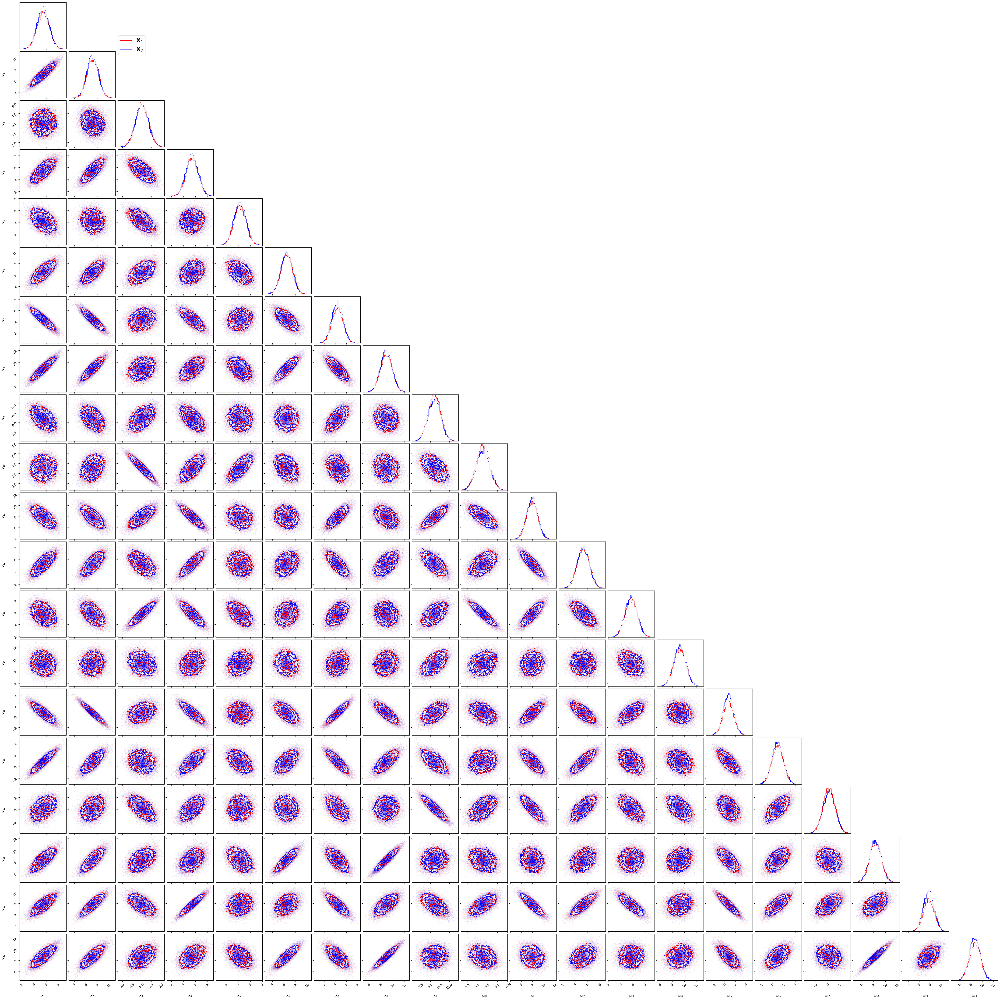

In [4]:
cornerplotter(dist_1 = dist_1, 
              dist_2 = dist_2, 
              path_to_plots = results_dir, 
              figure_name = "corner_plot.png",
              max_points = 10_000,
              max_dim = 32,
              n_bins = 50,
              show = True,
              save = True)

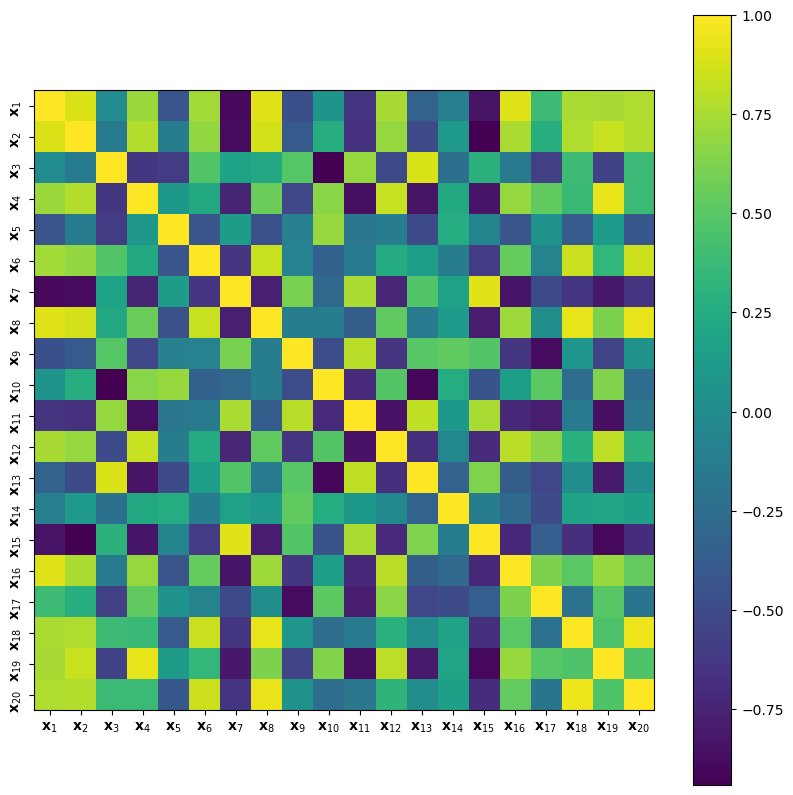

In [5]:
plot_corr_matrix(dist = dist_1,
                 path_to_plots = results_dir,
                 figure_name = "corre_matrix_plot.pdf",
                 max_points = 1_000_000,
                 show_labels = True,
                 show = True,
                 save = True)

# Fixed $n=10000$

## Null hypotheses

### Model definition

In [4]:
batch_size_test = 10_000

In [5]:
model_dir = results_dir + str(ndims) + "D_" + str(int(batch_size_test/1000)) + "K/"
if os.path.exists(model_dir):
    print("Model directory exists")
else:
    os.makedirs(model_dir)
    print("Model directory was created")
null_hypotheses_dir = model_dir + "null_hypothesis/"
if os.path.exists(null_hypotheses_dir):
    print("Null hypothesis directory exists")
else:
    os.makedirs(null_hypotheses_dir)
    print("Null hypothesis directory was created")
metrics_config_file = model_dir + "metrics_config.json"

Model directory exists
Null hypothesis directory exists


In [6]:
TwoSampleTestInputs = GMetrics.TwoSampleTestInputs(dist_1_input = dist_1,
                                                   dist_2_input = dist_2,
                                                   niter = niter,
                                                   batch_size_test = batch_size_test,
                                                   batch_size_gen = 10_000,
                                                   small_sample_threshold = 1e7,
                                                   dtype_input = tf.float64,
                                                   seed_input = 0,
                                                   use_tf = True,
                                                   mirror_strategy = False,
                                                   verbose = True)
print("nsamples",TwoSampleTestInputs.nsamples)
print("batch_size",TwoSampleTestInputs.batch_size_test)
print("niter",TwoSampleTestInputs.niter)
print("niter * batch_size",TwoSampleTestInputs.niter*TwoSampleTestInputs.batch_size_test)
print("small_sample",TwoSampleTestInputs.small_sample)

Parsing input distribution...
Input distribution is a tfp.distributions.Distribution object.
Parsing input distribution...
Input distribution is a tfp.distributions.Distribution object.
Checking and setting numerical distributions.
Resetting dist_num.
Resetting dist_num.
nsamples 100000000
batch_size 10000
niter 10000
niter * batch_size 100000000
small_sample False


In [7]:
FNMetric = GMetrics.FNMetric(TwoSampleTestInputs,
                             progress_bar = True,
                             verbose = True)
KSTest = GMetrics.KSTest(TwoSampleTestInputs,
                         progress_bar = True,
                         verbose = True)
SKSTest = GMetrics.SKSTest(TwoSampleTestInputs,
                           nslices = 100,
                           seed_slicing = 0,
                           progress_bar = True,
                           verbose = True)
SWDMetric = GMetrics.SWDMetric(TwoSampleTestInputs,
                               nslices = 100,
                               seed_slicing = 0,
                               progress_bar = True,
                               verbose = True)
FPDMetric = GMetrics.FPDMetric(TwoSampleTestInputs,
                               progress_bar = True,
                               verbose = True,
                               #min_samples_input = 20_000,
                               #max_samples_input = 50_000,
                               num_batches = 20)
KPDMetric = GMetrics.KPDMetric(TwoSampleTestInputs,
                               progress_bar = True,
                               verbose = True,
                               degree = 4,
                               block_size = 10_000,
                               num_batches = 1,
                               batch_size = 10_000)
LRMetric = GMetrics.LRMetric(TwoSampleTestInputs,
                             null_test=True,
                             verbose = True)

Generating random directions based on nslices, ndims, and seed_slicing.
Generating random directions based on nslices, ndims, and seed_slicing.
To run under the alternative hypothesis, set the `null_test` attribute to False.


### Set up tests and metrics configurations

In [8]:
test_config_null = {}
test_config_tmp = dict(TwoSampleTestInputs.__dict__)
keys_to_remove = ["_dist_1_input", "_dist_2_input", "_dist_1_num", "_dist_2_num", "_dist_1_symb", "_dist_2_symb", "_seed_generator"]
for key in keys_to_remove:
    test_config_tmp.pop(key, None)
for key, value in test_config_tmp.items():
    new_key = key.lstrip('_')
    
    if isinstance(value, tf.Tensor):
        new_value = value.numpy() # type: ignore
    elif isinstance(value, np.ndarray):
        new_value = value.tolist()
    elif isinstance(value, np.generic):
        new_value = value.item() # Convert NumPy scalars to Python scalars
    elif isinstance(value, tf.DType):
        new_value = value.name
    elif isinstance(value, np.dtype):
        new_value = np.dtype(value).name
    else:
        new_value = value
    
    test_config_null[new_key] = new_value

test_config_null["ncomp"] = ncomp

pd.DataFrame([test_config_null])

,niter,batch_size_test,batch_size_gen,small_sample_threshold,dtype_input,seed,use_tf,mirror_strategy,strategy,verbose,...,ndims_1,nsamples_1,is_symb_2,ndims_2,nsamples_2,dtype,ndims,nsamples,small_sample,ncomp
0,10000,10000,10000,10000000,float64,0,True,False,None,True,...,20,0,True,20,0,float64,20,100000000,False,5


In [9]:
unique_key = "config_ndims_"+str(TwoSampleTestInputs.ndims)+"_ncop_"+str(ncomp)+"_nsamples_"+str(TwoSampleTestInputs.batch_size_test)+"_niter_"+str(TwoSampleTestInputs.niter)
metrics_config = {unique_key: {"fn": {"name": "fn", # type: ignore
                                       "object_name": "FNMetric",
                                       "class_name": "GMetrics.FNMetric",
                                       "kwargs": {},
                                       "result_key": "metric_list", 
                                       "scale_func": lambda ns, ndims: np.sqrt(ns)/ndims,
                                       "scale_func_string": "lambda ns, ndims: np.sqrt(ns)/ndims",
                                       "test_config": test_config_null,
                                       "max_vectorize": 1000,
                                       "latex": "$\overline{\|\cdot\|}_{F}$",
                                       "null_file": null_hypotheses_dir+"FN.json"},
                               "fpd": {"name": "fpd",
                                       "object_name": "FPDMetric",
                                       "class_name": "GMetrics.FPDMetric",
                                       "kwargs": {},
                                       "result_key": "metric_list", 
                                       "scale_func": lambda ns, ndims: 1000,#(ns/ndims)**(3/2),
                                       "scale_func_string": "lambda ns, ndims: 1000",
                                       "test_config": test_config_null,
                                       "max_vectorize": 200,
                                       "latex": "$d_{\mathrm{FPD}}$",
                                       "null_file": null_hypotheses_dir+"FPD.json"},
                               "kpd": {"name": "kpd",
                                       "object_name": "KPDMetric" ,
                                       "class_name": "GMetrics.KPDMetric",
                                       "kwargs": {},
                                       "result_key": "metric_list", 
                                       "scale_func": lambda ns, ndims: 1000,#ns/np.sqrt(ndims),
                                       "scale_func_string": "lambda ns, ndims: 1000",
                                       "test_config": test_config_null,
                                       "max_vectorize": 10,
                                       "latex": "$d_{\mathrm{KPD}}$",
                                       "null_file": null_hypotheses_dir+"KPD.json"},
                               "ks":  {"name": "ks",
                                       "object_name": "KSTest",
                                       "class_name": "GMetrics.KSTest", 
                                       "kwargs": {},
                                       "result_key": "statistic_means", 
                                       "scale_func": lambda ns, _ : np.sqrt(ns),
                                       "scale_func_string": "lambda ns, _: np.sqrt(ns)",
                                       "test_config": test_config_null,
                                       "max_vectorize": 10000,
                                       "latex": "$\overline{D}$",
                                       "null_file": null_hypotheses_dir+"KS.json"},
                               "sks": {"name": "sks",
                                       "object_name": "SKSTest",
                                       "class_name": "GMetrics.SKSTest", 
                                       "kwargs": {"nslices": 100, "seed_slicing": 0},
                                       "result_key": "metric_means", 
                                       "scale_func": lambda ns, _ : np.sqrt(ns),
                                       "scale_func_string": "lambda ns, _: np.sqrt(ns)",
                                       "test_config": test_config_null,
                                       "max_vectorize": 200,
                                       "latex": "$\widetilde{D}$",
                                       "null_file": null_hypotheses_dir+"SKS.json"},
                               "swd": {"name": "swd",
                                       "object_name": "SWDMetric",
                                       "class_name": "GMetrics.SWDMetric", 
                                       "kwargs": {"nslices": 100, "seed_slicing": 0},
                                       "result_key": "metric_means", 
                                       "scale_func": lambda ns, ndims: np.sqrt(ns/ndims),
                                       "scale_func_string": "lambda ns, ndims: np.sqrt(ns/ndims)",
                                       "test_config": test_config_null,
                                       "max_vectorize": 200,
                                       "latex": "$\widetilde{W}$",
                                       "null_file": null_hypotheses_dir+"SWD.json"},
                               "lr": {"name": "lr",
                                       "object_name": "LRMetric",
                                       "class_name": "GMetrics.LRMetric", 
                                       "kwargs": {"null_test": True},
                                       "result_key": "lik_ratio_norm_list", 
                                       "scale_func": lambda ns, ndims: np.sqrt(ns),
                                       "scale_func_string": "lambda ns, ndims: np.sqrt(ns)",
                                       "test_config": test_config_null,
                                       "max_vectorize": 200,
                                       "latex": "$t_{\mu}$",
                                       "null_file": null_hypotheses_dir+"LR.json"}}}
metrics_config[unique_key]

{'fn': {'name': 'fn',
  'object_name': 'FNMetric',
  'class_name': 'GMetrics.FNMetric',
  'kwargs': {},
  'result_key': 'metric_list',
  'scale_func': <function __main__.<lambda>(ns, ndims)>,
  'scale_func_string': 'lambda ns, ndims: np.sqrt(ns)/ndims',
  'test_config': {'niter': 10000,
   'batch_size_test': 10000,
   'batch_size_gen': 10000,
   'small_sample_threshold': 10000000,
   'dtype_input': 'float64',
   'seed': 0,
   'use_tf': True,
   'mirror_strategy': False,
   'strategy': None,
   'verbose': True,
   'is_symb_1': True,
   'ndims_1': 20,
   'nsamples_1': 0,
   'is_symb_2': True,
   'ndims_2': 20,
   'nsamples_2': 0,
   'dtype': 'float64',
   'ndims': 20,
   'nsamples': 100000000,
   'small_sample': False,
   'ncomp': 5},
  'max_vectorize': 1000,
  'latex': '$\\overline{\\|\\cdot\\|}_{F}$',
  'null_file': 'results/20D_unimodal/20D_10K/null_hypothesis/FN.json'},
 'fpd': {'name': 'fpd',
  'object_name': 'FPDMetric',
  'class_name': 'GMetrics.FPDMetric',
  'kwargs': {},
  'resu

### Evaluate null hypotheses

In [10]:
for metric in list(metrics_config[unique_key].values())[:-1]:
    file = metric["null_file"]
    name = metric["name"]
    max_vectorize = metric["max_vectorize"]
    obj = eval(metric["object_name"])
    if os.path.exists(file):
        print(f"Loading {name} from {file}")
        obj.Results.load_from_json(file)
    else:
        print(f"Computing and savng {name} with max_vectorize = {max_vectorize}")
        obj.Test_tf(max_vectorize=max_vectorize)
        print(f"Saving {name} to {file}")
        obj.Results.save_to_json(file)

Loading fn from results/20D_unimodal/20D_10K/null_hypothesis/FN.json
Loading fpd from results/20D_unimodal/20D_10K/null_hypothesis/FPD.json
Loading kpd from results/20D_unimodal/20D_10K/null_hypothesis/KPD.json
Loading ks from results/20D_unimodal/20D_10K/null_hypothesis/KS.json
Loading sks from results/20D_unimodal/20D_10K/null_hypothesis/SKS.json
Loading swd from results/20D_unimodal/20D_10K/null_hypothesis/SWD.json


In [11]:
cl_list = [0.68, 0.95, 0.99]
null_times = []

for metric in list(metrics_config[unique_key].values())[:-1]:
    name = metric["name"]
    obj = eval(metric["object_name"])
    result_key = metric["result_key"]
    scale_func = metric["scale_func"]
    
    nsamples = obj.Inputs.batch_size_test
    ns = nsamples**2 /(2*nsamples)
    dist_null = np.array(obj.Results[-1].result_value[result_key])*scale_func(ns, ndims)

    metric_thresholds = [[cl, 
                          [int(cl*len(dist_null)), 
                           int((1-cl)*len(dist_null))], 
                          np.sort(dist_null)[int(len(dist_null)*cl)]] for cl in cl_list]
    print(f"ThresholdS for metric {metric['name']}: {metric_thresholds}")
    null_time = obj.Results[-1].__dict__['computing_time']
    null_times.append([name, int(null_time)])
    print(f"Computing time for metric {metric['name']}: {null_time}")
    
    metric.update({"thresholds": metric_thresholds})
    
metrics_config[unique_key]["lr"]["thresholds"] = []

GMetrics.utils.save_update_metrics_config(metrics_config = metrics_config, metrics_config_file = metrics_config_file) # type: ignore

ThresholdS for metric fn: [[0.68, [6800, 3199], 0.7477459610578648], [0.95, [9500, 500], 1.034390355610259], [0.99, [9900, 100], 1.229186086606777]]
Computing time for metric fn: 7.31236437195912
ThresholdS for metric fpd: [[0.68, [6800, 3199], 0.1771138324568747], [0.95, [9500, 500], 0.3160538254999027], [0.99, [9900, 100], 0.40505987443489444]]
Computing time for metric fpd: 134.6976195599418
ThresholdS for metric kpd: [[0.68, [6800, 3199], -0.012033598601579598], [0.95, [9500, 500], 0.01995323000025806], [0.99, [9900, 100], 0.027239979076387755]]
Computing time for metric kpd: 2089.2233647550456
ThresholdS for metric ks: [[0.68, [6800, 3199], 0.9096931791818235], [0.95, [9500, 500], 1.1101582103877128], [0.99, [9900, 100], 1.2526399518307625]]
Computing time for metric ks: 88.16029623011127
ThresholdS for metric sks: [[0.68, [6800, 3199], 0.9055213524073136], [0.95, [9500, 500], 1.0858332753076616], [0.99, [9900, 100], 1.2153754996184916]]
Computing time for metric sks: 353.35047717

,name,object_name,class_name,kwargs,result_key,scale_func,scale_func_string,test_config,max_vectorize,latex,null_file,thresholds
0,fn,FNMetric,GMetrics.FNMetric,{},metric_list,<function <lambda> at 0x7f1da7f3db40>,"lambda ns, ndims: np.sqrt(ns)/ndims","{'niter': 10000, 'batch_size_test': 10000, 'ba...",1000,$\overline{\|\cdot\|}_{F}$,results/20D_unimodal/20D_10K/null_hypothesis/F...,"[[0.68, [6800, 3199], 0.7477459610578648], [0...."
1,fpd,FPDMetric,GMetrics.FPDMetric,{},metric_list,<function <lambda> at 0x7f1da7f3fd90>,"lambda ns, ndims: 1000","{'niter': 10000, 'batch_size_test': 10000, 'ba...",200,$d_{\mathrm{FPD}}$,results/20D_unimodal/20D_10K/null_hypothesis/F...,"[[0.68, [6800, 3199], 0.1771138324568747], [0...."
2,kpd,KPDMetric,GMetrics.KPDMetric,{},metric_list,<function <lambda> at 0x7f1da7f3fe20>,"lambda ns, ndims: 1000","{'niter': 10000, 'batch_size_test': 10000, 'ba...",10,$d_{\mathrm{KPD}}$,results/20D_unimodal/20D_10K/null_hypothesis/K...,"[[0.68, [6800, 3199], -0.012033598601579598], ..."
3,ks,KSTest,GMetrics.KSTest,{},statistic_means,<function <lambda> at 0x7f1da7f3feb0>,"lambda ns, _: np.sqrt(ns)","{'niter': 10000, 'batch_size_test': 10000, 'ba...",10000,$\overline{D}$,results/20D_unimodal/20D_10K/null_hypothesis/K...,"[[0.68, [6800, 3199], 0.9096931791818235], [0...."
4,sks,SKSTest,GMetrics.SKSTest,"{'nslices': 100, 'seed_slicing': 0}",metric_means,<function <lambda> at 0x7f1da7f3ff40>,"lambda ns, _: np.sqrt(ns)","{'niter': 10000, 'batch_size_test': 10000, 'ba...",200,$\widetilde{D}$,results/20D_unimodal/20D_10K/null_hypothesis/S...,"[[0.68, [6800, 3199], 0.9055213524073136], [0...."
5,swd,SWDMetric,GMetrics.SWDMetric,"{'nslices': 100, 'seed_slicing': 0}",metric_means,<function <lambda> at 0x7f1c740a4040>,"lambda ns, ndims: np.sqrt(ns/ndims)","{'niter': 10000, 'batch_size_test': 10000, 'ba...",200,$\widetilde{W}$,results/20D_unimodal/20D_10K/null_hypothesis/S...,"[[0.68, [6800, 3199], 0.29513864231231307], [0..."
6,lr,LRMetric,GMetrics.LRMetric,{'null_test': True},lik_ratio_norm_list,<function <lambda> at 0x7f1c740a40d0>,"lambda ns, ndims: np.sqrt(ns)","{'niter': 10000, 'batch_size_test': 10000, 'ba...",200,$t_{\mu}$,results/20D_unimodal/20D_10K/null_hypothesis/L...,[]


### Plots of null-distributions

mu = 0.6809292614848871 +/- 0.00036692627842021446
sigma = 0.19155319846460786 +/- 0.001592352771275076
68%CL = 0.7477459610578648, 95%CL = 1.034390355610259, 99%CL = 1.229186086606777
mu = 0.6809292614848871 +/- 0.00036692627842021446
sigma = 0.19155319846460786 +/- 0.001592352771275076


/tmp/ipykernel_59766/2883636441.py:87: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax[0].set_ylim(current_ylim0)
/tmp/ipykernel_59766/2883636441.py:89: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend0.legendHandles[-3:]:
/tmp/ipykernel_59766/2883636441.py:126: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax[1].set_ylim(current_ylim1)
/tmp/ipykernel_59766/2883636441.py:132: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend1.legendHandles[-3:]:


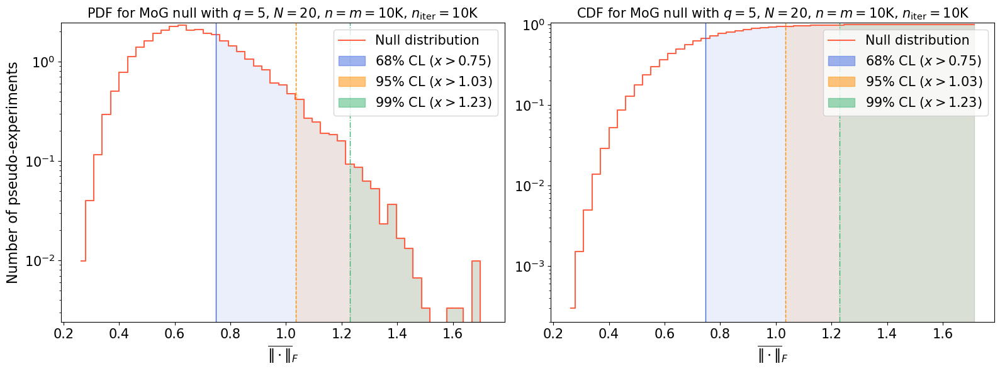

Time elapsed: 1.2136930390261114 seconds.
mu = 0.1672751968509893 +/- 4.915846052699955e-05
sigma = 0.07011309473058477 +/- 0.0010042791439932382
68%CL = 0.1771138324568747, 95%CL = 0.3160538254999027, 99%CL = 0.40505987443489444
mu = 0.1672751968509893 +/- 4.915846052699955e-05
sigma = 0.07011309473058477 +/- 0.0010042791439932382


/tmp/ipykernel_59766/2883636441.py:87: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax[0].set_ylim(current_ylim0)
/tmp/ipykernel_59766/2883636441.py:89: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend0.legendHandles[-3:]:
/tmp/ipykernel_59766/2883636441.py:126: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax[1].set_ylim(current_ylim1)
/tmp/ipykernel_59766/2883636441.py:132: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend1.legendHandles[-3:]:


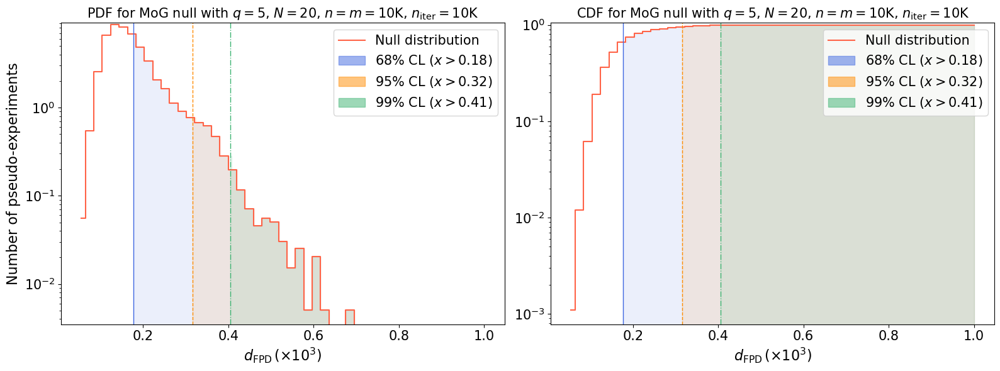

Time elapsed: 0.9596716130618006 seconds.
mu = -0.011558871279718596 +/- 1.6589618340875954e-06
sigma = 0.012880069231520441 +/- 0.0001239101339436183
68%CL = -0.012033598601579598, 95%CL = 0.01995323000025806, 99%CL = 0.027239979076387755
mu = -0.011558871279718596 +/- 1.6589618340875954e-06
sigma = 0.012880069231520441 +/- 0.0001239101339436183


/tmp/ipykernel_59766/2883636441.py:87: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax[0].set_ylim(current_ylim0)
/tmp/ipykernel_59766/2883636441.py:89: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend0.legendHandles[-3:]:
/tmp/ipykernel_59766/2883636441.py:126: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax[1].set_ylim(current_ylim1)
/tmp/ipykernel_59766/2883636441.py:132: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend1.legendHandles[-3:]:


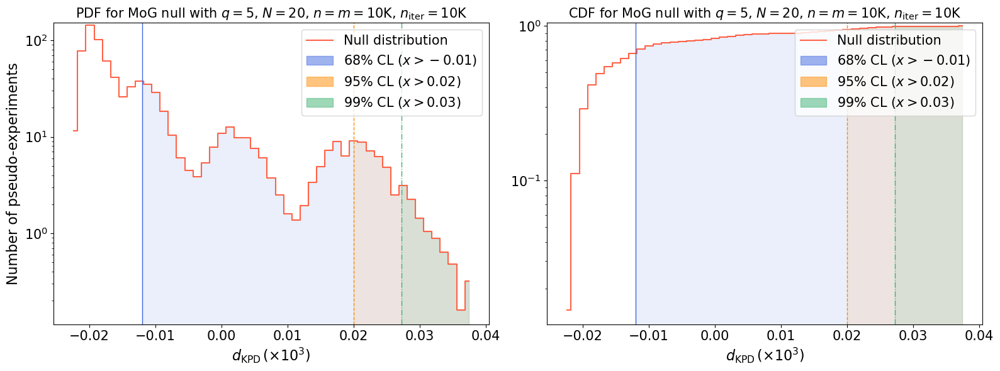

Time elapsed: 0.861061210045591 seconds.
mu = 0.8675272969822617 +/- 0.0001711878103761793
sigma = 0.13083875969152997 +/- 0.0012446963711001031
68%CL = 0.9096931791818235, 95%CL = 1.1101582103877128, 99%CL = 1.2526399518307625
mu = 0.8675272969822617 +/- 0.0001711878103761793
sigma = 0.13083875969152997 +/- 0.0012446963711001031


/tmp/ipykernel_59766/2883636441.py:87: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax[0].set_ylim(current_ylim0)
/tmp/ipykernel_59766/2883636441.py:89: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend0.legendHandles[-3:]:
/tmp/ipykernel_59766/2883636441.py:126: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax[1].set_ylim(current_ylim1)
/tmp/ipykernel_59766/2883636441.py:132: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend1.legendHandles[-3:]:


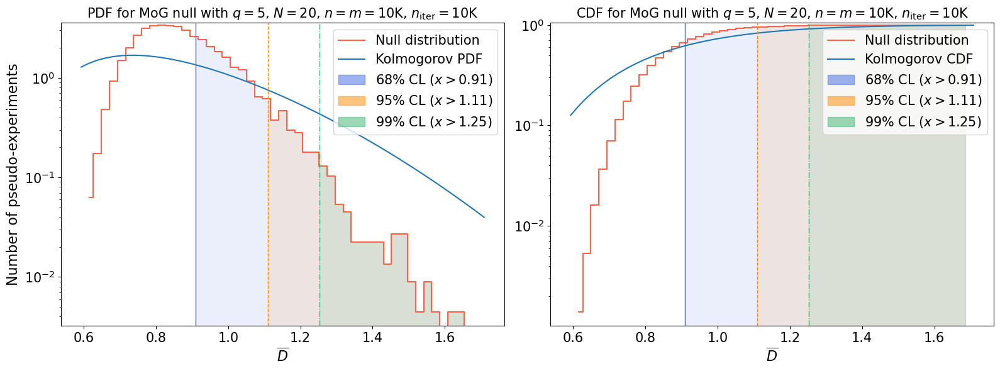

Time elapsed: 1.2018190850503743 seconds.
mu = 0.8666203877216206 +/- 0.0001356941764711491
sigma = 0.11648784334476671 +/- 0.0010318221418334234
68%CL = 0.9055213524073136, 95%CL = 1.0858332753076616, 99%CL = 1.2153754996184916
mu = 0.8666203877216206 +/- 0.0001356941764711491
sigma = 0.11648784334476671 +/- 0.0010318221418334234


/tmp/ipykernel_59766/2883636441.py:87: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax[0].set_ylim(current_ylim0)
/tmp/ipykernel_59766/2883636441.py:89: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend0.legendHandles[-3:]:
/tmp/ipykernel_59766/2883636441.py:126: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax[1].set_ylim(current_ylim1)
/tmp/ipykernel_59766/2883636441.py:132: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend1.legendHandles[-3:]:


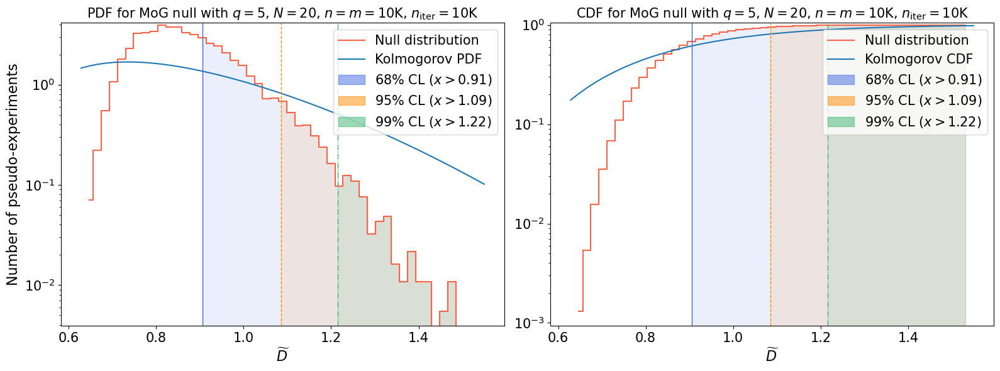

Time elapsed: 1.2310164491645992 seconds.
mu = 0.28082542588476106 +/- 2.9050911844928535e-05
sigma = 0.05389889780406324 +/- 0.0005516126150339552
68%CL = 0.29513864231231307, 95%CL = 0.38632885428667824, 99%CL = 0.44667903738078857
mu = 0.28082542588476106 +/- 2.9050911844928535e-05
sigma = 0.05389889780406324 +/- 0.0005516126150339552


/tmp/ipykernel_59766/2883636441.py:87: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax[0].set_ylim(current_ylim0)
/tmp/ipykernel_59766/2883636441.py:89: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend0.legendHandles[-3:]:
/tmp/ipykernel_59766/2883636441.py:126: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax[1].set_ylim(current_ylim1)
/tmp/ipykernel_59766/2883636441.py:132: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend1.legendHandles[-3:]:


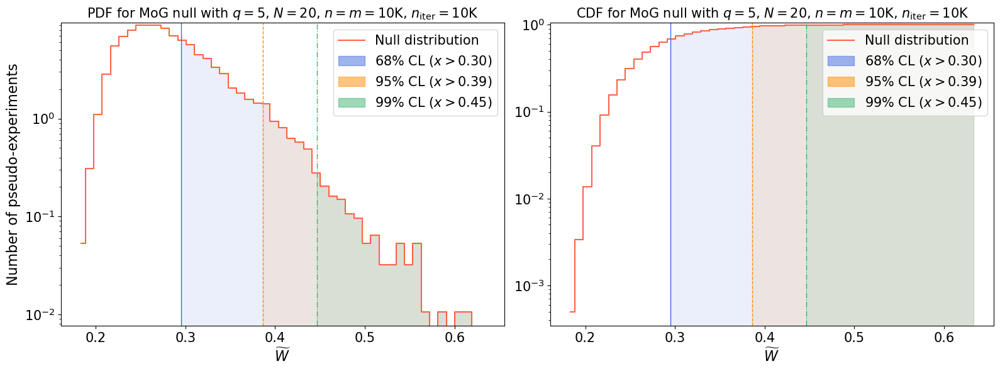

Time elapsed: 0.9326996630989015 seconds.


,name,object_name,class_name,kwargs,result_key,scale_func,scale_func_string,test_config,max_vectorize,latex,null_file,thresholds,null_figure
0,fn,FNMetric,GMetrics.FNMetric,{},metric_list,<function <lambda> at 0x7f1da7f3db40>,"lambda ns, ndims: np.sqrt(ns)/ndims","{'niter': 10000, 'batch_size_test': 10000, 'ba...",1000,$\overline{\|\cdot\|}_{F}$,results/20D_unimodal/20D_10K/null_hypothesis/F...,"[[0.68, [6800, 3199], 0.7477459610578648], [0....",results/20D_unimodal/20D_10K/null_hypothesis/F...
1,fpd,FPDMetric,GMetrics.FPDMetric,{},metric_list,<function <lambda> at 0x7f1da7f3fd90>,"lambda ns, ndims: 1000","{'niter': 10000, 'batch_size_test': 10000, 'ba...",200,$d_{\mathrm{FPD}}$,results/20D_unimodal/20D_10K/null_hypothesis/F...,"[[0.68, [6800, 3199], 0.1771138324568747], [0....",results/20D_unimodal/20D_10K/null_hypothesis/F...
2,kpd,KPDMetric,GMetrics.KPDMetric,{},metric_list,<function <lambda> at 0x7f1da7f3fe20>,"lambda ns, ndims: 1000","{'niter': 10000, 'batch_size_test': 10000, 'ba...",10,$d_{\mathrm{KPD}}$,results/20D_unimodal/20D_10K/null_hypothesis/K...,"[[0.68, [6800, 3199], -0.012033598601579598], ...",results/20D_unimodal/20D_10K/null_hypothesis/K...
3,ks,KSTest,GMetrics.KSTest,{},statistic_means,<function <lambda> at 0x7f1da7f3feb0>,"lambda ns, _: np.sqrt(ns)","{'niter': 10000, 'batch_size_test': 10000, 'ba...",10000,$\overline{D}$,results/20D_unimodal/20D_10K/null_hypothesis/K...,"[[0.68, [6800, 3199], 0.9096931791818235], [0....",results/20D_unimodal/20D_10K/null_hypothesis/K...
4,sks,SKSTest,GMetrics.SKSTest,"{'nslices': 100, 'seed_slicing': 0}",metric_means,<function <lambda> at 0x7f1da7f3ff40>,"lambda ns, _: np.sqrt(ns)","{'niter': 10000, 'batch_size_test': 10000, 'ba...",200,$\widetilde{D}$,results/20D_unimodal/20D_10K/null_hypothesis/S...,"[[0.68, [6800, 3199], 0.9055213524073136], [0....",results/20D_unimodal/20D_10K/null_hypothesis/S...
5,swd,SWDMetric,GMetrics.SWDMetric,"{'nslices': 100, 'seed_slicing': 0}",metric_means,<function <lambda> at 0x7f1c740a4040>,"lambda ns, ndims: np.sqrt(ns/ndims)","{'niter': 10000, 'batch_size_test': 10000, 'ba...",200,$\widetilde{W}$,results/20D_unimodal/20D_10K/null_hypothesis/S...,"[[0.68, [6800, 3199], 0.29513864231231307], [0...",results/20D_unimodal/20D_10K/null_hypothesis/S...
6,lr,LRMetric,GMetrics.LRMetric,{'null_test': True},lik_ratio_norm_list,<function <lambda> at 0x7f1c740a40d0>,"lambda ns, ndims: np.sqrt(ns)","{'niter': 10000, 'batch_size_test': 10000, 'ba...",200,$t_{\mu}$,results/20D_unimodal/20D_10K/null_hypothesis/L...,[],NaN


In [12]:
for metric in list(metrics_config[unique_key].values())[:-1]:
    name = metric["name"]
    name_cap = name.upper()
    latex = metric["latex"]
    if "FPD" in latex:
        latex = r"$d_{\mathrm{FPD}}\,(\times 10^{3})$"
    elif "KPD" in latex:
        latex = r"$d_{\mathrm{KPD}}\,(\times 10^{3})$"
    obj = eval(metric["object_name"])
    result_key = metric["result_key"]
    scale_func = metric["scale_func"]
    figure_file = metric["null_file"].replace("json","pdf")
    thresholds = metric["thresholds"]

    start = timer()
    
    nsamples = obj.Inputs.batch_size_test
    niter = obj.Inputs.niter
    ns = nsamples**2 /(2*nsamples)
    dist_null = np.array(obj.Results[-1].result_value[result_key])*scale_func(ns, ndims)

    scale = 'log'
    num_bins = 50  # number of bins|
    
    mu, deltamu, sigma, deltasigma = (np.mean(dist_null), se_mean(dist_null), np.std(dist_null), se_std(dist_null))
    sigma_68, sigma_95, sigma_99 = [np.sort(dist_null)[int(len(dist_null)*cl)] for cl in [0.68, 0.95, 0.99]]
    print(f"mu = {mu} +/- {deltamu}")
    print(f"sigma = {sigma} +/- {deltasigma}")
    print(f"68%CL = {sigma_68}, 95%CL = {sigma_95}, 99%CL = {sigma_99}")
    
    print("mu =", mu, "+/-", deltamu)
    print("sigma =", sigma, "+/-", deltasigma)
    
    min_x, max_x = min(dist_null), max(dist_null) # lower and upper limit of the binning
    x = np.linspace(min_x, max_x, num_bins + 1)
    counts, bin_edges = np.histogram(dist_null, bins=x, density=True)
    cum_counts = np.cumsum(counts)/np.sum(counts)
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
    
    # Only if metric is KS-derived plot the theoretical distribution
    if "ks" in name:
        # Calculate the theoretical PDF and CDF of the KS distribution for each x value
        theoretical_pdf_ks = kstwobign.pdf(x)
        theoretical_cdf_ks = kstwobign.cdf(x)

        # Empirical SKS Normal
        empirical_pdf_norm = norm.pdf(x, loc=kstwobign.mean(), scale=kstwobign.std())
        empirical_cdf_norm = norm.cdf(x, loc=kstwobign.mean(), scale=kstwobign.std())

    fig, ax = plt.subplots(1, 2, figsize=(16, 6))
    
    dash_styles = ['-', '--', '-.']
    colors = ["royalblue", "darkorange", "mediumseagreen"]
    
    # Create step plot
    step_edges = np.convolve(bin_centers, [0.5, 0.5], 'valid')
    step_counts = counts[:-1]  # assuming counts is one element longer than step_edges

    ax[0].step(step_edges, step_counts, where='mid', linestyle='-', color = "tomato", label = "Null distribution")
    current_ylim0 = ax[0].get_ylim()
    if "ks" in name:
        ax[0].plot(x, theoretical_pdf_ks, label="Kolmogorov PDF")
    ax[0].set_yscale(scale)
    ax[0].set_xlabel(r"%s"%latex, fontsize=16)
    ax[0].set_ylabel('Number of pseudo-experiments', fontsize=16)
    ax[0].set_title('PDF for MoG null with $q = '+str(ncomp)+'$, $N = '+str(ndims)+'$, $n=m='+str(int(nsamples/1000))+'$K, $n_{\mathrm{iter}} = '+str(int(niter/1000))+'$K', fontsize=15)
    ax[0].tick_params(axis='x', labelsize=15)  # Set x-axis tick label size
    ax[0].tick_params(axis='y', labelsize=15)  # Set y-axis tick label size

    
    #for i, threshold in enumerate(thresholds):
    #    confidence_level, _, threshold_value = threshold
    #    closest_edge = bin_edges[np.argmin(np.abs(bin_edges - threshold_value))]
    #    ax[0].fill_betweenx([0, 2*counts.max()], closest_edge, bin_edges[-1], color=colors[i], alpha=0.1, step='mid', label=f"{int(confidence_level * 100)} CL% ($x>{format(threshold_value,'.2f')}$)")
    #    ax[0].axvline(x=closest_edge, linestyle=dash_styles[i], color=colors[i], linewidth=1)#, label=f'{int(confidence_level * 100)}% threshold')
    
    for i, threshold in enumerate(thresholds):
        confidence_level, _, threshold_value = threshold
        start_index = np.searchsorted(step_edges, threshold_value, side="right") - 1
        start_index = max(start_index, 0)
        fill_x_range = np.concatenate([[threshold_value], step_edges[start_index+1:]])
        fill_y_values = step_counts[start_index:]
        if len(fill_x_range) > 1 and len(fill_y_values) > 0:
            ax[0].fill_between(fill_x_range, 0, fill_y_values, color=colors[i], alpha=0.1, step='mid', label=f"{int(confidence_level * 100)}% CL ($x>{format(threshold_value, '.2f')}   $)")
        ax[0].axvline(x=threshold_value, linestyle=dash_styles[i], color=colors[i], linewidth=1)

    ax[0].set_ylim(current_ylim0)  
    legend0 = ax[0].legend(loc='upper right', fontsize=15)
    for handle in legend0.legendHandles[-3:]:
        handle.set_alpha(0.5)  # Set to desired alpha value
    
    # Create step plot
    step_edges = np.convolve(bin_centers, [0.5, 0.5], 'valid')
    step_counts = cum_counts[:-1]  # assuming counts is one element longer than step_edges
    
    ax[1].step(step_edges, step_counts, where='mid', linestyle='-', color = "tomato", label = "Null distribution")
    #ax[1].plot(bin_centers, cum_counts, linestyle = '-', color = "tomato", label = "Null distribution", drawstyle='steps-mid')
    current_ylim1 = ax[1].get_ylim()
    if "ks" in name:
        ax[1].plot(x, theoretical_cdf_ks, label="Kolmogorov CDF")
    #for i, threshold in enumerate(thresholds):
    #    confidence_level, _, threshold_value = threshold
    #    ax[1].axhline(y=confidence_level, color=colors[i], linestyle=dash_styles[i], linewidth=0.5, alpha=1)
    ax[1].set_yscale(scale)
    ax[1].set_xlabel(r"%s"%latex, fontsize=16)
    ax[1].set_title('CDF for MoG null with $q = '+str(ncomp)+'$, $N = '+str(ndims)+'$, $n=m='+str(int(nsamples/1000))+'$K, $n_{\mathrm{iter}} = '+str(int(niter/1000))+'$K', fontsize=15)
    ax[1].tick_params(axis='x', labelsize=15)  # Set x-axis tick label size
    ax[1].tick_params(axis='y', labelsize=15)  # Set y-axis tick label size
    
    #for i, threshold in enumerate(thresholds):
    #    confidence_level, _, threshold_value = threshold
    #    closest_edge = bin_edges[np.argmin(np.abs(bin_edges - threshold_value))]
    #    ax[1].fill_betweenx([0, 2*counts.max()], closest_edge, bin_edges[-1], color=colors[i], alpha=0.1, step='mid', label=f"{int(confidence_level * 100)} CL% ($x>{format(threshold_value,'.2f')}$)")
    #    ax[1].axvline(x=closest_edge, linestyle=dash_styles[i], color=colors[i], linewidth=1)#, label=f'{int(confidence_level * 100)}% threshold')
    
    for i, threshold in enumerate(thresholds):
        confidence_level, _, threshold_value = threshold
        start_index = np.searchsorted(step_edges, threshold_value, side="right") - 1
        start_index = max(start_index, 0)
        fill_x_range = np.concatenate([[threshold_value], step_edges[start_index+1:]])
        fill_y_values = step_counts[start_index:]
        if len(fill_x_range) > 1 and len(fill_y_values) > 0:
            ax[1].fill_between(fill_x_range, 0, fill_y_values, color=colors[i], alpha=0.1, step='mid', label=f"{int(confidence_level * 100)}% CL ($x>{format(threshold_value, '.2f')}   $)")
        ax[1].axvline(x=threshold_value, linestyle=dash_styles[i], color=colors[i], linewidth=1)
    
    ax[1].set_ylim(current_ylim1)  
    #for i, threshold in enumerate(thresholds):
    #    confidence, _, value = threshold
    #    ax[1].axvline(x=value, color=colors[i], linestyle=dash_styles[i], alpha=1, label=f"{int(confidence_level * 100)} CL% ($x>{format(threshold_value,'.2f')}$)")
    
    legend1 = ax[1].legend(loc='upper right', fontsize=15)
    for handle in legend1.legendHandles[-3:]:
        handle.set_alpha(0.5)  # Set to desired alpha value
    
    plt.subplots_adjust(wspace=0.1)  # Adjust this value to your liking
    plt.tight_layout()
    plt.savefig(figure_file)
    plt.show()
    plt.close()
    
    metric.update({"null_figure": figure_file})

    end = timer()
    print("Time elapsed:", end-start, "seconds.")

GMetrics.utils.save_update_metrics_config(metrics_config = metrics_config, metrics_config_file = metrics_config_file) # type: ignore

## Alternative hypotheses and results

### Scan and exclusion limits (bisection method)

In [13]:
if test_config_null["use_tf"]:
    dtype = getattr(tf, test_config_null["dtype_input"])
else:
    dtype = np.dtype(test_config_null["dtype_input"])
test_kwargs = {"niter": 10,
               "batch_size_test": test_config_null["batch_size_test"],
               "batch_size_gen": test_config_null["batch_size_gen"],
               "small_sample_threshold": test_config_null["small_sample_threshold"],
               "dtype_input": dtype,
               "seed_input": test_config_null["seed"],
               "use_tf": test_config_null["use_tf"],
               "mirror_strategy": test_config_null["mirror_strategy"],
               "verbose": False}

In [14]:
file_path = model_dir + "exclusion_limits.json"
if os.path.exists(file_path):
    try:
        with open(file_path, "r") as file:
            existing_data = json.load(file)
    except json.JSONDecodeError:
        existing_data = {}
else:
    existing_data = {}

In [15]:
deformations = ["mean", "std", "off", "cov", "mean_std", "mean_off", "mean_cov"]
global_results = {}

for metric_config in list(metrics_config[unique_key].values())[:-1]:
    for deformation in deformations:
        result = {k: v for k, v in {k: v for k, v in existing_data.items() if v["null_config"]["name"] == metric_config["name"] and v["deformation"] == deformation}.items() if v["exclusion_list"] != []}
        if result == {}:
            print(f"Computing exclusion limits for {metric_config['name']} with {deformation} deformation.")
            result = compute_exclusion_bisection(metric_config = metric_config,
                                                 test_kwargs = test_kwargs,
                                                 model_dir = model_dir,
                                                 deformation = deformation,
                                                 seed_dist = 0,
                                                 x_tol = 0.01,
                                                 fn_tol = 0.01,
                                                 eps_min = 0.,
                                                 eps_max = 50.,
                                                 max_iterations = 100,
                                                 save = True,
                                                 verbose = True)
        else:
            print(f"Exclusion limits for {metric_config['name']} with {deformation} deformation already loaded.")
        global_results.update(result)
print(global_results.keys())

Exclusion limits for fn with mean deformation already loaded.
Exclusion limits for fn with std deformation already loaded.
Exclusion limits for fn with off deformation already loaded.
Exclusion limits for fn with cov deformation already loaded.
Exclusion limits for fn with mean_std deformation already loaded.
Exclusion limits for fn with mean_off deformation already loaded.
Exclusion limits for fn with mean_cov deformation already loaded.
Exclusion limits for fpd with mean deformation already loaded.
Exclusion limits for fpd with std deformation already loaded.
Exclusion limits for fpd with off deformation already loaded.
Exclusion limits for fpd with cov deformation already loaded.
Exclusion limits for fpd with mean_std deformation already loaded.
Exclusion limits for fpd with mean_off deformation already loaded.
Exclusion limits for fpd with mean_cov deformation already loaded.
Exclusion limits for kpd with mean deformation already loaded.
Exclusion limits for kpd with std deformatio

### Likelihood-ratio test

In [16]:
if test_config_null["use_tf"]:
    dtype = getattr(tf, test_config_null["dtype_input"])
else:
    dtype = np.dtype(test_config_null["dtype_input"])
test_kwargs = {"niter": 10_000,
               "batch_size_test": test_config_null["batch_size_test"],
               "batch_size_gen": test_config_null["batch_size_gen"],
               "small_sample_threshold": test_config_null["small_sample_threshold"],
               "dtype_input": dtype,
               "seed_input": test_config_null["seed"],
               "use_tf": test_config_null["use_tf"],
               "mirror_strategy": test_config_null["mirror_strategy"],
               "verbose": True}
metrics_config[unique_key]["lr"]['kwargs']["verbose"] = True

In [17]:
deformations = ["mean", "std", "off", "cov", "mean_std", "mean_off", "mean_cov"]

for deformation in deformations:
    result = {k: v for k, v in existing_data.items() if v["null_config"]["name"] == "lr" and v["deformation"] == deformation}
    if result == {}:
        print(f"Computing exclusion limits for lr with {deformation} deformation.")
        result = compute_exclusion_LR_bisection(metric_config = metrics_config[unique_key]["lr"],
                                                test_kwargs = test_kwargs,
                                                model_dir = model_dir,
                                                cl_list = [0.95, 0.99],
                                                deformation = deformation,
                                                seed_dist = 0,
                                                x_tol = 0.01,
                                                fn_tol = 0.01,
                                                eps_min = 0.,
                                                eps_max = 0.1,
                                                max_iterations = 100,
                                                save = True,
                                                verbose = True)
    else:
        print(f"Exclusion limits for LR with {deformation} deformation already loaded.")
    global_results.update(result)
print(global_results.keys())

Exclusion limits for LR with mean deformation already loaded.
Exclusion limits for LR with std deformation already loaded.
Exclusion limits for LR with off deformation already loaded.
Exclusion limits for LR with cov deformation already loaded.
Exclusion limits for LR with mean_std deformation already loaded.
Exclusion limits for LR with mean_off deformation already loaded.
Exclusion limits for LR with mean_cov deformation already loaded.
dict_keys(['2024-04-16T10:53:05.690856', '2024-04-16T10:54:22.486677', '2024-04-16T10:55:48.479829', '2024-04-16T10:57:19.444042', '2024-04-16T10:58:16.874669', '2024-04-16T10:59:43.268255', '2024-04-16T11:01:14.214558', '2024-04-16T11:02:31.254172', '2024-04-16T11:04:58.950935', '2024-04-16T11:07:28.487496', '2024-04-16T11:10:12.864112', '2024-04-16T11:12:30.320204', '2024-04-16T11:15:09.084510', '2024-04-16T11:18:00.409770', '2024-04-16T11:20:30.105916', '2024-04-16T14:43:43.915093', '2024-04-16T14:45:21.064406', '2024-04-16T14:47:00.742996', '2024-

### Show and save results

In [18]:
global_results_list = [x for x in global_results.values()]
results = []
for global_result in global_results_list:
    name = global_result["null_config"]["name"]
    print(f"Metric: {name}")
    deformation = global_result["deformation"]
    ndims = global_result["null_config"]["test_config"]["ndims"]
    niter = global_result["null_config"]["test_config"]["niter"]
    nsamples = global_result["null_config"]["test_config"]["batch_size_test"]
    try:
        exclusion_95 = eval(format(global_result["exclusion_list"][0][2], ".5f"))
    except:
        exclusion_95 = "N/A"
    try:
        exclusion_99 = eval(format(global_result["exclusion_list"][1][2], ".5f"))
    except:
        exclusion_99 = "N/A"
    time_elapsed = global_result["time_elapsed"]
    #print(exclusion_95)
    #print(round_to_n_significant_digits(exclusion_95, 3))
    results.append([name, deformation, ndims, niter, nsamples, exclusion_95, exclusion_99, int(time_elapsed)])
    #results.append([name, deformation, ndims, niter, nsamples, round_to_n_significant_digits(exclusion_95, 3), round_to_n_significant_digits(exclusion_99, 3), int(time_elapsed)])
results_df = pd.DataFrame(results, columns=["Statistic", "Deformation", "$N$", "$n=m$", "$n_{\\mathrm{iter}}$", "$\\epsilon_{95\\%\\mathrm{CL}}$", "$\\epsilon_{99\\%\\mathrm{CL}}$", "t (s)"])
times_df = pd.DataFrame(null_times+[["lr", "-"]], columns=["Statistic", "$t^{\\mathrm{null}}$ (s)"])

Metric: fn
Metric: fn
Metric: fn
Metric: fn
Metric: fn
Metric: fn
Metric: fn
Metric: fpd
Metric: fpd
Metric: fpd
Metric: fpd
Metric: fpd
Metric: fpd
Metric: fpd
Metric: kpd
Metric: kpd
Metric: kpd
Metric: kpd
Metric: kpd
Metric: kpd
Metric: kpd
Metric: ks
Metric: ks
Metric: ks
Metric: ks
Metric: ks
Metric: ks
Metric: ks
Metric: sks
Metric: sks
Metric: sks
Metric: sks
Metric: sks
Metric: sks
Metric: sks
Metric: swd
Metric: swd
Metric: swd
Metric: swd
Metric: swd
Metric: swd
Metric: swd
Metric: lr
Metric: lr
Metric: lr
Metric: lr
Metric: lr
Metric: lr
Metric: lr


In [19]:
results_df_mean = results_df[results_df["Deformation"] == "mean"]
results_df_std = results_df[results_df["Deformation"] == "std"]
results_df_off = results_df[results_df["Deformation"] == "off"]
results_df_cov = results_df[results_df["Deformation"] == "cov"]
results_df_mean_std = results_df[results_df["Deformation"] == "mean_std"]
results_df_mean_off = results_df[results_df["Deformation"] == "mean_off"]
results_df_mean_cov = results_df[results_df["Deformation"] == "mean_cov"]

In [20]:
sorted_df_mean = results_df_mean.sort_values(by="$\\epsilon_{95\\%\\mathrm{CL}}$", ascending=True)
sorted_df_mean.rename(columns={"$\\epsilon_{95\\%\\mathrm{CL}}$": "$\\epsilon^{\\mu}_{95\\%\\mathrm{CL}}$", "$\\epsilon_{99\\%\\mathrm{CL}}$": "$\\epsilon^{\\mu}_{99\\%\\mathrm{CL}}$", "t (s)": "$t^{\\mu}$ (s)"}, inplace=True)
display(sorted_df_mean)
sorted_df_mean.drop(columns=["Deformation","$N$","$n=m$","$n_{\\mathrm{iter}}$"], inplace=True)
display(sorted_df_mean)

,Statistic,Deformation,$N$,$n=m$,$n_{\mathrm{iter}}$,$\epsilon^{\mu}_{95\%\mathrm{CL}}$,$\epsilon^{\mu}_{99\%\mathrm{CL}}$,$t^{\mu}$ (s)
42,lr,mean,20,10000,10000,0.00325,0.00442,372
35,swd,mean,20,10000,10000,0.03128,0.04144,132
7,fpd,mean,20,10000,10000,0.03232,0.04399,147
28,sks,mean,20,10000,10000,0.03372,0.04600,208
21,ks,mean,20,10000,10000,0.03952,0.05330,136
0,fn,mean,20,10000,10000,0.06683,0.09785,76
14,kpd,mean,20,10000,10000,0.59204,0.64585,109


,Statistic,$\epsilon^{\mu}_{95\%\mathrm{CL}}$,$\epsilon^{\mu}_{99\%\mathrm{CL}}$,$t^{\mu}$ (s)
42,lr,0.00325,0.00442,372
35,swd,0.03128,0.04144,132
7,fpd,0.03232,0.04399,147
28,sks,0.03372,0.04600,208
21,ks,0.03952,0.05330,136
0,fn,0.06683,0.09785,76
14,kpd,0.59204,0.64585,109


In [21]:
sorted_df_std = results_df_std.sort_values(by="$\\epsilon_{95\\%\\mathrm{CL}}$", ascending=True)
sorted_df_std.rename(columns={"$\\epsilon_{95\\%\\mathrm{CL}}$": "$\\epsilon^{\\sigma}_{95\\%\\mathrm{CL}}$", "$\\epsilon_{99\\%\\mathrm{CL}}$": "$\\epsilon^{\\sigma}_{99\\%\\mathrm{CL}}$", "t (s)": "$t^{\\sigma}$ (s)"}, inplace=True)
display(sorted_df_std)
sorted_df_std.drop(columns=["Deformation","$N$","$n=m$","$n_{\\mathrm{iter}}$"], inplace=True)
display(sorted_df_std)

,Statistic,Deformation,$N$,$n=m$,$n_{\mathrm{iter}}$,$\epsilon^{\sigma}_{95\%\mathrm{CL}}$,$\epsilon^{\sigma}_{99\%\mathrm{CL}}$,$t^{\sigma}$ (s)
43,lr,std,20,10000,10000,0.00027,0.00035,520
8,fpd,std,20,10000,10000,0.01125,0.01456,149
1,fn,std,20,10000,10000,0.01823,0.02591,85
36,swd,std,20,10000,10000,0.03464,0.04600,133
29,sks,std,20,10000,10000,0.03494,0.04843,216
22,ks,std,20,10000,10000,0.06256,0.08396,132
15,kpd,std,20,10000,10000,7.34863,8.11919,97


,Statistic,$\epsilon^{\sigma}_{95\%\mathrm{CL}}$,$\epsilon^{\sigma}_{99\%\mathrm{CL}}$,$t^{\sigma}$ (s)
43,lr,0.00027,0.00035,520
8,fpd,0.01125,0.01456,149
1,fn,0.01823,0.02591,85
36,swd,0.03464,0.04600,133
29,sks,0.03494,0.04843,216
22,ks,0.06256,0.08396,132
15,kpd,7.34863,8.11919,97


In [22]:
sorted_df_off = results_df_off.sort_values(by="$\\epsilon_{95\\%\\mathrm{CL}}$", ascending=True)
sorted_df_off.rename(columns={"$\\epsilon_{95\\%\\mathrm{CL}}$": "$\\epsilon^{\\Sigma_{ij}-\\Sigma_{ii}}_{95\\%\\mathrm{CL}}$", "$\\epsilon_{99\\%\\mathrm{CL}}$": "$\\epsilon^{\\Sigma_{ij}-\\Sigma_{ii}}_{99\\%\\mathrm{CL}}$", "t (s)": "$t^{\\Sigma_{ij}-\\Sigma_{ii}}$ (s)"}, inplace=True)
display(sorted_df_off)
sorted_df_off.drop(columns=["Deformation","$N$","$n=m$","$n_{\\mathrm{iter}}$"], inplace=True)
display(sorted_df_off)

,Statistic,Deformation,$N$,$n=m$,$n_{\mathrm{iter}}$,$\epsilon^{\Sigma_{ij}-\Sigma_{ii}}_{95\%\mathrm{CL}}$,$\epsilon^{\Sigma_{ij}-\Sigma_{ii}}_{99\%\mathrm{CL}}$,$t^{\Sigma_{ij}-\Sigma_{ii}}$ (s)
44,lr,off,20,10000,10000,0.00014,0.00018,555
9,fpd,off,20,10000,10000,0.00570,0.00751,164
2,fn,off,20,10000,10000,0.00904,0.01273,90
30,sks,off,20,10000,10000,0.02373,0.03360,221
37,swd,off,20,10000,10000,0.02571,0.03497,140
23,ks,off,20,10000,10000,0.06195,0.08275,127
16,kpd,off,20,10000,10000,7.21436,8.02912,99


,Statistic,$\epsilon^{\Sigma_{ij}-\Sigma_{ii}}_{95\%\mathrm{CL}}$,$\epsilon^{\Sigma_{ij}-\Sigma_{ii}}_{99\%\mathrm{CL}}$,$t^{\Sigma_{ij}-\Sigma_{ii}}$ (s)
44,lr,0.00014,0.00018,555
9,fpd,0.00570,0.00751,164
2,fn,0.00904,0.01273,90
30,sks,0.02373,0.03360,221
37,swd,0.02571,0.03497,140
23,ks,0.06195,0.08275,127
16,kpd,7.21436,8.02912,99


In [23]:
sorted_df_cov = results_df_cov.sort_values(by="$\\epsilon_{95\\%\\mathrm{CL}}$", ascending=True)
sorted_df_cov.rename(columns={"$\\epsilon_{95\\%\\mathrm{CL}}$": "$\\epsilon^{\\Sigma_{ij}}_{95\\%\\mathrm{CL}}$", "$\\epsilon_{99\\%\\mathrm{CL}}$": "$\\epsilon^{\\Sigma_{ij}}_{99\\%\\mathrm{CL}}$", "t (s)": "$t^{\\Sigma_{ij}}$ (s)"}, inplace=True)
display(sorted_df_cov)
sorted_df_cov.drop(columns=["Deformation","$N$","$n=m$","$n_{\\mathrm{iter}}$"], inplace=True)
display(sorted_df_cov)

,Statistic,Deformation,$N$,$n=m$,$n_{\mathrm{iter}}$,$\epsilon^{\Sigma_{ij}}_{95\%\mathrm{CL}}$,$\epsilon^{\Sigma_{ij}}_{99\%\mathrm{CL}}$,$t^{\Sigma_{ij}}$ (s)
45,lr,cov,20,10000,10000,0.00554,0.00766,317
10,fpd,cov,20,10000,10000,0.03799,0.05117,137
38,swd,cov,20,10000,10000,0.04471,0.05786,129
31,sks,cov,20,10000,10000,0.05722,0.07743,207
24,ks,cov,20,10000,10000,0.06195,0.08335,135
3,fn,cov,20,10000,10000,0.52979,0.70222,57
17,kpd,cov,20,10000,10000,7.05566,7.95733,95


,Statistic,$\epsilon^{\Sigma_{ij}}_{95\%\mathrm{CL}}$,$\epsilon^{\Sigma_{ij}}_{99\%\mathrm{CL}}$,$t^{\Sigma_{ij}}$ (s)
45,lr,0.00554,0.00766,317
10,fpd,0.03799,0.05117,137
38,swd,0.04471,0.05786,129
31,sks,0.05722,0.07743,207
24,ks,0.06195,0.08335,135
3,fn,0.52979,0.70222,57
17,kpd,7.05566,7.95733,95


In [24]:
sorted_df_mean_std = results_df_mean_std.sort_values(by="$\\epsilon_{95\\%\\mathrm{CL}}$", ascending=True)
sorted_df_mean_std.rename(columns={"$\\epsilon_{95\\%\\mathrm{CL}}$": "$\\epsilon^{\\mu-\\sigma}_{95\\%\\mathrm{CL}}$", "$\\epsilon_{99\\%\\mathrm{CL}}$": "$\\epsilon^{\\mu-\\sigma}_{99\\%\\mathrm{CL}}$", "t (s)": "$t^{\\mu-\\sigma}$ (s)"}, inplace=True)
display(sorted_df_mean_std)
sorted_df_mean_std.drop(columns=["Deformation","$N$","$n=m$","$n_{\\mathrm{iter}}$"], inplace=True)
display(sorted_df_mean_std)

,Statistic,Deformation,$N$,$n=m$,$n_{\mathrm{iter}}$,$\epsilon^{\mu-\sigma}_{95\%\mathrm{CL}}$,$\epsilon^{\mu-\sigma}_{99\%\mathrm{CL}}$,$t^{\mu-\sigma}$ (s)
46,lr,mean_std,20,10000,10000,0.00027,0.00035,565
11,fpd,mean_std,20,10000,10000,0.01049,0.01350,158
4,fn,mean_std,20,10000,10000,0.01839,0.02606,86
32,sks,mean_std,20,10000,10000,0.02205,0.03002,239
39,swd,mean_std,20,10000,10000,0.02235,0.02987,151
25,ks,mean_std,20,10000,10000,0.03044,0.04091,149
18,kpd,mean_std,20,10000,10000,0.58533,0.63922,119


,Statistic,$\epsilon^{\mu-\sigma}_{95\%\mathrm{CL}}$,$\epsilon^{\mu-\sigma}_{99\%\mathrm{CL}}$,$t^{\mu-\sigma}$ (s)
46,lr,0.00027,0.00035,565
11,fpd,0.01049,0.01350,158
4,fn,0.01839,0.02606,86
32,sks,0.02205,0.03002,239
39,swd,0.02235,0.02987,151
25,ks,0.03044,0.04091,149
18,kpd,0.58533,0.63922,119


In [25]:
sorted_df_mean_off = results_df_mean_off.sort_values(by="$\\epsilon_{95\\%\\mathrm{CL}}$", ascending=True)
sorted_df_mean_off.rename(columns={"$\\epsilon_{95\\%\\mathrm{CL}}$": "$\\epsilon^{\\mu-\\Sigma_{ij}-\\Sigma_{ii}}_{95\\%\\mathrm{CL}}$", "$\\epsilon_{99\\%\\mathrm{CL}}$": "$\\epsilon^{\\mu-\\Sigma_{ij}-\\Sigma_{ii}}_{99\\%\\mathrm{CL}}$", "t (s)": "$t^{\\mu-\\Sigma_{ij}-\\Sigma_{ii}}$ (s)"}, inplace=True)
display(sorted_df_mean_off)
sorted_df_mean_off.drop(columns=["Deformation","$N$","$n=m$","$n_{\\mathrm{iter}}$"], inplace=True)
display(sorted_df_mean_off)

,Statistic,Deformation,$N$,$n=m$,$n_{\mathrm{iter}}$,$\epsilon^{\mu-\Sigma_{ij}-\Sigma_{ii}}_{95\%\mathrm{CL}}$,$\epsilon^{\mu-\Sigma_{ij}-\Sigma_{ii}}_{99\%\mathrm{CL}}$,$t^{\mu-\Sigma_{ij}-\Sigma_{ii}}$ (s)
47,lr,mean_off,20,10000,10000,0.00014,0.00018,543
12,fpd,mean_off,20,10000,10000,0.00563,0.00736,171
5,fn,mean_off,20,10000,10000,0.00912,0.01289,90
33,sks,mean_off,20,10000,10000,0.01762,0.02393,233
40,swd,mean_off,20,10000,10000,0.01854,0.02485,139
26,ks,mean_off,20,10000,10000,0.03044,0.04060,148
19,kpd,mean_off,20,10000,10000,0.59692,0.65497,114


,Statistic,$\epsilon^{\mu-\Sigma_{ij}-\Sigma_{ii}}_{95\%\mathrm{CL}}$,$\epsilon^{\mu-\Sigma_{ij}-\Sigma_{ii}}_{99\%\mathrm{CL}}$,$t^{\mu-\Sigma_{ij}-\Sigma_{ii}}$ (s)
47,lr,0.00014,0.00018,543
12,fpd,0.00563,0.00736,171
5,fn,0.00912,0.01289,90
33,sks,0.01762,0.02393,233
40,swd,0.01854,0.02485,139
26,ks,0.03044,0.04060,148
19,kpd,0.59692,0.65497,114


In [26]:
sorted_df_mean_cov = results_df_mean_cov.sort_values(by="$\\epsilon_{95\\%\\mathrm{CL}}$", ascending=True)
sorted_df_mean_cov.rename(columns={"$\\epsilon_{95\\%\\mathrm{CL}}$": "$\\epsilon^{\\mu-\Sigma_{ij}}_{95\\%\\mathrm{CL}}$", "$\\epsilon_{99\\%\\mathrm{CL}}$": "$\\epsilon^{\\mu-\Sigma_{ij}}_{99\\%\\mathrm{CL}}$", "t (s)": "$t^{\\mu-\Sigma_{ij}}$ (s)"}, inplace=True)
display(sorted_df_mean_cov)
sorted_df_mean_cov.drop(columns=["Deformation","$N$","$n=m$","$n_{\\mathrm{iter}}$"], inplace=True)
display(sorted_df_mean_cov)

,Statistic,Deformation,$N$,$n=m$,$n_{\mathrm{iter}}$,$\epsilon^{\mu-\Sigma_{ij}}_{95\%\mathrm{CL}}$,$\epsilon^{\mu-\Sigma_{ij}}_{99\%\mathrm{CL}}$,$t^{\mu-\Sigma_{ij}}$ (s)
48,lr,mean_cov,20,10000,10000,0.00292,0.00392,383
13,fpd,mean_cov,20,10000,10000,0.02464,0.03269,149
41,swd,mean_cov,20,10000,10000,0.02571,0.03436,147
34,sks,mean_cov,20,10000,10000,0.02708,0.03665,234
27,ks,mean_cov,20,10000,10000,0.03067,0.04083,149
6,fn,mean_cov,20,10000,10000,0.06500,0.09542,77
20,kpd,mean_cov,20,10000,10000,0.56885,0.62186,118


,Statistic,$\epsilon^{\mu-\Sigma_{ij}}_{95\%\mathrm{CL}}$,$\epsilon^{\mu-\Sigma_{ij}}_{99\%\mathrm{CL}}$,$t^{\mu-\Sigma_{ij}}$ (s)
48,lr,0.00292,0.00392,383
13,fpd,0.02464,0.03269,149
41,swd,0.02571,0.03436,147
34,sks,0.02708,0.03665,234
27,ks,0.03067,0.04083,149
6,fn,0.06500,0.09542,77
20,kpd,0.56885,0.62186,118


In [27]:
result_table = sorted_df_mean.merge(sorted_df_std, on='Statistic', how='outer').merge(sorted_df_off, on='Statistic', how='outer').merge(sorted_df_cov, on='Statistic', how='outer')
result_table = result_table.replace("lr","$t_{\\mathrm{LLR}}$").replace("ks","$\\overline{D}$").replace("sks","$\\widetilde{D}$").replace("swd","$\\widetilde{W}$").replace("fpd","$d_{\\mathrm{FPD}}$").replace("fn","$\\overline{\\|\cdot\\|}_{F}$").replace("kpd","$d_{\\mathrm{KPD}}$")
#display(result_table)
print(result_table.to_latex(index=False, column_format='l|llr|llr|llr|llr', longtable=False, float_format="%.2g").replace("\\toprule","\\toprule\n\\multicolumn{1}{c}{} & \\multicolumn{3}{c}{$\\mu$-deformation} & \\multicolumn{3}{c}{$\\sigma$-deformation} & \\multicolumn{3}{c}{$\\Sigma_{ij}-\\Sigma_{ii}$-deformation} & \\multicolumn{3}{c}{$\\Sigma_{ij}$-deformation} \\\\").replace("$\\epsilon^{\\mu}_{95\\%\\mathrm{CL}}$", "$\\epsilon_{95\\%\\mathrm{CL}}$").replace("$\\epsilon^{\\mu}_{99\\%\\mathrm{CL}}$", "$\\epsilon_{99\\%\\mathrm{CL}}$").replace("$t^{\\mu}$ (s)", "t (s)").replace("$\\epsilon^{\\sigma}_{95\\%\\mathrm{CL}}$", "$\\epsilon_{95\\%\\mathrm{CL}}$").replace("$\\epsilon^{\\sigma}_{99\\%\\mathrm{CL}}$", "$\\epsilon_{99\\%\\mathrm{CL}}$").replace("$t^{\\sigma}$ (s)", "t (s)").replace("$\\epsilon^{\\Sigma_{ij}-\\Sigma_{ii}}_{95\\%\\mathrm{CL}}$", "$\\epsilon_{95\\%\\mathrm{CL}}$").replace("$\\epsilon^{\\Sigma_{ij}-\\Sigma_{ii}}_{99\\%\\mathrm{CL}}$", "$\\epsilon_{99\\%\\mathrm{CL}}$").replace("$t^{\\Sigma_{ij}-\\Sigma_{ii}}$ (s)", "t (s)").replace("$\\epsilon^{\\Sigma_{ij}}_{95\\%\\mathrm{CL}}$", "$\\epsilon_{95\\%\\mathrm{CL}}$").replace("$\\epsilon^{\\Sigma_{ij}}_{99\\%\\mathrm{CL}}$", "$\\epsilon_{99\\%\\mathrm{CL}}$").replace("$t^{\\Sigma_{ij}}$ (s)", "t (s)").replace("\\bottomrule\n\\end{tabular}\n","").replace("\\toprule","\\toprule\n\\multicolumn{13}{c}{$\\mathbf{n=m=10^{4}}$} \\\\").rstrip())
result_table = sorted_df_mean_std.merge(sorted_df_mean_off, on='Statistic', how='outer').merge(sorted_df_mean_cov, on='Statistic', how='outer').merge(times_df, on='Statistic', how='outer')
result_table = result_table.replace("lr","$t_{\\mathrm{LLR}}$").replace("ks","$\\overline{D}$").replace("sks","$\\widetilde{D}$").replace("swd","$\\widetilde{W}$").replace("fpd","$d_{\\mathrm{FPD}}$").replace("fn","$\\overline{\\|\cdot\\|}_{F}$").replace("kpd","$d_{\\mathrm{KPD}}$")
#display(result_table)
print(result_table.to_latex(index=False, column_format='l|llr|llr|llr|r', longtable=False, float_format="%.2g").replace("$\\epsilon^{\\mu-\\sigma}_{95\\%\\mathrm{CL}}$","$\\epsilon_{95\\%\\mathrm{CL}}$").replace("$\\epsilon^{\\mu-\\sigma}_{99\\%\\mathrm{CL}}$","$\\epsilon_{99\\%\\mathrm{CL}}$").replace("$t^{\\mu-\\sigma}$ (s)","t (s)").replace("$\\epsilon^{\\mu-\\Sigma_{ij}-\\Sigma_{ii}}_{95\\%\\mathrm{CL}}$","$\\epsilon_{95\\%\\mathrm{CL}}$").replace("$\\epsilon^{\\mu-\\Sigma_{ij}-\\Sigma_{ii}}_{99\\%\\mathrm{CL}}$","$\\epsilon_{99\\%\\mathrm{CL}}$").replace("$t^{\\mu-\\Sigma_{ij}-\\Sigma_{ii}}$ (s)","t (s)").replace("$\\epsilon^{\\mu-\Sigma_{ij}}_{95\\%\\mathrm{CL}}$","$\\epsilon_{95\\%\\mathrm{CL}}$").replace("$\\epsilon^{\\mu-\Sigma_{ij}}_{99\\%\\mathrm{CL}}$","$\\epsilon_{99\\%\\mathrm{CL}}$").replace("$t^{\\mu-\Sigma_{ij}}$ (s)","t (s)").replace("\\begin{tabular}{l|llr|llr|llr|r}","").replace("\\toprule","\\toprule\n\\multicolumn{1}{c}{} & \\multicolumn{3}{c}{$\\mu-\\sigma$-deformation} & \\multicolumn{3}{c}{$\\mu-\\Sigma_{ij}-\\Sigma_{ii}$-deformation} & \\multicolumn{3}{c}{$\\mu-\\Sigma_{ij}$-deformation} & \\multicolumn{3}{c}{} \\\\").lstrip())

\begin{tabular}{l|llr|llr|llr|llr}
\toprule
\multicolumn{13}{c}{$\mathbf{n=m=10^{4}}$} \\
\multicolumn{1}{c}{} & \multicolumn{3}{c}{$\mu$-deformation} & \multicolumn{3}{c}{$\sigma$-deformation} & \multicolumn{3}{c}{$\Sigma_{ij}-\Sigma_{ii}$-deformation} & \multicolumn{3}{c}{$\Sigma_{ij}$-deformation} \\
Statistic & $\epsilon_{95\%\mathrm{CL}}$ & $\epsilon_{99\%\mathrm{CL}}$ & t (s) & $\epsilon_{95\%\mathrm{CL}}$ & $\epsilon_{99\%\mathrm{CL}}$ & t (s) & $\epsilon_{95\%\mathrm{CL}}$ & $\epsilon_{99\%\mathrm{CL}}$ & t (s) & $\epsilon_{95\%\mathrm{CL}}$ & $\epsilon_{99\%\mathrm{CL}}$ & t (s) \\
\midrule
$t_{\mathrm{LLR}}$ & 0.0032 & 0.0044 & 372 & 0.00027 & 0.00035 & 520 & 0.00014 & 0.00018 & 555 & 0.0055 & 0.0077 & 317 \\
$\widetilde{W}$ & 0.031 & 0.041 & 132 & 0.035 & 0.046 & 133 & 0.026 & 0.035 & 140 & 0.045 & 0.058 & 129 \\
$d_{\mathrm{FPD}}$ & 0.032 & 0.044 & 147 & 0.011 & 0.015 & 149 & 0.0057 & 0.0075 & 164 & 0.038 & 0.051 & 137 \\
$\widetilde{D}$ & 0.034 & 0.046 & 208 & 0.035 & 0.04

# Fixed $n=20000$

## Null hypotheses

### Model definition

In [28]:
batch_size_test = 20_000

In [29]:
model_dir = results_dir + str(ndims) + "D_" + str(int(batch_size_test/1000)) + "K/"
if os.path.exists(model_dir):
    print("Model directory exists")
else:
    os.makedirs(model_dir)
    print("Model directory was created")
null_hypotheses_dir = model_dir + "null_hypothesis/"
if os.path.exists(null_hypotheses_dir):
    print("Null hypothesis directory exists")
else:
    os.makedirs(null_hypotheses_dir)
    print("Null hypothesis directory was created")
metrics_config_file = model_dir + "metrics_config.json"

Model directory exists
Null hypothesis directory exists


In [30]:
TwoSampleTestInputs = GMetrics.TwoSampleTestInputs(dist_1_input = dist_1,
                                                   dist_2_input = dist_2,
                                                   niter = niter,
                                                   batch_size_test = batch_size_test,
                                                   batch_size_gen = 10_000,
                                                   small_sample_threshold = 1e7,
                                                   dtype_input = tf.float64,
                                                   seed_input = 0,
                                                   use_tf = True,
                                                   mirror_strategy = False,
                                                   verbose = True)
print("nsamples",TwoSampleTestInputs.nsamples)
print("batch_size",TwoSampleTestInputs.batch_size_test)
print("niter",TwoSampleTestInputs.niter)
print("niter * batch_size",TwoSampleTestInputs.niter*TwoSampleTestInputs.batch_size_test)
print("small_sample",TwoSampleTestInputs.small_sample)

Parsing input distribution...
Input distribution is a tfp.distributions.Distribution object.
Parsing input distribution...
Input distribution is a tfp.distributions.Distribution object.
Checking and setting numerical distributions.
Resetting dist_num.
Resetting dist_num.
nsamples 200000000
batch_size 20000
niter 10000
niter * batch_size 200000000
small_sample False


In [31]:
FNMetric = GMetrics.FNMetric(TwoSampleTestInputs,
                             progress_bar = True,
                             verbose = True)
KSTest = GMetrics.KSTest(TwoSampleTestInputs,
                         progress_bar = True,
                         verbose = True)
SKSTest = GMetrics.SKSTest(TwoSampleTestInputs,
                           nslices = 100,
                           seed_slicing = 0,
                           progress_bar = True,
                           verbose = True)
SWDMetric = GMetrics.SWDMetric(TwoSampleTestInputs,
                               nslices = 100,
                               seed_slicing = 0,
                               progress_bar = True,
                               verbose = True)
FPDMetric = GMetrics.FPDMetric(TwoSampleTestInputs,
                               progress_bar = True,
                               verbose = True,
                               #min_samples_input = 20_000,
                               #max_samples_input = 50_000,
                               num_batches = 20)
KPDMetric = GMetrics.KPDMetric(TwoSampleTestInputs,
                               progress_bar = True,
                               verbose = True,
                               degree = 4,
                               block_size = 10_000,
                               num_batches = 1,
                               batch_size = 20_000)
LRMetric = GMetrics.LRMetric(TwoSampleTestInputs,
                             null_test=True,
                             verbose = True)

Generating random directions based on nslices, ndims, and seed_slicing.
Generating random directions based on nslices, ndims, and seed_slicing.
To run under the alternative hypothesis, set the `null_test` attribute to False.


### Set up tests and metrics configurations

In [32]:
test_config_null = {}
test_config_tmp = dict(TwoSampleTestInputs.__dict__)
keys_to_remove = ["_dist_1_input", "_dist_2_input", "_dist_1_num", "_dist_2_num", "_dist_1_symb", "_dist_2_symb", "_seed_generator"]
for key in keys_to_remove:
    test_config_tmp.pop(key, None)
for key, value in test_config_tmp.items():
    new_key = key.lstrip('_')
    
    if isinstance(value, tf.Tensor):
        new_value = value.numpy() # type: ignore
    elif isinstance(value, np.ndarray):
        new_value = value.tolist()
    elif isinstance(value, np.generic):
        new_value = value.item() # Convert NumPy scalars to Python scalars
    elif isinstance(value, tf.DType):
        new_value = value.name
    elif isinstance(value, np.dtype):
        new_value = np.dtype(value).name
    else:
        new_value = value
    
    test_config_null[new_key] = new_value

test_config_null["ncomp"] = ncomp

pd.DataFrame([test_config_null])

,niter,batch_size_test,batch_size_gen,small_sample_threshold,dtype_input,seed,use_tf,mirror_strategy,strategy,verbose,...,ndims_1,nsamples_1,is_symb_2,ndims_2,nsamples_2,dtype,ndims,nsamples,small_sample,ncomp
0,10000,20000,10000,10000000,float64,0,True,False,None,True,...,20,0,True,20,0,float64,20,200000000,False,5


In [33]:
unique_key = "config_ndims_"+str(TwoSampleTestInputs.ndims)+"_ncop_"+str(ncomp)+"_nsamples_"+str(TwoSampleTestInputs.batch_size_test)+"_niter_"+str(TwoSampleTestInputs.niter)
metrics_config = {unique_key: {"fn": {"name": "fn", # type: ignore
                                       "object_name": "FNMetric",
                                       "class_name": "GMetrics.FNMetric",
                                       "kwargs": {},
                                       "result_key": "metric_list", 
                                       "scale_func": lambda ns, ndims: np.sqrt(ns)/ndims,
                                       "scale_func_string": "lambda ns, ndims: np.sqrt(ns)/ndims",
                                       "test_config": test_config_null,
                                       "max_vectorize": 500,
                                       "latex": "$\overline{\|\cdot\|}_{F}$",
                                       "null_file": null_hypotheses_dir+"FN.json"},
                               "fpd": {"name": "fpd",
                                       "object_name": "FPDMetric",
                                       "class_name": "GMetrics.FPDMetric",
                                       "kwargs": {},
                                       "result_key": "metric_list", 
                                       "scale_func": lambda ns, ndims: 1000,#(ns/ndims)**(3/2),
                                       "scale_func_string": "lambda ns, ndims: 1000",
                                       "test_config": test_config_null,
                                       "max_vectorize": 100,
                                       "latex": "$d_{\mathrm{FPD}}$",
                                       "null_file": null_hypotheses_dir+"FPD.json"},
                               "kpd": {"name": "kpd",
                                       "object_name": "KPDMetric" ,
                                       "class_name": "GMetrics.KPDMetric",
                                       "kwargs": {},
                                       "result_key": "metric_list", 
                                       "scale_func": lambda ns, ndims: 10000,#ns/np.sqrt(ndims),
                                       "scale_func_string": "lambda ns, ndims: 10000",
                                       "test_config": test_config_null,
                                       "max_vectorize": 1,
                                       "latex": "$d_{\mathrm{KPD}}$",
                                       "null_file": null_hypotheses_dir+"KPD.json"},
                               "ks":  {"name": "ks",
                                       "object_name": "KSTest",
                                       "class_name": "GMetrics.KSTest", 
                                       "kwargs": {},
                                       "result_key": "statistic_means", 
                                       "scale_func": lambda ns, _ : np.sqrt(ns),
                                       "scale_func_string": "lambda ns, _: np.sqrt(ns)",
                                       "test_config": test_config_null,
                                       "max_vectorize": 10000,
                                       "latex": "$\overline{D}$",
                                       "null_file": null_hypotheses_dir+"KS.json"},
                               "sks": {"name": "sks",
                                       "object_name": "SKSTest",
                                       "class_name": "GMetrics.SKSTest", 
                                       "kwargs": {"nslices": 100, "seed_slicing": 0},
                                       "result_key": "metric_means", 
                                       "scale_func": lambda ns, _ : np.sqrt(ns),
                                       "scale_func_string": "lambda ns, _: np.sqrt(ns)",
                                       "test_config": test_config_null,
                                       "max_vectorize": 200,
                                       "latex": "$\widetilde{D}$",
                                       "null_file": null_hypotheses_dir+"SKS.json"},
                               "swd": {"name": "swd",
                                       "object_name": "SWDMetric",
                                       "class_name": "GMetrics.SWDMetric", 
                                       "kwargs": {"nslices": 100, "seed_slicing": 0},
                                       "result_key": "metric_means", 
                                       "scale_func": lambda ns, ndims: np.sqrt(ns/ndims),
                                       "scale_func_string": "lambda ns, ndims: np.sqrt(ns/ndims)",
                                       "test_config": test_config_null,
                                       "max_vectorize": 200,
                                       "latex": "$\widetilde{W}$",
                                       "null_file": null_hypotheses_dir+"SWD.json"},
                               "lr": {"name": "lr",
                                       "object_name": "LRMetric",
                                       "class_name": "GMetrics.LRMetric", 
                                       "kwargs": {"null_test": True},
                                       "result_key": "lik_ratio_norm_list", 
                                       "scale_func": lambda ns, ndims: np.sqrt(ns),
                                       "scale_func_string": "lambda ns, ndims: np.sqrt(ns)",
                                       "test_config": test_config_null,
                                       "max_vectorize": 200,
                                       "latex": "$t_{\mu}$",
                                       "null_file": null_hypotheses_dir+"LR.json"}}}
metrics_config[unique_key]

{'fn': {'name': 'fn',
  'object_name': 'FNMetric',
  'class_name': 'GMetrics.FNMetric',
  'kwargs': {},
  'result_key': 'metric_list',
  'scale_func': <function __main__.<lambda>(ns, ndims)>,
  'scale_func_string': 'lambda ns, ndims: np.sqrt(ns)/ndims',
  'test_config': {'niter': 10000,
   'batch_size_test': 20000,
   'batch_size_gen': 10000,
   'small_sample_threshold': 10000000,
   'dtype_input': 'float64',
   'seed': 0,
   'use_tf': True,
   'mirror_strategy': False,
   'strategy': None,
   'verbose': True,
   'is_symb_1': True,
   'ndims_1': 20,
   'nsamples_1': 0,
   'is_symb_2': True,
   'ndims_2': 20,
   'nsamples_2': 0,
   'dtype': 'float64',
   'ndims': 20,
   'nsamples': 200000000,
   'small_sample': False,
   'ncomp': 5},
  'max_vectorize': 500,
  'latex': '$\\overline{\\|\\cdot\\|}_{F}$',
  'null_file': 'results/20D_unimodal/20D_20K/null_hypothesis/FN.json'},
 'fpd': {'name': 'fpd',
  'object_name': 'FPDMetric',
  'class_name': 'GMetrics.FPDMetric',
  'kwargs': {},
  'resul

### Evaluate null hypotheses

In [34]:
for metric in list(metrics_config[unique_key].values())[:-1]:
    file = metric["null_file"]
    name = metric["name"]
    max_vectorize = metric["max_vectorize"]
    obj = eval(metric["object_name"])
    if os.path.exists(file):
        print(f"Loading {name} from {file}")
        obj.Results.load_from_json(file)
    else:
        print(f"Computing and savng {name} with max_vectorize = {max_vectorize}")
        obj.Test_tf(max_vectorize=max_vectorize)
        print(f"Saving {name} to {file}")
        obj.Results.save_to_json(file)

Loading fn from results/20D_unimodal/20D_20K/null_hypothesis/FN.json
Loading fpd from results/20D_unimodal/20D_20K/null_hypothesis/FPD.json
Loading kpd from results/20D_unimodal/20D_20K/null_hypothesis/KPD.json
Loading ks from results/20D_unimodal/20D_20K/null_hypothesis/KS.json
Loading sks from results/20D_unimodal/20D_20K/null_hypothesis/SKS.json
Loading swd from results/20D_unimodal/20D_20K/null_hypothesis/SWD.json


In [35]:
cl_list = [0.68, 0.95, 0.99]
null_times = []

for metric in list(metrics_config[unique_key].values())[:-1]:
    name = metric["name"]
    obj = eval(metric["object_name"])
    result_key = metric["result_key"]
    scale_func = metric["scale_func"]
    
    nsamples = obj.Inputs.batch_size_test
    ns = nsamples**2 /(2*nsamples)
    dist_null = np.array(obj.Results[-1].result_value[result_key])*scale_func(ns, ndims)

    metric_thresholds = [[cl, 
                          [int(cl*len(dist_null)), 
                           int((1-cl)*len(dist_null))], 
                          np.sort(dist_null)[int(len(dist_null)*cl)]] for cl in cl_list]
    print(f"ThresholdS for metric {metric['name']}: {metric_thresholds}")
    null_time = obj.Results[-1].__dict__['computing_time']
    null_times.append([name, int(null_time)])
    print(f"Computing time for metric {metric['name']}: {null_time}")
    
    metric.update({"thresholds": metric_thresholds})
    
metrics_config[unique_key]["lr"]["thresholds"] = []

GMetrics.utils.save_update_metrics_config(metrics_config = metrics_config, metrics_config_file = metrics_config_file) # type: ignore

ThresholdS for metric fn: [[0.68, [6800, 3199], 0.7485835927158977], [0.95, [9500, 500], 1.033776381540505], [0.99, [9900, 100], 1.2475201008590582]]
Computing time for metric fn: 9.69810863607563
ThresholdS for metric fpd: [[0.68, [6800, 3199], 0.11582248190997987], [0.95, [9500, 500], 0.16861427140297167], [0.99, [9900, 100], 0.28060237149143374]]
Computing time for metric fpd: 259.1181438108906
ThresholdS for metric kpd: [[0.68, [6800, 3199], 0.47344702138518713], [0.95, [9500, 500], 0.5156398157246667], [0.99, [9900, 100], 0.5468218312632]]
Computing time for metric kpd: 18913.08449595305
ThresholdS for metric ks: [[0.68, [6800, 3199], 0.9120000898838043], [0.95, [9500, 500], 1.1075008660554886], [0.99, [9900, 100], 1.2549996376037598]]
Computing time for metric ks: 100.53717305394821
ThresholdS for metric sks: [[0.68, [6800, 3199], 0.9048002772033215], [0.95, [9500, 500], 1.0811004787683487], [0.99, [9900, 100], 1.2127505615353584]]
Computing time for metric sks: 396.1223181020468

,name,object_name,class_name,kwargs,result_key,scale_func,scale_func_string,test_config,max_vectorize,latex,null_file,thresholds
0,fn,FNMetric,GMetrics.FNMetric,{},metric_list,<function <lambda> at 0x7f1da7f3d5a0>,"lambda ns, ndims: np.sqrt(ns)/ndims","{'niter': 10000, 'batch_size_test': 20000, 'ba...",500,$\overline{\|\cdot\|}_{F}$,results/20D_unimodal/20D_20K/null_hypothesis/F...,"[[0.68, [6800, 3199], 0.7485835927158977], [0...."
1,fpd,FPDMetric,GMetrics.FPDMetric,{},metric_list,<function <lambda> at 0x7f1bfc63a830>,"lambda ns, ndims: 1000","{'niter': 10000, 'batch_size_test': 20000, 'ba...",100,$d_{\mathrm{FPD}}$,results/20D_unimodal/20D_20K/null_hypothesis/F...,"[[0.68, [6800, 3199], 0.11582248190997987], [0..."
2,kpd,KPDMetric,GMetrics.KPDMetric,{},metric_list,<function <lambda> at 0x7f1bfc63a440>,"lambda ns, ndims: 10000","{'niter': 10000, 'batch_size_test': 20000, 'ba...",1,$d_{\mathrm{KPD}}$,results/20D_unimodal/20D_20K/null_hypothesis/K...,"[[0.68, [6800, 3199], 0.47344702138518713], [0..."
3,ks,KSTest,GMetrics.KSTest,{},statistic_means,<function <lambda> at 0x7f1bfc63a7a0>,"lambda ns, _: np.sqrt(ns)","{'niter': 10000, 'batch_size_test': 20000, 'ba...",10000,$\overline{D}$,results/20D_unimodal/20D_20K/null_hypothesis/K...,"[[0.68, [6800, 3199], 0.9120000898838043], [0...."
4,sks,SKSTest,GMetrics.SKSTest,"{'nslices': 100, 'seed_slicing': 0}",metric_means,<function <lambda> at 0x7f1bfc63a710>,"lambda ns, _: np.sqrt(ns)","{'niter': 10000, 'batch_size_test': 20000, 'ba...",200,$\widetilde{D}$,results/20D_unimodal/20D_20K/null_hypothesis/S...,"[[0.68, [6800, 3199], 0.9048002772033215], [0...."
5,swd,SWDMetric,GMetrics.SWDMetric,"{'nslices': 100, 'seed_slicing': 0}",metric_means,<function <lambda> at 0x7f1bfc63a950>,"lambda ns, ndims: np.sqrt(ns/ndims)","{'niter': 10000, 'batch_size_test': 20000, 'ba...",200,$\widetilde{W}$,results/20D_unimodal/20D_20K/null_hypothesis/S...,"[[0.68, [6800, 3199], 0.2947600178370888], [0...."
6,lr,LRMetric,GMetrics.LRMetric,{'null_test': True},lik_ratio_norm_list,<function <lambda> at 0x7f1bfc63a8c0>,"lambda ns, ndims: np.sqrt(ns)","{'niter': 10000, 'batch_size_test': 20000, 'ba...",200,$t_{\mu}$,results/20D_unimodal/20D_20K/null_hypothesis/L...,[]


### Plots of null-distributions

mu = 0.6813296237439926 +/- 0.00037890648929053315
sigma = 0.1946552052452061 +/- 0.001672019019464477
68%CL = 0.7485835927158977, 95%CL = 1.033776381540505, 99%CL = 1.2475201008590582
mu = 0.6813296237439926 +/- 0.00037890648929053315
sigma = 0.1946552052452061 +/- 0.001672019019464477


/tmp/ipykernel_59766/952439541.py:87: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax[0].set_ylim(current_ylim0)
/tmp/ipykernel_59766/952439541.py:89: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend0.legendHandles[-3:]:
/tmp/ipykernel_59766/952439541.py:126: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax[1].set_ylim(current_ylim1)
/tmp/ipykernel_59766/952439541.py:132: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend1.legendHandles[-3:]:


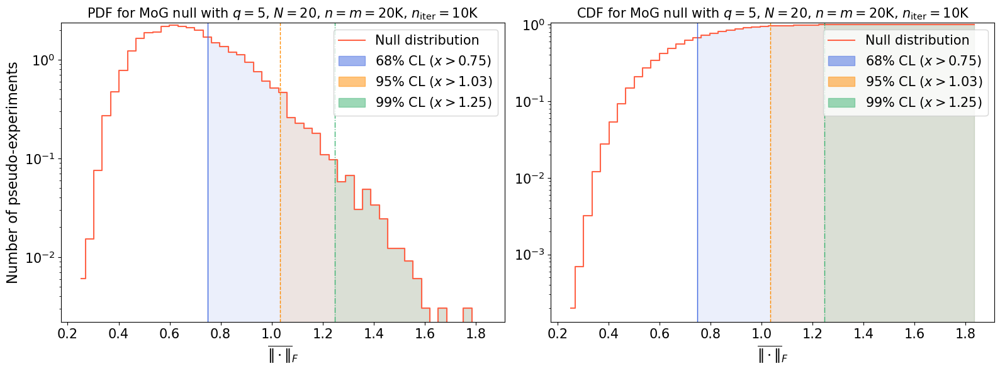

Time elapsed: 0.9670724130701274 seconds.
mu = 0.11199703219235012 +/- 1.3270502216664146e-05
sigma = 0.036428700521243064 +/- 0.0006519430998089134
68%CL = 0.11582248190997987, 95%CL = 0.16861427140297167, 99%CL = 0.28060237149143374
mu = 0.11199703219235012 +/- 1.3270502216664146e-05
sigma = 0.036428700521243064 +/- 0.0006519430998089134


/tmp/ipykernel_59766/952439541.py:87: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax[0].set_ylim(current_ylim0)
/tmp/ipykernel_59766/952439541.py:89: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend0.legendHandles[-3:]:
/tmp/ipykernel_59766/952439541.py:126: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax[1].set_ylim(current_ylim1)
/tmp/ipykernel_59766/952439541.py:132: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend1.legendHandles[-3:]:


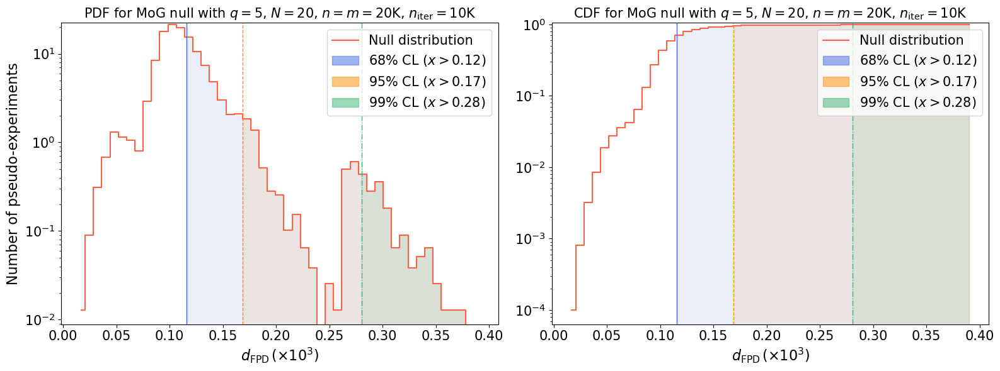

Time elapsed: 1.0284698239993304 seconds.
mu = 0.45970185353897414 +/- 1.0815171433572777e-05
sigma = 0.032886427950710576 +/- 0.0002471158078606443
68%CL = 0.47344702138518713, 95%CL = 0.5156398157246667, 99%CL = 0.5468218312632
mu = 0.45970185353897414 +/- 1.0815171433572777e-05
sigma = 0.032886427950710576 +/- 0.0002471158078606443


/tmp/ipykernel_59766/952439541.py:87: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax[0].set_ylim(current_ylim0)
/tmp/ipykernel_59766/952439541.py:89: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend0.legendHandles[-3:]:
/tmp/ipykernel_59766/952439541.py:126: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax[1].set_ylim(current_ylim1)
/tmp/ipykernel_59766/952439541.py:132: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend1.legendHandles[-3:]:


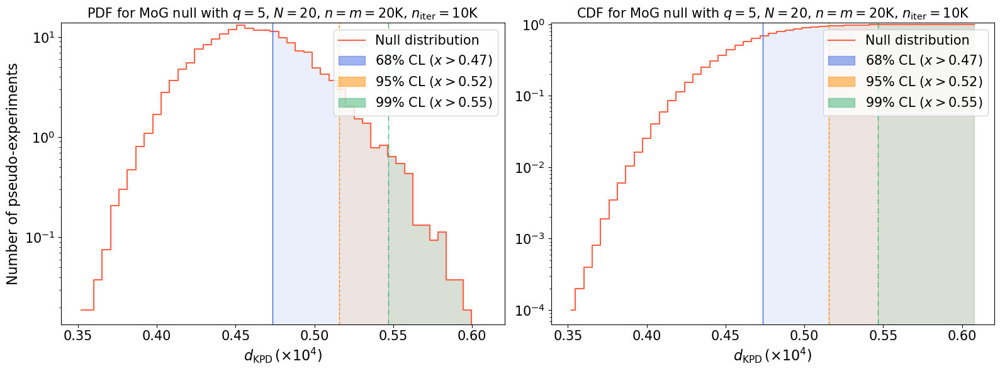

Time elapsed: 1.012937941821292 seconds.
mu = 0.8676754004731775 +/- 0.00016787066129602296
sigma = 0.12956491087328503 +/- 0.001113531509799755
68%CL = 0.9120000898838043, 95%CL = 1.1075008660554886, 99%CL = 1.2549996376037598
mu = 0.8676754004731775 +/- 0.00016787066129602296
sigma = 0.12956491087328503 +/- 0.001113531509799755


/tmp/ipykernel_59766/952439541.py:87: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax[0].set_ylim(current_ylim0)
/tmp/ipykernel_59766/952439541.py:89: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend0.legendHandles[-3:]:
/tmp/ipykernel_59766/952439541.py:126: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax[1].set_ylim(current_ylim1)
/tmp/ipykernel_59766/952439541.py:132: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend1.legendHandles[-3:]:


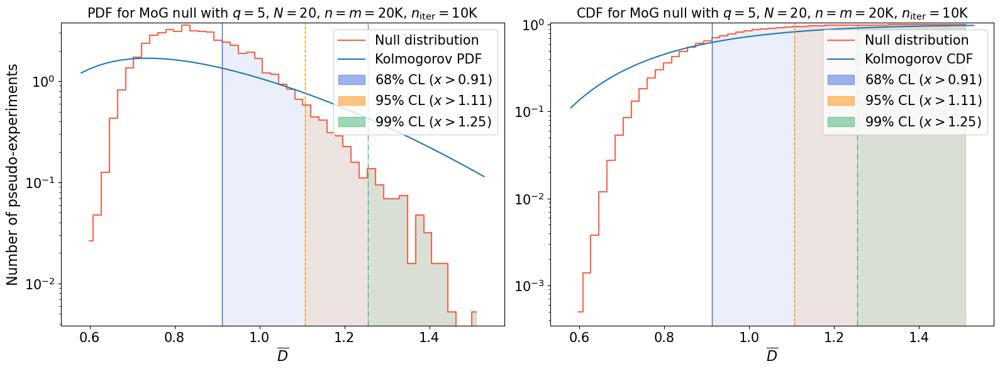

Time elapsed: 1.284544506110251 seconds.
mu = 0.8658526310138405 +/- 0.00013098520621847905
sigma = 0.11444876854666416 +/- 0.0009489896381201503
68%CL = 0.9048002772033215, 95%CL = 1.0811004787683487, 99%CL = 1.2127505615353584
mu = 0.8658526310138405 +/- 0.00013098520621847905
sigma = 0.11444876854666416 +/- 0.0009489896381201503


/tmp/ipykernel_59766/952439541.py:87: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax[0].set_ylim(current_ylim0)
/tmp/ipykernel_59766/952439541.py:89: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend0.legendHandles[-3:]:
/tmp/ipykernel_59766/952439541.py:126: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax[1].set_ylim(current_ylim1)
/tmp/ipykernel_59766/952439541.py:132: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend1.legendHandles[-3:]:


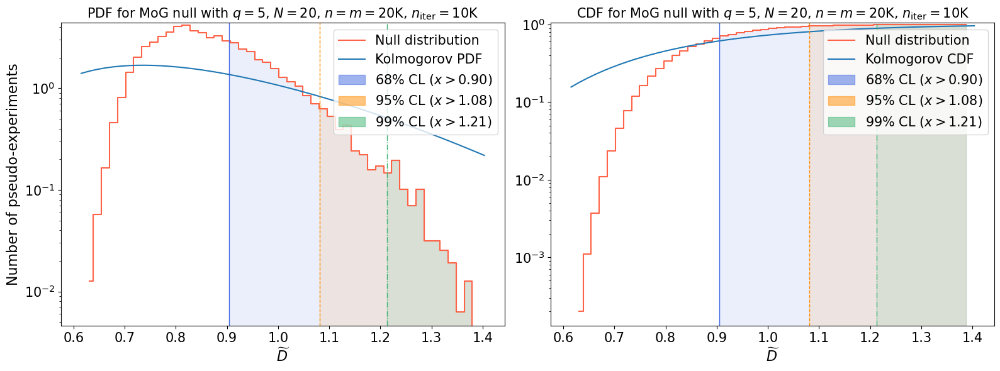

Time elapsed: 1.2786664878949523 seconds.
mu = 0.2802814187915494 +/- 2.8090848521128723e-05
sigma = 0.0530008004855858 +/- 0.0005176362112236936
68%CL = 0.2947600178370888, 95%CL = 0.38341068851014204, 99%CL = 0.4489561272558803
mu = 0.2802814187915494 +/- 2.8090848521128723e-05
sigma = 0.0530008004855858 +/- 0.0005176362112236936


/tmp/ipykernel_59766/952439541.py:87: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax[0].set_ylim(current_ylim0)
/tmp/ipykernel_59766/952439541.py:89: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend0.legendHandles[-3:]:
/tmp/ipykernel_59766/952439541.py:126: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax[1].set_ylim(current_ylim1)
/tmp/ipykernel_59766/952439541.py:132: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend1.legendHandles[-3:]:


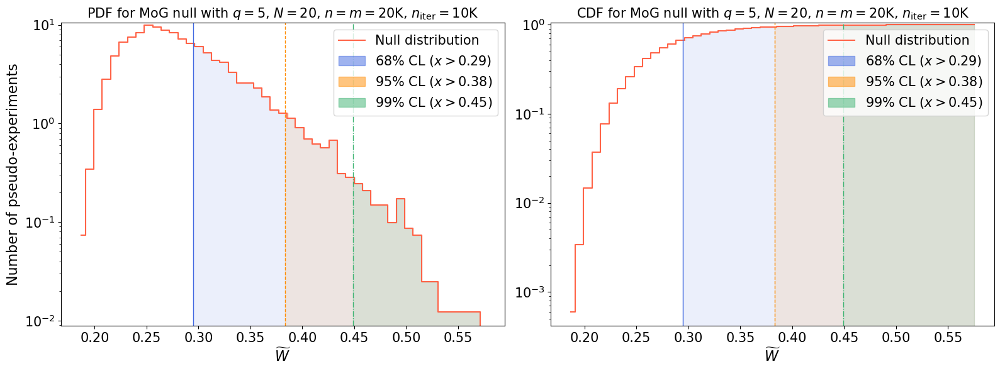

Time elapsed: 1.2214968418702483 seconds.


,name,object_name,class_name,kwargs,result_key,scale_func,scale_func_string,test_config,max_vectorize,latex,null_file,thresholds,null_figure
0,fn,FNMetric,GMetrics.FNMetric,{},metric_list,<function <lambda> at 0x7f1da7f3d5a0>,"lambda ns, ndims: np.sqrt(ns)/ndims","{'niter': 10000, 'batch_size_test': 20000, 'ba...",500,$\overline{\|\cdot\|}_{F}$,results/20D_unimodal/20D_20K/null_hypothesis/F...,"[[0.68, [6800, 3199], 0.7485835927158977], [0....",results/20D_unimodal/20D_20K/null_hypothesis/F...
1,fpd,FPDMetric,GMetrics.FPDMetric,{},metric_list,<function <lambda> at 0x7f1bfc63a830>,"lambda ns, ndims: 1000","{'niter': 10000, 'batch_size_test': 20000, 'ba...",100,$d_{\mathrm{FPD}}$,results/20D_unimodal/20D_20K/null_hypothesis/F...,"[[0.68, [6800, 3199], 0.11582248190997987], [0...",results/20D_unimodal/20D_20K/null_hypothesis/F...
2,kpd,KPDMetric,GMetrics.KPDMetric,{},metric_list,<function <lambda> at 0x7f1bfc63a440>,"lambda ns, ndims: 10000","{'niter': 10000, 'batch_size_test': 20000, 'ba...",1,$d_{\mathrm{KPD}}$,results/20D_unimodal/20D_20K/null_hypothesis/K...,"[[0.68, [6800, 3199], 0.47344702138518713], [0...",results/20D_unimodal/20D_20K/null_hypothesis/K...
3,ks,KSTest,GMetrics.KSTest,{},statistic_means,<function <lambda> at 0x7f1bfc63a7a0>,"lambda ns, _: np.sqrt(ns)","{'niter': 10000, 'batch_size_test': 20000, 'ba...",10000,$\overline{D}$,results/20D_unimodal/20D_20K/null_hypothesis/K...,"[[0.68, [6800, 3199], 0.9120000898838043], [0....",results/20D_unimodal/20D_20K/null_hypothesis/K...
4,sks,SKSTest,GMetrics.SKSTest,"{'nslices': 100, 'seed_slicing': 0}",metric_means,<function <lambda> at 0x7f1bfc63a710>,"lambda ns, _: np.sqrt(ns)","{'niter': 10000, 'batch_size_test': 20000, 'ba...",200,$\widetilde{D}$,results/20D_unimodal/20D_20K/null_hypothesis/S...,"[[0.68, [6800, 3199], 0.9048002772033215], [0....",results/20D_unimodal/20D_20K/null_hypothesis/S...
5,swd,SWDMetric,GMetrics.SWDMetric,"{'nslices': 100, 'seed_slicing': 0}",metric_means,<function <lambda> at 0x7f1bfc63a950>,"lambda ns, ndims: np.sqrt(ns/ndims)","{'niter': 10000, 'batch_size_test': 20000, 'ba...",200,$\widetilde{W}$,results/20D_unimodal/20D_20K/null_hypothesis/S...,"[[0.68, [6800, 3199], 0.2947600178370888], [0....",results/20D_unimodal/20D_20K/null_hypothesis/S...
6,lr,LRMetric,GMetrics.LRMetric,{'null_test': True},lik_ratio_norm_list,<function <lambda> at 0x7f1bfc63a8c0>,"lambda ns, ndims: np.sqrt(ns)","{'niter': 10000, 'batch_size_test': 20000, 'ba...",200,$t_{\mu}$,results/20D_unimodal/20D_20K/null_hypothesis/L...,[],NaN


In [36]:
for metric in list(metrics_config[unique_key].values())[:-1]:
    name = metric["name"]
    name_cap = name.upper()
    latex = metric["latex"]
    if "FPD" in latex:
        latex = r"$d_{\mathrm{FPD}}\,(\times 10^{3})$"
    elif "KPD" in latex:
        latex = r"$d_{\mathrm{KPD}}\,(\times 10^{4})$"
    obj = eval(metric["object_name"])
    result_key = metric["result_key"]
    scale_func = metric["scale_func"]
    figure_file = metric["null_file"].replace("json","pdf")
    thresholds = metric["thresholds"]

    start = timer()
    
    nsamples = obj.Inputs.batch_size_test
    niter = obj.Inputs.niter
    ns = nsamples**2 /(2*nsamples)
    dist_null = np.array(obj.Results[-1].result_value[result_key])*scale_func(ns, ndims)

    scale = 'log'
    num_bins = 50  # number of bins|
    
    mu, deltamu, sigma, deltasigma = (np.mean(dist_null), se_mean(dist_null), np.std(dist_null), se_std(dist_null))
    sigma_68, sigma_95, sigma_99 = [np.sort(dist_null)[int(len(dist_null)*cl)] for cl in [0.68, 0.95, 0.99]]
    print(f"mu = {mu} +/- {deltamu}")
    print(f"sigma = {sigma} +/- {deltasigma}")
    print(f"68%CL = {sigma_68}, 95%CL = {sigma_95}, 99%CL = {sigma_99}")
    
    print("mu =", mu, "+/-", deltamu)
    print("sigma =", sigma, "+/-", deltasigma)
    
    min_x, max_x = min(dist_null), max(dist_null) # lower and upper limit of the binning
    x = np.linspace(min_x, max_x, num_bins + 1)
    counts, bin_edges = np.histogram(dist_null, bins=x, density=True)
    cum_counts = np.cumsum(counts)/np.sum(counts)
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
    
    # Only if metric is KS-derived plot the theoretical distribution
    if "ks" in name:
        # Calculate the theoretical PDF and CDF of the KS distribution for each x value
        theoretical_pdf_ks = kstwobign.pdf(x)
        theoretical_cdf_ks = kstwobign.cdf(x)

        # Empirical SKS Normal
        empirical_pdf_norm = norm.pdf(x, loc=kstwobign.mean(), scale=kstwobign.std())
        empirical_cdf_norm = norm.cdf(x, loc=kstwobign.mean(), scale=kstwobign.std())

    fig, ax = plt.subplots(1, 2, figsize=(16, 6))
    
    dash_styles = ['-', '--', '-.']
    colors = ["royalblue", "darkorange", "mediumseagreen"]
    
    # Create step plot
    step_edges = np.convolve(bin_centers, [0.5, 0.5], 'valid')
    step_counts = counts[:-1]  # assuming counts is one element longer than step_edges

    ax[0].step(step_edges, step_counts, where='mid', linestyle='-', color = "tomato", label = "Null distribution")
    current_ylim0 = ax[0].get_ylim()
    if "ks" in name:
        ax[0].plot(x, theoretical_pdf_ks, label="Kolmogorov PDF")
    ax[0].set_yscale(scale)
    ax[0].set_xlabel(r"%s"%latex, fontsize=16)
    ax[0].set_ylabel('Number of pseudo-experiments', fontsize=16)
    ax[0].set_title('PDF for MoG null with $q = '+str(ncomp)+'$, $N = '+str(ndims)+'$, $n=m='+str(int(nsamples/1000))+'$K, $n_{\mathrm{iter}} = '+str(int(niter/1000))+'$K', fontsize=15)
    ax[0].tick_params(axis='x', labelsize=15)  # Set x-axis tick label size
    ax[0].tick_params(axis='y', labelsize=15)  # Set y-axis tick label size

    
    #for i, threshold in enumerate(thresholds):
    #    confidence_level, _, threshold_value = threshold
    #    closest_edge = bin_edges[np.argmin(np.abs(bin_edges - threshold_value))]
    #    ax[0].fill_betweenx([0, 2*counts.max()], closest_edge, bin_edges[-1], color=colors[i], alpha=0.1, step='mid', label=f"{int(confidence_level * 100)} CL% ($x>{format(threshold_value,'.2f')}$)")
    #    ax[0].axvline(x=closest_edge, linestyle=dash_styles[i], color=colors[i], linewidth=1)#, label=f'{int(confidence_level * 100)}% threshold')
    
    for i, threshold in enumerate(thresholds):
        confidence_level, _, threshold_value = threshold
        start_index = np.searchsorted(step_edges, threshold_value, side="right") - 1
        start_index = max(start_index, 0)
        fill_x_range = np.concatenate([[threshold_value], step_edges[start_index+1:]])
        fill_y_values = step_counts[start_index:]
        if len(fill_x_range) > 1 and len(fill_y_values) > 0:
            ax[0].fill_between(fill_x_range, 0, fill_y_values, color=colors[i], alpha=0.1, step='mid', label=f"{int(confidence_level * 100)}% CL ($x>{format(threshold_value, '.2f')}   $)")
        ax[0].axvline(x=threshold_value, linestyle=dash_styles[i], color=colors[i], linewidth=1)

    ax[0].set_ylim(current_ylim0)  
    legend0 = ax[0].legend(loc='upper right', fontsize=15)
    for handle in legend0.legendHandles[-3:]:
        handle.set_alpha(0.5)  # Set to desired alpha value
    
    # Create step plot
    step_edges = np.convolve(bin_centers, [0.5, 0.5], 'valid')
    step_counts = cum_counts[:-1]  # assuming counts is one element longer than step_edges
    
    ax[1].step(step_edges, step_counts, where='mid', linestyle='-', color = "tomato", label = "Null distribution")
    #ax[1].plot(bin_centers, cum_counts, linestyle = '-', color = "tomato", label = "Null distribution", drawstyle='steps-mid')
    current_ylim1 = ax[1].get_ylim()
    if "ks" in name:
        ax[1].plot(x, theoretical_cdf_ks, label="Kolmogorov CDF")
    #for i, threshold in enumerate(thresholds):
    #    confidence_level, _, threshold_value = threshold
    #    ax[1].axhline(y=confidence_level, color=colors[i], linestyle=dash_styles[i], linewidth=0.5, alpha=1)
    ax[1].set_yscale(scale)
    ax[1].set_xlabel(r"%s"%latex, fontsize=16)
    ax[1].set_title('CDF for MoG null with $q = '+str(ncomp)+'$, $N = '+str(ndims)+'$, $n=m='+str(int(nsamples/1000))+'$K, $n_{\mathrm{iter}} = '+str(int(niter/1000))+'$K', fontsize=15)
    ax[1].tick_params(axis='x', labelsize=15)  # Set x-axis tick label size
    ax[1].tick_params(axis='y', labelsize=15)  # Set y-axis tick label size
    
    #for i, threshold in enumerate(thresholds):
    #    confidence_level, _, threshold_value = threshold
    #    closest_edge = bin_edges[np.argmin(np.abs(bin_edges - threshold_value))]
    #    ax[1].fill_betweenx([0, 2*counts.max()], closest_edge, bin_edges[-1], color=colors[i], alpha=0.1, step='mid', label=f"{int(confidence_level * 100)} CL% ($x>{format(threshold_value,'.2f')}$)")
    #    ax[1].axvline(x=closest_edge, linestyle=dash_styles[i], color=colors[i], linewidth=1)#, label=f'{int(confidence_level * 100)}% threshold')
    
    for i, threshold in enumerate(thresholds):
        confidence_level, _, threshold_value = threshold
        start_index = np.searchsorted(step_edges, threshold_value, side="right") - 1
        start_index = max(start_index, 0)
        fill_x_range = np.concatenate([[threshold_value], step_edges[start_index+1:]])
        fill_y_values = step_counts[start_index:]
        if len(fill_x_range) > 1 and len(fill_y_values) > 0:
            ax[1].fill_between(fill_x_range, 0, fill_y_values, color=colors[i], alpha=0.1, step='mid', label=f"{int(confidence_level * 100)}% CL ($x>{format(threshold_value, '.2f')}   $)")
        ax[1].axvline(x=threshold_value, linestyle=dash_styles[i], color=colors[i], linewidth=1)
    
    ax[1].set_ylim(current_ylim1)  
    #for i, threshold in enumerate(thresholds):
    #    confidence, _, value = threshold
    #    ax[1].axvline(x=value, color=colors[i], linestyle=dash_styles[i], alpha=1, label=f"{int(confidence_level * 100)} CL% ($x>{format(threshold_value,'.2f')}$)")
    
    legend1 = ax[1].legend(loc='upper right', fontsize=15)
    for handle in legend1.legendHandles[-3:]:
        handle.set_alpha(0.5)  # Set to desired alpha value
    
    plt.subplots_adjust(wspace=0.1)  # Adjust this value to your liking
    plt.tight_layout()
    plt.savefig(figure_file)
    plt.show()
    plt.close()
    
    metric.update({"null_figure": figure_file})

    end = timer()
    print("Time elapsed:", end-start, "seconds.")

GMetrics.utils.save_update_metrics_config(metrics_config = metrics_config, metrics_config_file = metrics_config_file) # type: ignore

## Alternative hypotheses and results

### Scan and exclusion limits (bisection method)

In [37]:
if test_config_null["use_tf"]:
    dtype = getattr(tf, test_config_null["dtype_input"])
else:
    dtype = np.dtype(test_config_null["dtype_input"])
test_kwargs = {"niter": 10,
               "batch_size_test": test_config_null["batch_size_test"],
               "batch_size_gen": test_config_null["batch_size_gen"],
               "small_sample_threshold": test_config_null["small_sample_threshold"],
               "dtype_input": dtype,
               "seed_input": test_config_null["seed"],
               "use_tf": test_config_null["use_tf"],
               "mirror_strategy": test_config_null["mirror_strategy"],
               "verbose": False}

In [38]:
file_path = model_dir + "exclusion_limits.json"
if os.path.exists(file_path):
    try:
        with open(file_path, "r") as file:
            existing_data = json.load(file)
    except json.JSONDecodeError:
        existing_data = {}
else:
    existing_data = {}

In [39]:
deformations = ["mean", "std", "off", "cov", "mean_std", "mean_off", "mean_cov"]
global_results = {}

for metric_config in list(metrics_config[unique_key].values())[:-1]:
    for deformation in deformations:
        result = {k: v for k, v in {k: v for k, v in existing_data.items() if v["null_config"]["name"] == metric_config["name"] and v["deformation"] == deformation}.items() if v["exclusion_list"] != []}
        if result == {}:
            print(f"Computing exclusion limits for {metric_config['name']} with {deformation} deformation.")
            result = compute_exclusion_bisection(metric_config = metric_config,
                                                 test_kwargs = test_kwargs,
                                                 model_dir = model_dir,
                                                 deformation = deformation,
                                                 seed_dist = 0,
                                                 x_tol = 0.01,
                                                 fn_tol = 0.02,
                                                 eps_min = 0.,
                                                 eps_max = 50.,
                                                 max_iterations = 100,
                                                 save = True,
                                                 verbose = True)
        else:
            print(f"Exclusion limits for {metric_config['name']} with {deformation} deformation already loaded.")
        global_results.update(result)
print(global_results.keys())

Exclusion limits for fn with mean deformation already loaded.
Exclusion limits for fn with std deformation already loaded.
Exclusion limits for fn with off deformation already loaded.
Exclusion limits for fn with cov deformation already loaded.
Exclusion limits for fn with mean_std deformation already loaded.
Exclusion limits for fn with mean_off deformation already loaded.
Exclusion limits for fn with mean_cov deformation already loaded.
Exclusion limits for fpd with mean deformation already loaded.
Exclusion limits for fpd with std deformation already loaded.
Exclusion limits for fpd with off deformation already loaded.
Exclusion limits for fpd with cov deformation already loaded.
Exclusion limits for fpd with mean_std deformation already loaded.
Exclusion limits for fpd with mean_off deformation already loaded.
Exclusion limits for fpd with mean_cov deformation already loaded.
Exclusion limits for kpd with mean deformation already loaded.
Exclusion limits for kpd with std deformatio

### Likelihood-ratio test

In [40]:
if test_config_null["use_tf"]:
    dtype = getattr(tf, test_config_null["dtype_input"])
else:
    dtype = np.dtype(test_config_null["dtype_input"])
test_kwargs = {"niter": 10_000,
               "batch_size_test": test_config_null["batch_size_test"],
               "batch_size_gen": test_config_null["batch_size_gen"],
               "small_sample_threshold": test_config_null["small_sample_threshold"],
               "dtype_input": dtype,
               "seed_input": test_config_null["seed"],
               "use_tf": test_config_null["use_tf"],
               "mirror_strategy": test_config_null["mirror_strategy"],
               "verbose": True}
metrics_config[unique_key]["lr"]['kwargs']["verbose"] = True

In [41]:
deformations = ["mean", "std", "off", "cov", "mean_std", "mean_off", "mean_cov"]

for deformation in deformations:
    result = {k: v for k, v in existing_data.items() if v["null_config"]["name"] == "lr" and v["deformation"] == deformation}
    if result == {}:
        print(f"Computing exclusion limits for lr with {deformation} deformation.")
        result = compute_exclusion_LR_bisection(metric_config = metrics_config[unique_key]["lr"],
                                                test_kwargs = test_kwargs,
                                                model_dir = model_dir,
                                                cl_list = [0.95, 0.99],
                                                deformation = deformation,
                                                seed_dist = 0,
                                                x_tol = 0.01,
                                                fn_tol = 0.01,
                                                eps_min = 0.,
                                                eps_max = 0.01,
                                                max_iterations = 100,
                                                save = True,
                                                verbose = True)
    else:
        print(f"Exclusion limits for LR with {deformation} deformation already loaded.")
    global_results.update(result)
print(global_results.keys())

Exclusion limits for LR with mean deformation already loaded.
Exclusion limits for LR with std deformation already loaded.
Exclusion limits for LR with off deformation already loaded.
Exclusion limits for LR with cov deformation already loaded.
Exclusion limits for LR with mean_std deformation already loaded.
Exclusion limits for LR with mean_off deformation already loaded.
Exclusion limits for LR with mean_cov deformation already loaded.
dict_keys(['2024-04-16T15:39:51.283964', '2024-04-16T15:41:35.597119', '2024-04-16T15:43:23.969198', '2024-04-16T15:45:18.576612', '2024-04-16T15:46:38.789696', '2024-04-16T15:48:29.594091', '2024-04-16T15:50:26.773014', '2024-04-16T17:32:01.894310', '2024-04-16T17:34:41.523012', '2024-04-16T17:37:50.197570', '2024-04-16T17:41:11.386245', '2024-04-16T17:44:21.376807', '2024-04-16T21:39:01.703330', '2024-04-16T17:56:00.658118', '2024-04-16T17:59:15.739157', '2024-04-16T18:09:31.874387', '2024-04-16T18:16:57.692415', '2024-04-16T18:24:21.961176', '2024-

### Show and save results

In [42]:
global_results_list = [x for x in global_results.values()]
results = []
for global_result in global_results_list:
    name = global_result["null_config"]["name"]
    print(f"Metric: {name}")
    deformation = global_result["deformation"]
    ndims = global_result["null_config"]["test_config"]["ndims"]
    niter = global_result["null_config"]["test_config"]["niter"]
    nsamples = global_result["null_config"]["test_config"]["batch_size_test"]
    try:
        exclusion_95 = eval(format(global_result["exclusion_list"][0][2], ".5f"))
    except:
        exclusion_95 = "N/A"
    try:
        exclusion_99 = eval(format(global_result["exclusion_list"][1][2], ".5f"))
    except:
        exclusion_99 = "N/A"
    time_elapsed = global_result["time_elapsed"]
    #print(exclusion_95)
    #print(round_to_n_significant_digits(exclusion_95, 3))
    results.append([name, deformation, ndims, niter, nsamples, exclusion_95, exclusion_99, int(time_elapsed)])
    #results.append([name, deformation, ndims, niter, nsamples, round_to_n_significant_digits(exclusion_95, 3), round_to_n_significant_digits(exclusion_99, 3), int(time_elapsed)])
results_df = pd.DataFrame(results, columns=["Statistic", "Deformation", "$N$", "$n=m$", "$n_{\\mathrm{iter}}$", "$\\epsilon_{95\\%\\mathrm{CL}}$", "$\\epsilon_{99\\%\\mathrm{CL}}$", "t (s)"])
times_df = pd.DataFrame(null_times+[["lr", "-"]], columns=["Statistic", "$t^{\\mathrm{null}}$ (s)"])

Metric: fn
Metric: fn
Metric: fn
Metric: fn
Metric: fn
Metric: fn
Metric: fn
Metric: fpd
Metric: fpd
Metric: fpd
Metric: fpd
Metric: fpd
Metric: fpd
Metric: fpd
Metric: kpd
Metric: kpd
Metric: kpd
Metric: kpd
Metric: kpd
Metric: kpd
Metric: kpd
Metric: ks
Metric: ks
Metric: ks
Metric: ks
Metric: ks
Metric: ks
Metric: ks
Metric: sks
Metric: sks
Metric: sks
Metric: sks
Metric: sks
Metric: sks
Metric: sks
Metric: swd
Metric: swd
Metric: swd
Metric: swd
Metric: swd
Metric: swd
Metric: swd
Metric: lr
Metric: lr
Metric: lr
Metric: lr
Metric: lr
Metric: lr
Metric: lr


In [43]:
results_df_mean = results_df[results_df["Deformation"] == "mean"]
results_df_std = results_df[results_df["Deformation"] == "std"]
results_df_off = results_df[results_df["Deformation"] == "off"]
results_df_cov = results_df[results_df["Deformation"] == "cov"]
results_df_mean_std = results_df[results_df["Deformation"] == "mean_std"]
results_df_mean_off = results_df[results_df["Deformation"] == "mean_off"]
results_df_mean_cov = results_df[results_df["Deformation"] == "mean_cov"]

In [44]:
sorted_df_mean = results_df_mean.sort_values(by="$\\epsilon_{95\\%\\mathrm{CL}}$", ascending=True)
sorted_df_mean.rename(columns={"$\\epsilon_{95\\%\\mathrm{CL}}$": "$\\epsilon^{\\mu}_{95\\%\\mathrm{CL}}$", "$\\epsilon_{99\\%\\mathrm{CL}}$": "$\\epsilon^{\\mu}_{99\\%\\mathrm{CL}}$", "t (s)": "$t^{\\mu}$ (s)"}, inplace=True)
display(sorted_df_mean)
sorted_df_mean.drop(columns=["Deformation","$N$","$n=m$","$n_{\\mathrm{iter}}$"], inplace=True)
display(sorted_df_mean)

,Statistic,Deformation,$N$,$n=m$,$n_{\mathrm{iter}}$,$\epsilon^{\mu}_{95\%\mathrm{CL}}$,$\epsilon^{\mu}_{99\%\mathrm{CL}}$,$t^{\mu}$ (s)
42,lr,mean,20,10000,20000,0.00172,0.00256,540
7,fpd,mean,20,10000,20000,0.02069,0.03995,159
35,swd,mean,20,10000,20000,0.02089,0.02918,169
28,sks,mean,20,10000,20000,0.02375,0.03242,271
21,ks,mean,20,10000,20000,0.02546,0.03566,177
0,fn,mean,20,10000,20000,0.05360,0.07551,104
14,kpd,mean,20,10000,20000,0.38300,0.41177,616


,Statistic,$\epsilon^{\mu}_{95\%\mathrm{CL}}$,$\epsilon^{\mu}_{99\%\mathrm{CL}}$,$t^{\mu}$ (s)
42,lr,0.00172,0.00256,540
7,fpd,0.02069,0.03995,159
35,swd,0.02089,0.02918,169
28,sks,0.02375,0.03242,271
21,ks,0.02546,0.03566,177
0,fn,0.05360,0.07551,104
14,kpd,0.38300,0.41177,616


In [45]:
sorted_df_std = results_df_std.sort_values(by="$\\epsilon_{95\\%\\mathrm{CL}}$", ascending=True)
sorted_df_std.rename(columns={"$\\epsilon_{95\\%\\mathrm{CL}}$": "$\\epsilon^{\\sigma}_{95\\%\\mathrm{CL}}$", "$\\epsilon_{99\\%\\mathrm{CL}}$": "$\\epsilon^{\\sigma}_{99\\%\\mathrm{CL}}$", "t (s)": "$t^{\\sigma}$ (s)"}, inplace=True)
display(sorted_df_std)
sorted_df_std.drop(columns=["Deformation","$N$","$n=m$","$n_{\\mathrm{iter}}$"], inplace=True)
display(sorted_df_std)

,Statistic,Deformation,$N$,$n=m$,$n_{\mathrm{iter}}$,$\epsilon^{\sigma}_{95\%\mathrm{CL}}$,$\epsilon^{\sigma}_{99\%\mathrm{CL}}$,$t^{\sigma}$ (s)
43,lr,std,20,10000,20000,0.00014,0.00020,710
8,fpd,std,20,10000,20000,0.00757,0.01372,188
1,fn,std,20,10000,20000,0.01264,0.01812,108
36,swd,std,20,10000,20000,0.02527,0.03471,175
29,sks,std,20,10000,20000,0.02584,0.03566,274
22,ks,std,20,10000,20000,0.04673,0.06293,165
15,kpd,std,20,10000,20000,6.42090,6.82520,445


,Statistic,$\epsilon^{\sigma}_{95\%\mathrm{CL}}$,$\epsilon^{\sigma}_{99\%\mathrm{CL}}$,$t^{\sigma}$ (s)
43,lr,0.00014,0.00020,710
8,fpd,0.00757,0.01372,188
1,fn,0.01264,0.01812,108
36,swd,0.02527,0.03471,175
29,sks,0.02584,0.03566,274
22,ks,0.04673,0.06293,165
15,kpd,6.42090,6.82520,445


In [46]:
sorted_df_off = results_df_off.sort_values(by="$\\epsilon_{95\\%\\mathrm{CL}}$", ascending=True)
sorted_df_off.rename(columns={"$\\epsilon_{95\\%\\mathrm{CL}}$": "$\\epsilon^{\\Sigma_{ij}-\\Sigma_{ii}}_{95\\%\\mathrm{CL}}$", "$\\epsilon_{99\\%\\mathrm{CL}}$": "$\\epsilon^{\\Sigma_{ij}-\\Sigma_{ii}}_{99\\%\\mathrm{CL}}$", "t (s)": "$t^{\\Sigma_{ij}-\\Sigma_{ii}}$ (s)"}, inplace=True)
display(sorted_df_off)
sorted_df_off.drop(columns=["Deformation","$N$","$n=m$","$n_{\\mathrm{iter}}$"], inplace=True)
display(sorted_df_off)

,Statistic,Deformation,$N$,$n=m$,$n_{\mathrm{iter}}$,$\epsilon^{\Sigma_{ij}-\Sigma_{ii}}_{95\%\mathrm{CL}}$,$\epsilon^{\Sigma_{ij}-\Sigma_{ii}}_{99\%\mathrm{CL}}$,$t^{\Sigma_{ij}-\Sigma_{ii}}$ (s)
44,lr,off,20,10000,20000,0.00007,0.00010,764
9,fpd,off,20,10000,20000,0.00408,0.00725,201
2,fn,off,20,10000,20000,0.00622,0.00892,114
30,sks,off,20,10000,20000,0.01740,0.02455,279
37,swd,off,20,10000,20000,0.01769,0.02503,173
23,ks,off,20,10000,20000,0.04711,0.06217,164
16,kpd,off,20,10000,20000,6.37207,6.77682,444


,Statistic,$\epsilon^{\Sigma_{ij}-\Sigma_{ii}}_{95\%\mathrm{CL}}$,$\epsilon^{\Sigma_{ij}-\Sigma_{ii}}_{99\%\mathrm{CL}}$,$t^{\Sigma_{ij}-\Sigma_{ii}}$ (s)
44,lr,0.00007,0.00010,764
9,fpd,0.00408,0.00725,201
2,fn,0.00622,0.00892,114
30,sks,0.01740,0.02455,279
37,swd,0.01769,0.02503,173
23,ks,0.04711,0.06217,164
16,kpd,6.37207,6.77682,444


In [47]:
sorted_df_cov = results_df_cov.sort_values(by="$\\epsilon_{95\\%\\mathrm{CL}}$", ascending=True)
sorted_df_cov.rename(columns={"$\\epsilon_{95\\%\\mathrm{CL}}$": "$\\epsilon^{\\Sigma_{ij}}_{95\\%\\mathrm{CL}}$", "$\\epsilon_{99\\%\\mathrm{CL}}$": "$\\epsilon^{\\Sigma_{ij}}_{99\\%\\mathrm{CL}}$", "t (s)": "$t^{\\Sigma_{ij}}$ (s)"}, inplace=True)
display(sorted_df_cov)
sorted_df_cov.drop(columns=["Deformation","$N$","$n=m$","$n_{\\mathrm{iter}}$"], inplace=True)
display(sorted_df_cov)

,Statistic,Deformation,$N$,$n=m$,$n_{\mathrm{iter}}$,$\epsilon^{\Sigma_{ij}}_{95\%\mathrm{CL}}$,$\epsilon^{\Sigma_{ij}}_{99\%\mathrm{CL}}$,$t^{\Sigma_{ij}}$ (s)
45,lr,cov,20,10000,20000,0.00351,0.00515,458
10,fpd,cov,20,10000,20000,0.03023,0.04926,189
38,swd,cov,20,10000,20000,0.03462,0.04548,172
31,sks,cov,20,10000,20000,0.04330,0.05797,267
24,ks,cov,20,10000,20000,0.04787,0.06369,171
3,fn,cov,20,10000,20000,0.44403,0.58165,80
17,kpd,cov,20,10000,20000,5.00488,5.55414,451


,Statistic,$\epsilon^{\Sigma_{ij}}_{95\%\mathrm{CL}}$,$\epsilon^{\Sigma_{ij}}_{99\%\mathrm{CL}}$,$t^{\Sigma_{ij}}$ (s)
45,lr,0.00351,0.00515,458
10,fpd,0.03023,0.04926,189
38,swd,0.03462,0.04548,172
31,sks,0.04330,0.05797,267
24,ks,0.04787,0.06369,171
3,fn,0.44403,0.58165,80
17,kpd,5.00488,5.55414,451


In [48]:
sorted_df_mean_std = results_df_mean_std.sort_values(by="$\\epsilon_{95\\%\\mathrm{CL}}$", ascending=True)
sorted_df_mean_std.rename(columns={"$\\epsilon_{95\\%\\mathrm{CL}}$": "$\\epsilon^{\\mu-\\sigma}_{95\\%\\mathrm{CL}}$", "$\\epsilon_{99\\%\\mathrm{CL}}$": "$\\epsilon^{\\mu-\\sigma}_{99\\%\\mathrm{CL}}$", "t (s)": "$t^{\\mu-\\sigma}$ (s)"}, inplace=True)
display(sorted_df_mean_std)
sorted_df_mean_std.drop(columns=["Deformation","$N$","$n=m$","$n_{\\mathrm{iter}}$"], inplace=True)
display(sorted_df_mean_std)

,Statistic,Deformation,$N$,$n=m$,$n_{\mathrm{iter}}$,$\epsilon^{\mu-\sigma}_{95\%\mathrm{CL}}$,$\epsilon^{\mu-\sigma}_{99\%\mathrm{CL}}$,$t^{\mu-\sigma}$ (s)
46,lr,mean_std,20,10000,20000,0.00013,0.00019,747
11,fpd,mean_std,20,10000,20000,0.00694,0.01271,195
4,fn,mean_std,20,10000,20000,0.01273,0.01831,110
39,swd,mean_std,20,10000,20000,0.01569,0.02169,173
32,sks,mean_std,20,10000,20000,0.01636,0.02217,290
25,ks,mean_std,20,10000,20000,0.02127,0.02899,183
18,kpd,mean_std,20,10000,20000,0.37384,0.39959,616


,Statistic,$\epsilon^{\mu-\sigma}_{95\%\mathrm{CL}}$,$\epsilon^{\mu-\sigma}_{99\%\mathrm{CL}}$,$t^{\mu-\sigma}$ (s)
46,lr,0.00013,0.00019,747
11,fpd,0.00694,0.01271,195
4,fn,0.01273,0.01831,110
39,swd,0.01569,0.02169,173
32,sks,0.01636,0.02217,290
25,ks,0.02127,0.02899,183
18,kpd,0.37384,0.39959,616


In [49]:
sorted_df_mean_off = results_df_mean_off.sort_values(by="$\\epsilon_{95\\%\\mathrm{CL}}$", ascending=True)
sorted_df_mean_off.rename(columns={"$\\epsilon_{95\\%\\mathrm{CL}}$": "$\\epsilon^{\\mu-\\Sigma_{ij}-\\Sigma_{ii}}_{95\\%\\mathrm{CL}}$", "$\\epsilon_{99\\%\\mathrm{CL}}$": "$\\epsilon^{\\mu-\\Sigma_{ij}-\\Sigma_{ii}}_{99\\%\\mathrm{CL}}$", "t (s)": "$t^{\\mu-\\Sigma_{ij}-\\Sigma_{ii}}$ (s)"}, inplace=True)
display(sorted_df_mean_off)
sorted_df_mean_off.drop(columns=["Deformation","$N$","$n=m$","$n_{\\mathrm{iter}}$"], inplace=True)
display(sorted_df_mean_off)

,Statistic,Deformation,$N$,$n=m$,$n_{\mathrm{iter}}$,$\epsilon^{\mu-\Sigma_{ij}-\Sigma_{ii}}_{95\%\mathrm{CL}}$,$\epsilon^{\mu-\Sigma_{ij}-\Sigma_{ii}}_{99\%\mathrm{CL}}$,$t^{\mu-\Sigma_{ij}-\Sigma_{ii}}$ (s)
47,lr,mean_off,20,10000,20000,0.00007,0.00010,798
12,fpd,mean_off,20,10000,20000,0.00409,0.00697,184
5,fn,mean_off,20,10000,20000,0.00632,0.00901,117
40,swd,mean_off,20,10000,20000,0.01273,0.01783,189
33,sks,mean_off,20,10000,20000,0.01302,0.01764,297
26,ks,mean_off,20,10000,20000,0.02165,0.02918,183
19,kpd,mean_off,20,10000,20000,0.38300,0.40874,619


,Statistic,$\epsilon^{\mu-\Sigma_{ij}-\Sigma_{ii}}_{95\%\mathrm{CL}}$,$\epsilon^{\mu-\Sigma_{ij}-\Sigma_{ii}}_{99\%\mathrm{CL}}$,$t^{\mu-\Sigma_{ij}-\Sigma_{ii}}$ (s)
47,lr,0.00007,0.00010,798
12,fpd,0.00409,0.00697,184
5,fn,0.00632,0.00901,117
40,swd,0.01273,0.01783,189
33,sks,0.01302,0.01764,297
26,ks,0.02165,0.02918,183
19,kpd,0.38300,0.40874,619


In [50]:
sorted_df_mean_cov = results_df_mean_cov.sort_values(by="$\\epsilon_{95\\%\\mathrm{CL}}$", ascending=True)
sorted_df_mean_cov.rename(columns={"$\\epsilon_{95\\%\\mathrm{CL}}$": "$\\epsilon^{\\mu-\Sigma_{ij}}_{95\\%\\mathrm{CL}}$", "$\\epsilon_{99\\%\\mathrm{CL}}$": "$\\epsilon^{\\mu-\Sigma_{ij}}_{99\\%\\mathrm{CL}}$", "t (s)": "$t^{\\mu-\Sigma_{ij}}$ (s)"}, inplace=True)
display(sorted_df_mean_cov)
sorted_df_mean_cov.drop(columns=["Deformation","$N$","$n=m$","$n_{\\mathrm{iter}}$"], inplace=True)
display(sorted_df_mean_cov)

,Statistic,Deformation,$N$,$n=m$,$n_{\mathrm{iter}}$,$\epsilon^{\mu-\Sigma_{ij}}_{95\%\mathrm{CL}}$,$\epsilon^{\mu-\Sigma_{ij}}_{99\%\mathrm{CL}}$,$t^{\mu-\Sigma_{ij}}$ (s)
48,lr,mean_cov,20,10000,20000,0.00149,0.00226,540
13,fpd,mean_cov,20,10000,20000,0.01693,0.03037,195
41,swd,mean_cov,20,10000,20000,0.01817,0.02513,174
34,sks,mean_cov,20,10000,20000,0.02012,0.02708,289
27,ks,mean_cov,20,10000,20000,0.02146,0.02918,185
6,fn,mean_cov,20,10000,20000,0.05283,0.07436,99
20,kpd,mean_cov,20,10000,20000,0.36469,0.39044,618


,Statistic,$\epsilon^{\mu-\Sigma_{ij}}_{95\%\mathrm{CL}}$,$\epsilon^{\mu-\Sigma_{ij}}_{99\%\mathrm{CL}}$,$t^{\mu-\Sigma_{ij}}$ (s)
48,lr,0.00149,0.00226,540
13,fpd,0.01693,0.03037,195
41,swd,0.01817,0.02513,174
34,sks,0.02012,0.02708,289
27,ks,0.02146,0.02918,185
6,fn,0.05283,0.07436,99
20,kpd,0.36469,0.39044,618


In [51]:
result_table = sorted_df_mean.merge(sorted_df_std, on='Statistic', how='outer').merge(sorted_df_off, on='Statistic', how='outer').merge(sorted_df_cov, on='Statistic', how='outer')
result_table = result_table.replace("lr","$t_{\\mathrm{LLR}}$").replace("ks","$\\overline{D}$").replace("sks","$\\widetilde{D}$").replace("swd","$\\widetilde{W}$").replace("fpd","$d_{\\mathrm{FPD}}$").replace("fn","$\\overline{\\|\cdot\\|}_{F}$").replace("kpd","$d_{\\mathrm{KPD}}$")
#display(result_table)
print(result_table.to_latex(index=False, column_format='l|llr|llr|llr|llr', longtable=False, float_format="%.2g").replace("\\toprule","\\toprule\n\\multicolumn{1}{c}{} & \\multicolumn{3}{c}{$\\mu$-deformation} & \\multicolumn{3}{c}{$\\sigma$-deformation} & \\multicolumn{3}{c}{$\\Sigma_{ij}-\\Sigma_{ii}$-deformation} & \\multicolumn{3}{c}{$\\Sigma_{ij}$-deformation} \\\\").replace("$\\epsilon^{\\mu}_{95\\%\\mathrm{CL}}$", "$\\epsilon_{95\\%\\mathrm{CL}}$").replace("$\\epsilon^{\\mu}_{99\\%\\mathrm{CL}}$", "$\\epsilon_{99\\%\\mathrm{CL}}$").replace("$t^{\\mu}$ (s)", "t (s)").replace("$\\epsilon^{\\sigma}_{95\\%\\mathrm{CL}}$", "$\\epsilon_{95\\%\\mathrm{CL}}$").replace("$\\epsilon^{\\sigma}_{99\\%\\mathrm{CL}}$", "$\\epsilon_{99\\%\\mathrm{CL}}$").replace("$t^{\\sigma}$ (s)", "t (s)").replace("$\\epsilon^{\\Sigma_{ij}-\\Sigma_{ii}}_{95\\%\\mathrm{CL}}$", "$\\epsilon_{95\\%\\mathrm{CL}}$").replace("$\\epsilon^{\\Sigma_{ij}-\\Sigma_{ii}}_{99\\%\\mathrm{CL}}$", "$\\epsilon_{99\\%\\mathrm{CL}}$").replace("$t^{\\Sigma_{ij}-\\Sigma_{ii}}$ (s)", "t (s)").replace("$\\epsilon^{\\Sigma_{ij}}_{95\\%\\mathrm{CL}}$", "$\\epsilon_{95\\%\\mathrm{CL}}$").replace("$\\epsilon^{\\Sigma_{ij}}_{99\\%\\mathrm{CL}}$", "$\\epsilon_{99\\%\\mathrm{CL}}$").replace("$t^{\\Sigma_{ij}}$ (s)", "t (s)").replace("\\bottomrule\n\\end{tabular}\n","").replace("\\toprule","\\toprule\n\\multicolumn{13}{c}{$\\mathbf{n=m=2\\cdot 10^{4}}$} \\\\").rstrip())
result_table = sorted_df_mean_std.merge(sorted_df_mean_off, on='Statistic', how='outer').merge(sorted_df_mean_cov, on='Statistic', how='outer').merge(times_df, on='Statistic', how='outer')
result_table = result_table.replace("lr","$t_{\\mathrm{LLR}}$").replace("ks","$\\overline{D}$").replace("sks","$\\widetilde{D}$").replace("swd","$\\widetilde{W}$").replace("fpd","$d_{\\mathrm{FPD}}$").replace("fn","$\\overline{\\|\cdot\\|}_{F}$").replace("kpd","$d_{\\mathrm{KPD}}$")
#display(result_table)
print(result_table.to_latex(index=False, column_format='l|llr|llr|llr|r', longtable=False, float_format="%.2g").replace("$\\epsilon^{\\mu-\\sigma}_{95\\%\\mathrm{CL}}$","$\\epsilon_{95\\%\\mathrm{CL}}$").replace("$\\epsilon^{\\mu-\\sigma}_{99\\%\\mathrm{CL}}$","$\\epsilon_{99\\%\\mathrm{CL}}$").replace("$t^{\\mu-\\sigma}$ (s)","t (s)").replace("$\\epsilon^{\\mu-\\Sigma_{ij}-\\Sigma_{ii}}_{95\\%\\mathrm{CL}}$","$\\epsilon_{95\\%\\mathrm{CL}}$").replace("$\\epsilon^{\\mu-\\Sigma_{ij}-\\Sigma_{ii}}_{99\\%\\mathrm{CL}}$","$\\epsilon_{99\\%\\mathrm{CL}}$").replace("$t^{\\mu-\\Sigma_{ij}-\\Sigma_{ii}}$ (s)","t (s)").replace("$\\epsilon^{\\mu-\Sigma_{ij}}_{95\\%\\mathrm{CL}}$","$\\epsilon_{95\\%\\mathrm{CL}}$").replace("$\\epsilon^{\\mu-\Sigma_{ij}}_{99\\%\\mathrm{CL}}$","$\\epsilon_{99\\%\\mathrm{CL}}$").replace("$t^{\\mu-\Sigma_{ij}}$ (s)","t (s)").replace("\\begin{tabular}{l|llr|llr|llr|r}","").replace("\\toprule","\\toprule\n\\multicolumn{1}{c}{} & \\multicolumn{3}{c}{$\\mu-\\sigma$-deformation} & \\multicolumn{3}{c}{$\\mu-\\Sigma_{ij}-\\Sigma_{ii}$-deformation} & \\multicolumn{3}{c}{$\\mu-\\Sigma_{ij}$-deformation} & \\multicolumn{3}{c}{} \\\\").lstrip())

\begin{tabular}{l|llr|llr|llr|llr}
\toprule
\multicolumn{13}{c}{$\mathbf{n=m=2\cdot 10^{4}}$} \\
\multicolumn{1}{c}{} & \multicolumn{3}{c}{$\mu$-deformation} & \multicolumn{3}{c}{$\sigma$-deformation} & \multicolumn{3}{c}{$\Sigma_{ij}-\Sigma_{ii}$-deformation} & \multicolumn{3}{c}{$\Sigma_{ij}$-deformation} \\
Statistic & $\epsilon_{95\%\mathrm{CL}}$ & $\epsilon_{99\%\mathrm{CL}}$ & t (s) & $\epsilon_{95\%\mathrm{CL}}$ & $\epsilon_{99\%\mathrm{CL}}$ & t (s) & $\epsilon_{95\%\mathrm{CL}}$ & $\epsilon_{99\%\mathrm{CL}}$ & t (s) & $\epsilon_{95\%\mathrm{CL}}$ & $\epsilon_{99\%\mathrm{CL}}$ & t (s) \\
\midrule
$t_{\mathrm{LLR}}$ & 0.0017 & 0.0026 & 540 & 0.00014 & 0.0002 & 710 & 7e-05 & 0.0001 & 764 & 0.0035 & 0.0052 & 458 \\
$d_{\mathrm{FPD}}$ & 0.021 & 0.04 & 159 & 0.0076 & 0.014 & 188 & 0.0041 & 0.0073 & 201 & 0.03 & 0.049 & 189 \\
$\widetilde{W}$ & 0.021 & 0.029 & 169 & 0.025 & 0.035 & 175 & 0.018 & 0.025 & 173 & 0.035 & 0.045 & 172 \\
$\widetilde{D}$ & 0.024 & 0.032 & 271 & 0.026 & 0.

# Fixed $n=50000$

## Null hypotheses

### Model definition

In [52]:
batch_size_test = 50_000

In [53]:
model_dir = results_dir + str(ndims) + "D_" + str(int(batch_size_test/1000)) + "K/"
if os.path.exists(model_dir):
    print("Model directory exists")
else:
    os.makedirs(model_dir)
    print("Model directory was created")
null_hypotheses_dir = model_dir + "null_hypothesis/"
if os.path.exists(null_hypotheses_dir):
    print("Null hypothesis directory exists")
else:
    os.makedirs(null_hypotheses_dir)
    print("Null hypothesis directory was created")
metrics_config_file = model_dir + "metrics_config.json"

Model directory exists
Null hypothesis directory exists


In [54]:
TwoSampleTestInputs = GMetrics.TwoSampleTestInputs(dist_1_input = dist_1,
                                                   dist_2_input = dist_2,
                                                   niter = niter,
                                                   batch_size_test = batch_size_test,
                                                   batch_size_gen = 10_000,
                                                   small_sample_threshold = 1e7,
                                                   dtype_input = tf.float64,
                                                   seed_input = 0,
                                                   use_tf = True,
                                                   mirror_strategy = False,
                                                   verbose = True)
print("nsamples",TwoSampleTestInputs.nsamples)
print("batch_size",TwoSampleTestInputs.batch_size_test)
print("niter",TwoSampleTestInputs.niter)
print("niter * batch_size",TwoSampleTestInputs.niter*TwoSampleTestInputs.batch_size_test)
print("small_sample",TwoSampleTestInputs.small_sample)

Parsing input distribution...
Input distribution is a tfp.distributions.Distribution object.
Parsing input distribution...
Input distribution is a tfp.distributions.Distribution object.
Checking and setting numerical distributions.
Resetting dist_num.
Resetting dist_num.
nsamples 500000000
batch_size 50000
niter 10000
niter * batch_size 500000000
small_sample False


In [55]:
FNMetric = GMetrics.FNMetric(TwoSampleTestInputs,
                             progress_bar = True,
                             verbose = True)
KSTest = GMetrics.KSTest(TwoSampleTestInputs,
                         progress_bar = True,
                         verbose = True)
SKSTest = GMetrics.SKSTest(TwoSampleTestInputs,
                           nslices = 100,
                           seed_slicing = 0,
                           progress_bar = True,
                           verbose = True)
SWDMetric = GMetrics.SWDMetric(TwoSampleTestInputs,
                               nslices = 100,
                               seed_slicing = 0,
                               progress_bar = True,
                               verbose = True)
FPDMetric = GMetrics.FPDMetric(TwoSampleTestInputs,
                               progress_bar = True,
                               verbose = True,
                               #min_samples_input = 20_000,
                               #max_samples_input = 50_000,
                               num_batches = 20)
KPDMetric = GMetrics.KPDMetric(TwoSampleTestInputs,
                               progress_bar = True,
                               verbose = True,
                               degree = 4,
                               block_size = 10_000,
                               num_batches = 1,
                               batch_size = 50_000)
LRMetric = GMetrics.LRMetric(TwoSampleTestInputs,
                             null_test=True,
                             verbose = True)

Generating random directions based on nslices, ndims, and seed_slicing.
Generating random directions based on nslices, ndims, and seed_slicing.
To run under the alternative hypothesis, set the `null_test` attribute to False.


### Set up tests and metrics configurations

In [56]:
test_config_null = {}
test_config_tmp = dict(TwoSampleTestInputs.__dict__)
keys_to_remove = ["_dist_1_input", "_dist_2_input", "_dist_1_num", "_dist_2_num", "_dist_1_symb", "_dist_2_symb", "_seed_generator"]
for key in keys_to_remove:
    test_config_tmp.pop(key, None)
for key, value in test_config_tmp.items():
    new_key = key.lstrip('_')
    
    if isinstance(value, tf.Tensor):
        new_value = value.numpy() # type: ignore
    elif isinstance(value, np.ndarray):
        new_value = value.tolist()
    elif isinstance(value, np.generic):
        new_value = value.item() # Convert NumPy scalars to Python scalars
    elif isinstance(value, tf.DType):
        new_value = value.name
    elif isinstance(value, np.dtype):
        new_value = np.dtype(value).name
    else:
        new_value = value
    
    test_config_null[new_key] = new_value

test_config_null["ncomp"] = ncomp

pd.DataFrame([test_config_null])

,niter,batch_size_test,batch_size_gen,small_sample_threshold,dtype_input,seed,use_tf,mirror_strategy,strategy,verbose,...,ndims_1,nsamples_1,is_symb_2,ndims_2,nsamples_2,dtype,ndims,nsamples,small_sample,ncomp
0,10000,50000,10000,10000000,float64,0,True,False,None,True,...,20,0,True,20,0,float64,20,500000000,False,5


In [57]:
unique_key = "config_ndims_"+str(TwoSampleTestInputs.ndims)+"_ncop_"+str(ncomp)+"_nsamples_"+str(TwoSampleTestInputs.batch_size_test)+"_niter_"+str(TwoSampleTestInputs.niter)
metrics_config = {unique_key: {"fn": {"name": "fn", # type: ignore
                                       "object_name": "FNMetric",
                                       "class_name": "GMetrics.FNMetric",
                                       "kwargs": {},
                                       "result_key": "metric_list", 
                                       "scale_func": lambda ns, ndims: np.sqrt(ns)/ndims,
                                       "scale_func_string": "lambda ns, ndims: np.sqrt(ns)/ndims",
                                       "test_config": test_config_null,
                                       "max_vectorize": 200,
                                       "latex": "$\overline{\|\cdot\|}_{F}$",
                                       "null_file": null_hypotheses_dir+"FN.json"},
                               "fpd": {"name": "fpd",
                                       "object_name": "FPDMetric",
                                       "class_name": "GMetrics.FPDMetric",
                                       "kwargs": {},
                                       "result_key": "metric_list", 
                                       "scale_func": lambda ns, ndims: 1000,#(ns/ndims)**(3/2),
                                       "scale_func_string": "lambda ns, ndims: 1000",
                                       "test_config": test_config_null,
                                       "max_vectorize": 50,
                                       "latex": "$d_{\mathrm{FPD}}$",
                                       "null_file": null_hypotheses_dir+"FPD.json"},
                               "kpd": {"name": "kpd",
                                       "object_name": "KPDMetric" ,
                                       "class_name": "GMetrics.KPDMetric",
                                       "kwargs": {},
                                       "result_key": "metric_list", 
                                       "scale_func": lambda ns, ndims: 10000,#ns/np.sqrt(ndims),
                                       "scale_func_string": "lambda ns, ndims: 10000",
                                       "test_config": test_config_null,
                                       "max_vectorize": 1,
                                       "latex": "$d_{\mathrm{KPD}}$",
                                       "null_file": null_hypotheses_dir+"KPD.json"},
                               "ks":  {"name": "ks",
                                       "object_name": "KSTest",
                                       "class_name": "GMetrics.KSTest", 
                                       "kwargs": {},
                                       "result_key": "statistic_means", 
                                       "scale_func": lambda ns, _ : np.sqrt(ns),
                                       "scale_func_string": "lambda ns, _: np.sqrt(ns)",
                                       "test_config": test_config_null,
                                       "max_vectorize": 5000,
                                       "latex": "$\overline{D}$",
                                       "null_file": null_hypotheses_dir+"KS.json"},
                               "sks": {"name": "sks",
                                       "object_name": "SKSTest",
                                       "class_name": "GMetrics.SKSTest", 
                                       "kwargs": {"nslices": 100, "seed_slicing": 0},
                                       "result_key": "metric_means", 
                                       "scale_func": lambda ns, _ : np.sqrt(ns),
                                       "scale_func_string": "lambda ns, _: np.sqrt(ns)",
                                       "test_config": test_config_null,
                                       "max_vectorize": 100,
                                       "latex": "$\widetilde{D}$",
                                       "null_file": null_hypotheses_dir+"SKS.json"},
                               "swd": {"name": "swd",
                                       "object_name": "SWDMetric",
                                       "class_name": "GMetrics.SWDMetric", 
                                       "kwargs": {"nslices": 100, "seed_slicing": 0},
                                       "result_key": "metric_means", 
                                       "scale_func": lambda ns, ndims: np.sqrt(ns/ndims),
                                       "scale_func_string": "lambda ns, ndims: np.sqrt(ns/ndims)",
                                       "test_config": test_config_null,
                                       "max_vectorize": 100,
                                       "latex": "$\widetilde{W}$",
                                       "null_file": null_hypotheses_dir+"SWD.json"},
                               "lr": {"name": "lr",
                                       "object_name": "LRMetric",
                                       "class_name": "GMetrics.LRMetric", 
                                       "kwargs": {"null_test": True},
                                       "result_key": "lik_ratio_norm_list", 
                                       "scale_func": lambda ns, ndims: np.sqrt(ns),
                                       "scale_func_string": "lambda ns, ndims: np.sqrt(ns)",
                                       "test_config": test_config_null,
                                       "max_vectorize": 100,
                                       "latex": "$t_{\mu}$",
                                       "null_file": null_hypotheses_dir+"LR.json"}}}
metrics_config[unique_key]

{'fn': {'name': 'fn',
  'object_name': 'FNMetric',
  'class_name': 'GMetrics.FNMetric',
  'kwargs': {},
  'result_key': 'metric_list',
  'scale_func': <function __main__.<lambda>(ns, ndims)>,
  'scale_func_string': 'lambda ns, ndims: np.sqrt(ns)/ndims',
  'test_config': {'niter': 10000,
   'batch_size_test': 50000,
   'batch_size_gen': 10000,
   'small_sample_threshold': 10000000,
   'dtype_input': 'float64',
   'seed': 0,
   'use_tf': True,
   'mirror_strategy': False,
   'strategy': None,
   'verbose': True,
   'is_symb_1': True,
   'ndims_1': 20,
   'nsamples_1': 0,
   'is_symb_2': True,
   'ndims_2': 20,
   'nsamples_2': 0,
   'dtype': 'float64',
   'ndims': 20,
   'nsamples': 500000000,
   'small_sample': False,
   'ncomp': 5},
  'max_vectorize': 200,
  'latex': '$\\overline{\\|\\cdot\\|}_{F}$',
  'null_file': 'results/20D_unimodal/20D_50K/null_hypothesis/FN.json'},
 'fpd': {'name': 'fpd',
  'object_name': 'FPDMetric',
  'class_name': 'GMetrics.FPDMetric',
  'kwargs': {},
  'resul

### Evaluate null hypotheses

In [58]:
for metric in list(metrics_config[unique_key].values())[:-1]:
    file = metric["null_file"]
    name = metric["name"]
    max_vectorize = metric["max_vectorize"]
    obj = eval(metric["object_name"])
    if os.path.exists(file):
        print(f"Loading {name} from {file}")
        obj.Results.load_from_json(file)
    else:
        print(f"Computing and savng {name} with max_vectorize = {max_vectorize}")
        obj.Test_tf(max_vectorize=max_vectorize)
        print(f"Saving {name} to {file}")
        obj.Results.save_to_json(file)

Loading fn from results/20D_unimodal/20D_50K/null_hypothesis/FN.json
Loading fpd from results/20D_unimodal/20D_50K/null_hypothesis/FPD.json
Loading kpd from results/20D_unimodal/20D_50K/null_hypothesis/KPD.json
Loading ks from results/20D_unimodal/20D_50K/null_hypothesis/KS.json
Loading sks from results/20D_unimodal/20D_50K/null_hypothesis/SKS.json
Loading swd from results/20D_unimodal/20D_50K/null_hypothesis/SWD.json


In [59]:
cl_list = [0.68, 0.95, 0.99]
null_times = []

for metric in list(metrics_config[unique_key].values())[:-1]:
    name = metric["name"]
    obj = eval(metric["object_name"])
    result_key = metric["result_key"]
    scale_func = metric["scale_func"]
    
    nsamples = obj.Inputs.batch_size_test
    ns = nsamples**2 /(2*nsamples)
    dist_null = np.array(obj.Results[-1].result_value[result_key])*scale_func(ns, ndims)

    metric_thresholds = [[cl, 
                          [int(cl*len(dist_null)), 
                           int((1-cl)*len(dist_null))], 
                          np.sort(dist_null)[int(len(dist_null)*cl)]] for cl in cl_list]
    print(f"ThresholdS for metric {metric['name']}: {metric_thresholds}")
    null_time = obj.Results[-1].__dict__['computing_time']
    null_times.append([name, int(null_time)])
    print(f"Computing time for metric {metric['name']}: {null_time}")
    
    metric.update({"thresholds": metric_thresholds})
    
metrics_config[unique_key]["lr"]["thresholds"] = []

GMetrics.utils.save_update_metrics_config(metrics_config = metrics_config, metrics_config_file = metrics_config_file) # type: ignore

ThresholdS for metric fn: [[0.68, [6800, 3199], 0.7528504498660104], [0.95, [9500, 500], 1.031926359839991], [0.99, [9900, 100], 1.2261765279752097]]
Computing time for metric fn: 15.836211302084848
ThresholdS for metric fpd: [[0.68, [6800, 3199], 0.08455483773245144], [0.95, [9500, 500], 0.10223514442470755], [0.99, [9900, 100], 0.11867007250507887]]
Computing time for metric fpd: 268.59926541894674
ThresholdS for metric kpd: [[0.68, [6800, 3199], -0.02980805695518285], [0.95, [9500, 500], -0.017595029402706075], [0.99, [9900, 100], -0.010273542830496751]]
Computing time for metric kpd: 21592.86958791013
ThresholdS for metric ks: [[0.68, [6800, 3199], 0.9107360682881419], [0.95, [9500, 500], 1.113437504031046], [0.99, [9900, 100], 1.265069835617235]]
Computing time for metric ks: 127.7861543809995
ThresholdS for metric sks: [[0.68, [6800, 3199], 0.9051712124041097], [0.95, [9500, 500], 1.0860214450011858], [0.99, [9900, 100], 1.2144733317493273]]
Computing time for metric sks: 524.469

,name,object_name,class_name,kwargs,result_key,scale_func,scale_func_string,test_config,max_vectorize,latex,null_file,thresholds
0,fn,FNMetric,GMetrics.FNMetric,{},metric_list,<function <lambda> at 0x7f1c6c07f640>,"lambda ns, ndims: np.sqrt(ns)/ndims","{'niter': 10000, 'batch_size_test': 50000, 'ba...",200,$\overline{\|\cdot\|}_{F}$,results/20D_unimodal/20D_50K/null_hypothesis/F...,"[[0.68, [6800, 3199], 0.7528504498660104], [0...."
1,fpd,FPDMetric,GMetrics.FPDMetric,{},metric_list,<function <lambda> at 0x7f1c6c07f7f0>,"lambda ns, ndims: 1000","{'niter': 10000, 'batch_size_test': 50000, 'ba...",50,$d_{\mathrm{FPD}}$,results/20D_unimodal/20D_50K/null_hypothesis/F...,"[[0.68, [6800, 3199], 0.08455483773245144], [0..."
2,kpd,KPDMetric,GMetrics.KPDMetric,{},metric_list,<function <lambda> at 0x7f1c6c07d900>,"lambda ns, ndims: 10000","{'niter': 10000, 'batch_size_test': 50000, 'ba...",1,$d_{\mathrm{KPD}}$,results/20D_unimodal/20D_50K/null_hypothesis/K...,"[[0.68, [6800, 3199], -0.02980805695518285], [..."
3,ks,KSTest,GMetrics.KSTest,{},statistic_means,<function <lambda> at 0x7f1c6c07c790>,"lambda ns, _: np.sqrt(ns)","{'niter': 10000, 'batch_size_test': 50000, 'ba...",5000,$\overline{D}$,results/20D_unimodal/20D_50K/null_hypothesis/K...,"[[0.68, [6800, 3199], 0.9107360682881419], [0...."
4,sks,SKSTest,GMetrics.SKSTest,"{'nslices': 100, 'seed_slicing': 0}",metric_means,<function <lambda> at 0x7f1c6c07e320>,"lambda ns, _: np.sqrt(ns)","{'niter': 10000, 'batch_size_test': 50000, 'ba...",100,$\widetilde{D}$,results/20D_unimodal/20D_50K/null_hypothesis/S...,"[[0.68, [6800, 3199], 0.9051712124041097], [0...."
5,swd,SWDMetric,GMetrics.SWDMetric,"{'nslices': 100, 'seed_slicing': 0}",metric_means,<function <lambda> at 0x7f1c6c07e170>,"lambda ns, ndims: np.sqrt(ns/ndims)","{'niter': 10000, 'batch_size_test': 50000, 'ba...",100,$\widetilde{W}$,results/20D_unimodal/20D_50K/null_hypothesis/S...,"[[0.68, [6800, 3199], 0.29478278791061024], [0..."
6,lr,LRMetric,GMetrics.LRMetric,{'null_test': True},lik_ratio_norm_list,<function <lambda> at 0x7f1c6c07e830>,"lambda ns, ndims: np.sqrt(ns)","{'niter': 10000, 'batch_size_test': 50000, 'ba...",100,$t_{\mu}$,results/20D_unimodal/20D_50K/null_hypothesis/L...,[]


### Plots of null-distributions

mu = 0.680003078336559 +/- 0.00037129239970719584
sigma = 0.19268949107494052 +/- 0.0016329253762030302
68%CL = 0.7528504498660104, 95%CL = 1.031926359839991, 99%CL = 1.2261765279752097
mu = 0.680003078336559 +/- 0.00037129239970719584
sigma = 0.19268949107494052 +/- 0.0016329253762030302


/tmp/ipykernel_59766/952439541.py:87: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax[0].set_ylim(current_ylim0)
/tmp/ipykernel_59766/952439541.py:89: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend0.legendHandles[-3:]:
/tmp/ipykernel_59766/952439541.py:126: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax[1].set_ylim(current_ylim1)
/tmp/ipykernel_59766/952439541.py:132: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend1.legendHandles[-3:]:


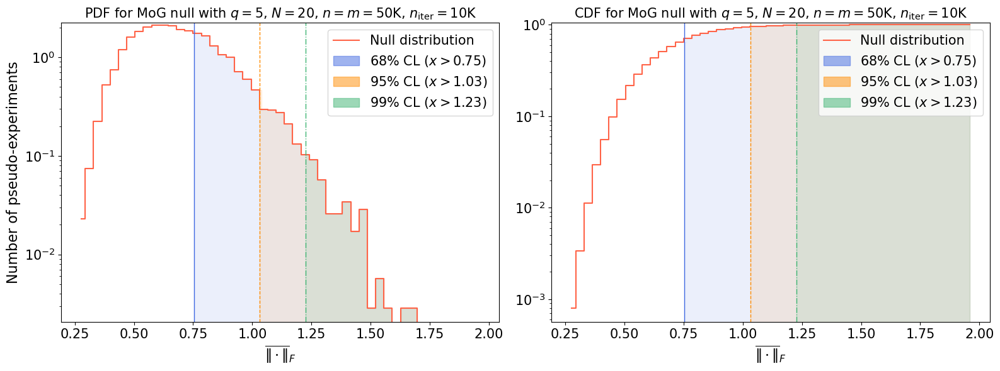

Time elapsed: 0.9443870158866048 seconds.
mu = 0.08223540512696872 +/- 1.1175555062781036e-06
sigma = 0.0105714497883597 +/- 0.00015231345210337053
68%CL = 0.08455483773245144, 95%CL = 0.10223514442470755, 99%CL = 0.11867007250507887
mu = 0.08223540512696872 +/- 1.1175555062781036e-06
sigma = 0.0105714497883597 +/- 0.00015231345210337053


/tmp/ipykernel_59766/952439541.py:87: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax[0].set_ylim(current_ylim0)
/tmp/ipykernel_59766/952439541.py:89: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend0.legendHandles[-3:]:
/tmp/ipykernel_59766/952439541.py:126: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax[1].set_ylim(current_ylim1)
/tmp/ipykernel_59766/952439541.py:132: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend1.legendHandles[-3:]:


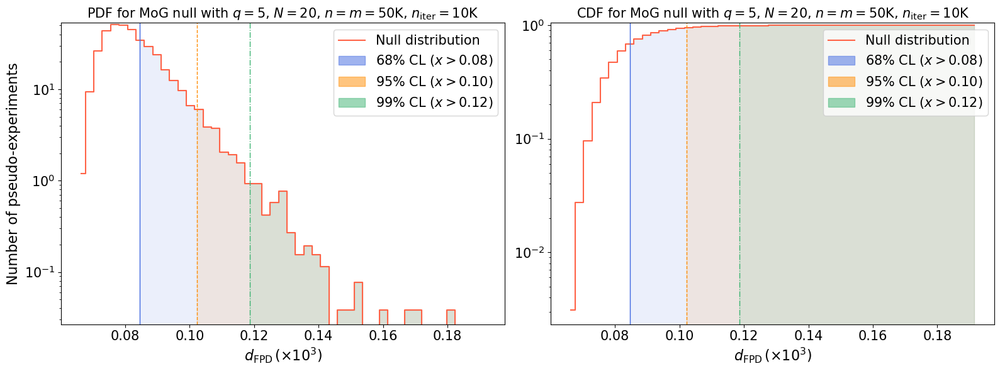

Time elapsed: 0.8913420280441642 seconds.
mu = -0.033677732548431344 +/- 8.592079045817322e-07
sigma = 0.009269346819392035 +/- 6.936507671867274e-05
68%CL = -0.02980805695518285, 95%CL = -0.017595029402706075, 99%CL = -0.010273542830496751
mu = -0.033677732548431344 +/- 8.592079045817322e-07
sigma = 0.009269346819392035 +/- 6.936507671867274e-05


/tmp/ipykernel_59766/952439541.py:87: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax[0].set_ylim(current_ylim0)
/tmp/ipykernel_59766/952439541.py:89: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend0.legendHandles[-3:]:
/tmp/ipykernel_59766/952439541.py:126: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax[1].set_ylim(current_ylim1)
/tmp/ipykernel_59766/952439541.py:132: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend1.legendHandles[-3:]:


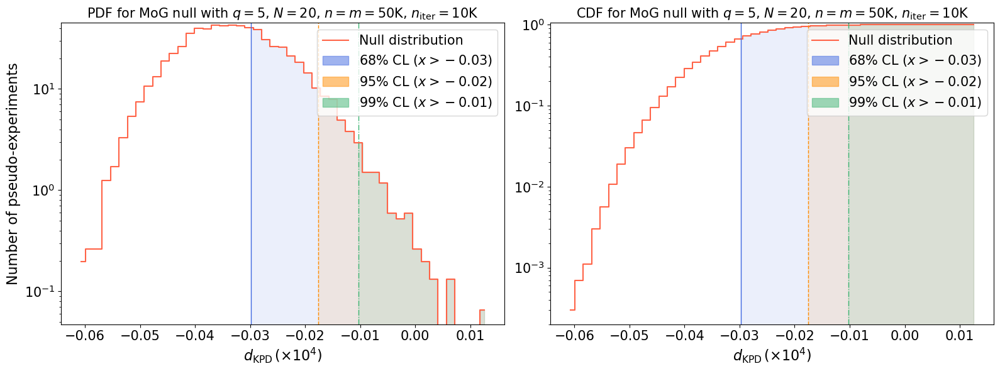

Time elapsed: 0.9558239670004696 seconds.
mu = 0.8677692417467859 +/- 0.00017155892629936733
sigma = 0.1309805047705067 +/- 0.0011716103748585546
68%CL = 0.9107360682881419, 95%CL = 1.113437504031046, 99%CL = 1.265069835617235
mu = 0.8677692417467859 +/- 0.00017155892629936733
sigma = 0.1309805047705067 +/- 0.0011716103748585546


/tmp/ipykernel_59766/952439541.py:87: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax[0].set_ylim(current_ylim0)
/tmp/ipykernel_59766/952439541.py:89: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend0.legendHandles[-3:]:
/tmp/ipykernel_59766/952439541.py:126: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax[1].set_ylim(current_ylim1)
/tmp/ipykernel_59766/952439541.py:132: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend1.legendHandles[-3:]:


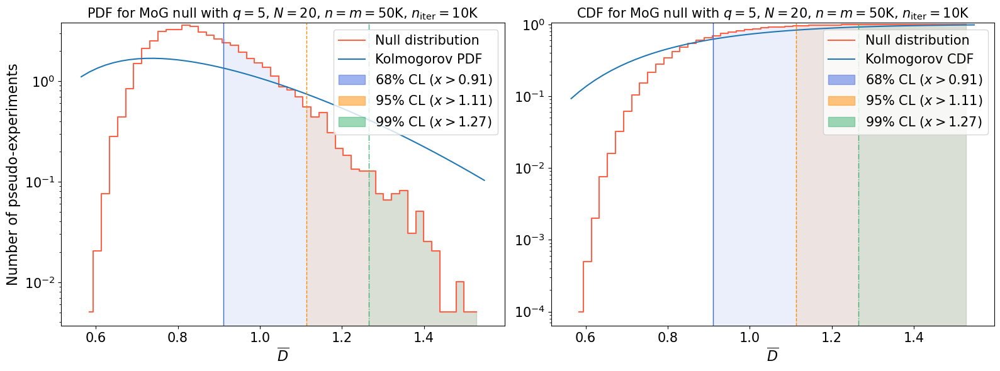

Time elapsed: 1.2736167251132429 seconds.
mu = 0.8673627625838782 +/- 0.0001350739171896792
sigma = 0.11622130492714286 +/- 0.0010167182938079162
68%CL = 0.9051712124041097, 95%CL = 1.0860214450011858, 99%CL = 1.2144733317493273
mu = 0.8673627625838782 +/- 0.0001350739171896792
sigma = 0.11622130492714286 +/- 0.0010167182938079162


/tmp/ipykernel_59766/952439541.py:87: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax[0].set_ylim(current_ylim0)
/tmp/ipykernel_59766/952439541.py:89: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend0.legendHandles[-3:]:
/tmp/ipykernel_59766/952439541.py:126: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax[1].set_ylim(current_ylim1)
/tmp/ipykernel_59766/952439541.py:132: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend1.legendHandles[-3:]:


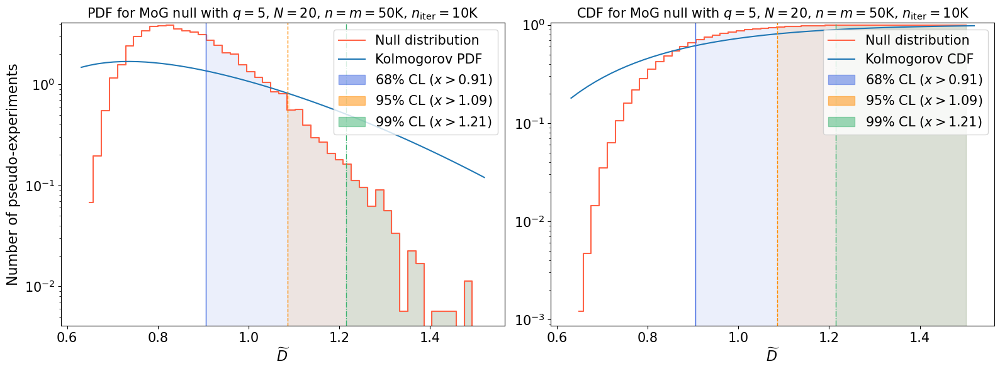

Time elapsed: 1.5023870640434325 seconds.
mu = 0.28095831698496654 +/- 2.9109082753463176e-05
sigma = 0.05395283380274216 +/- 0.0005489356647816172
68%CL = 0.29478278791061024, 95%CL = 0.38460164884663617, 99%CL = 0.45343926958855013
mu = 0.28095831698496654 +/- 2.9109082753463176e-05
sigma = 0.05395283380274216 +/- 0.0005489356647816172


/tmp/ipykernel_59766/952439541.py:87: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax[0].set_ylim(current_ylim0)
/tmp/ipykernel_59766/952439541.py:89: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend0.legendHandles[-3:]:
/tmp/ipykernel_59766/952439541.py:126: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax[1].set_ylim(current_ylim1)
/tmp/ipykernel_59766/952439541.py:132: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend1.legendHandles[-3:]:


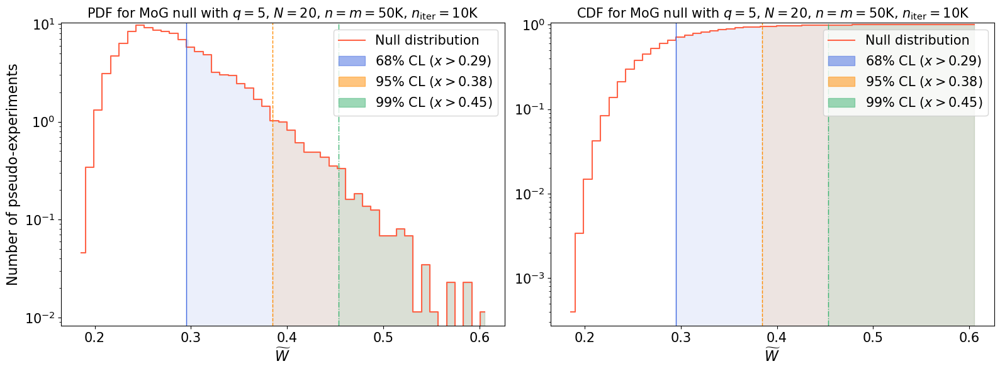

Time elapsed: 1.0564558538608253 seconds.


,name,object_name,class_name,kwargs,result_key,scale_func,scale_func_string,test_config,max_vectorize,latex,null_file,thresholds,null_figure
0,fn,FNMetric,GMetrics.FNMetric,{},metric_list,<function <lambda> at 0x7f1c6c07f640>,"lambda ns, ndims: np.sqrt(ns)/ndims","{'niter': 10000, 'batch_size_test': 50000, 'ba...",200,$\overline{\|\cdot\|}_{F}$,results/20D_unimodal/20D_50K/null_hypothesis/F...,"[[0.68, [6800, 3199], 0.7528504498660104], [0....",results/20D_unimodal/20D_50K/null_hypothesis/F...
1,fpd,FPDMetric,GMetrics.FPDMetric,{},metric_list,<function <lambda> at 0x7f1c6c07f7f0>,"lambda ns, ndims: 1000","{'niter': 10000, 'batch_size_test': 50000, 'ba...",50,$d_{\mathrm{FPD}}$,results/20D_unimodal/20D_50K/null_hypothesis/F...,"[[0.68, [6800, 3199], 0.08455483773245144], [0...",results/20D_unimodal/20D_50K/null_hypothesis/F...
2,kpd,KPDMetric,GMetrics.KPDMetric,{},metric_list,<function <lambda> at 0x7f1c6c07d900>,"lambda ns, ndims: 10000","{'niter': 10000, 'batch_size_test': 50000, 'ba...",1,$d_{\mathrm{KPD}}$,results/20D_unimodal/20D_50K/null_hypothesis/K...,"[[0.68, [6800, 3199], -0.02980805695518285], [...",results/20D_unimodal/20D_50K/null_hypothesis/K...
3,ks,KSTest,GMetrics.KSTest,{},statistic_means,<function <lambda> at 0x7f1c6c07c790>,"lambda ns, _: np.sqrt(ns)","{'niter': 10000, 'batch_size_test': 50000, 'ba...",5000,$\overline{D}$,results/20D_unimodal/20D_50K/null_hypothesis/K...,"[[0.68, [6800, 3199], 0.9107360682881419], [0....",results/20D_unimodal/20D_50K/null_hypothesis/K...
4,sks,SKSTest,GMetrics.SKSTest,"{'nslices': 100, 'seed_slicing': 0}",metric_means,<function <lambda> at 0x7f1c6c07e320>,"lambda ns, _: np.sqrt(ns)","{'niter': 10000, 'batch_size_test': 50000, 'ba...",100,$\widetilde{D}$,results/20D_unimodal/20D_50K/null_hypothesis/S...,"[[0.68, [6800, 3199], 0.9051712124041097], [0....",results/20D_unimodal/20D_50K/null_hypothesis/S...
5,swd,SWDMetric,GMetrics.SWDMetric,"{'nslices': 100, 'seed_slicing': 0}",metric_means,<function <lambda> at 0x7f1c6c07e170>,"lambda ns, ndims: np.sqrt(ns/ndims)","{'niter': 10000, 'batch_size_test': 50000, 'ba...",100,$\widetilde{W}$,results/20D_unimodal/20D_50K/null_hypothesis/S...,"[[0.68, [6800, 3199], 0.29478278791061024], [0...",results/20D_unimodal/20D_50K/null_hypothesis/S...
6,lr,LRMetric,GMetrics.LRMetric,{'null_test': True},lik_ratio_norm_list,<function <lambda> at 0x7f1c6c07e830>,"lambda ns, ndims: np.sqrt(ns)","{'niter': 10000, 'batch_size_test': 50000, 'ba...",100,$t_{\mu}$,results/20D_unimodal/20D_50K/null_hypothesis/L...,[],NaN


In [60]:
for metric in list(metrics_config[unique_key].values())[:-1]:
    name = metric["name"]
    name_cap = name.upper()
    latex = metric["latex"]
    if "FPD" in latex:
        latex = r"$d_{\mathrm{FPD}}\,(\times 10^{3})$"
    elif "KPD" in latex:
        latex = r"$d_{\mathrm{KPD}}\,(\times 10^{4})$"
    obj = eval(metric["object_name"])
    result_key = metric["result_key"]
    scale_func = metric["scale_func"]
    figure_file = metric["null_file"].replace("json","pdf")
    thresholds = metric["thresholds"]

    start = timer()
    
    nsamples = obj.Inputs.batch_size_test
    niter = obj.Inputs.niter
    ns = nsamples**2 /(2*nsamples)
    dist_null = np.array(obj.Results[-1].result_value[result_key])*scale_func(ns, ndims)

    scale = 'log'
    num_bins = 50  # number of bins|
    
    mu, deltamu, sigma, deltasigma = (np.mean(dist_null), se_mean(dist_null), np.std(dist_null), se_std(dist_null))
    sigma_68, sigma_95, sigma_99 = [np.sort(dist_null)[int(len(dist_null)*cl)] for cl in [0.68, 0.95, 0.99]]
    print(f"mu = {mu} +/- {deltamu}")
    print(f"sigma = {sigma} +/- {deltasigma}")
    print(f"68%CL = {sigma_68}, 95%CL = {sigma_95}, 99%CL = {sigma_99}")
    
    print("mu =", mu, "+/-", deltamu)
    print("sigma =", sigma, "+/-", deltasigma)
    
    min_x, max_x = min(dist_null), max(dist_null) # lower and upper limit of the binning
    x = np.linspace(min_x, max_x, num_bins + 1)
    counts, bin_edges = np.histogram(dist_null, bins=x, density=True)
    cum_counts = np.cumsum(counts)/np.sum(counts)
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
    
    # Only if metric is KS-derived plot the theoretical distribution
    if "ks" in name:
        # Calculate the theoretical PDF and CDF of the KS distribution for each x value
        theoretical_pdf_ks = kstwobign.pdf(x)
        theoretical_cdf_ks = kstwobign.cdf(x)

        # Empirical SKS Normal
        empirical_pdf_norm = norm.pdf(x, loc=kstwobign.mean(), scale=kstwobign.std())
        empirical_cdf_norm = norm.cdf(x, loc=kstwobign.mean(), scale=kstwobign.std())

    fig, ax = plt.subplots(1, 2, figsize=(16, 6))
    
    dash_styles = ['-', '--', '-.']
    colors = ["royalblue", "darkorange", "mediumseagreen"]
    
    # Create step plot
    step_edges = np.convolve(bin_centers, [0.5, 0.5], 'valid')
    step_counts = counts[:-1]  # assuming counts is one element longer than step_edges

    ax[0].step(step_edges, step_counts, where='mid', linestyle='-', color = "tomato", label = "Null distribution")
    current_ylim0 = ax[0].get_ylim()
    if "ks" in name:
        ax[0].plot(x, theoretical_pdf_ks, label="Kolmogorov PDF")
    ax[0].set_yscale(scale)
    ax[0].set_xlabel(r"%s"%latex, fontsize=16)
    ax[0].set_ylabel('Number of pseudo-experiments', fontsize=16)
    ax[0].set_title('PDF for MoG null with $q = '+str(ncomp)+'$, $N = '+str(ndims)+'$, $n=m='+str(int(nsamples/1000))+'$K, $n_{\mathrm{iter}} = '+str(int(niter/1000))+'$K', fontsize=15)
    ax[0].tick_params(axis='x', labelsize=15)  # Set x-axis tick label size
    ax[0].tick_params(axis='y', labelsize=15)  # Set y-axis tick label size

    
    #for i, threshold in enumerate(thresholds):
    #    confidence_level, _, threshold_value = threshold
    #    closest_edge = bin_edges[np.argmin(np.abs(bin_edges - threshold_value))]
    #    ax[0].fill_betweenx([0, 2*counts.max()], closest_edge, bin_edges[-1], color=colors[i], alpha=0.1, step='mid', label=f"{int(confidence_level * 100)} CL% ($x>{format(threshold_value,'.2f')}$)")
    #    ax[0].axvline(x=closest_edge, linestyle=dash_styles[i], color=colors[i], linewidth=1)#, label=f'{int(confidence_level * 100)}% threshold')
    
    for i, threshold in enumerate(thresholds):
        confidence_level, _, threshold_value = threshold
        start_index = np.searchsorted(step_edges, threshold_value, side="right") - 1
        start_index = max(start_index, 0)
        fill_x_range = np.concatenate([[threshold_value], step_edges[start_index+1:]])
        fill_y_values = step_counts[start_index:]
        if len(fill_x_range) > 1 and len(fill_y_values) > 0:
            ax[0].fill_between(fill_x_range, 0, fill_y_values, color=colors[i], alpha=0.1, step='mid', label=f"{int(confidence_level * 100)}% CL ($x>{format(threshold_value, '.2f')}   $)")
        ax[0].axvline(x=threshold_value, linestyle=dash_styles[i], color=colors[i], linewidth=1)

    ax[0].set_ylim(current_ylim0)  
    legend0 = ax[0].legend(loc='upper right', fontsize=15)
    for handle in legend0.legendHandles[-3:]:
        handle.set_alpha(0.5)  # Set to desired alpha value
    
    # Create step plot
    step_edges = np.convolve(bin_centers, [0.5, 0.5], 'valid')
    step_counts = cum_counts[:-1]  # assuming counts is one element longer than step_edges
    
    ax[1].step(step_edges, step_counts, where='mid', linestyle='-', color = "tomato", label = "Null distribution")
    #ax[1].plot(bin_centers, cum_counts, linestyle = '-', color = "tomato", label = "Null distribution", drawstyle='steps-mid')
    current_ylim1 = ax[1].get_ylim()
    if "ks" in name:
        ax[1].plot(x, theoretical_cdf_ks, label="Kolmogorov CDF")
    #for i, threshold in enumerate(thresholds):
    #    confidence_level, _, threshold_value = threshold
    #    ax[1].axhline(y=confidence_level, color=colors[i], linestyle=dash_styles[i], linewidth=0.5, alpha=1)
    ax[1].set_yscale(scale)
    ax[1].set_xlabel(r"%s"%latex, fontsize=16)
    ax[1].set_title('CDF for MoG null with $q = '+str(ncomp)+'$, $N = '+str(ndims)+'$, $n=m='+str(int(nsamples/1000))+'$K, $n_{\mathrm{iter}} = '+str(int(niter/1000))+'$K', fontsize=15)
    ax[1].tick_params(axis='x', labelsize=15)  # Set x-axis tick label size
    ax[1].tick_params(axis='y', labelsize=15)  # Set y-axis tick label size
    
    #for i, threshold in enumerate(thresholds):
    #    confidence_level, _, threshold_value = threshold
    #    closest_edge = bin_edges[np.argmin(np.abs(bin_edges - threshold_value))]
    #    ax[1].fill_betweenx([0, 2*counts.max()], closest_edge, bin_edges[-1], color=colors[i], alpha=0.1, step='mid', label=f"{int(confidence_level * 100)} CL% ($x>{format(threshold_value,'.2f')}$)")
    #    ax[1].axvline(x=closest_edge, linestyle=dash_styles[i], color=colors[i], linewidth=1)#, label=f'{int(confidence_level * 100)}% threshold')
    
    for i, threshold in enumerate(thresholds):
        confidence_level, _, threshold_value = threshold
        start_index = np.searchsorted(step_edges, threshold_value, side="right") - 1
        start_index = max(start_index, 0)
        fill_x_range = np.concatenate([[threshold_value], step_edges[start_index+1:]])
        fill_y_values = step_counts[start_index:]
        if len(fill_x_range) > 1 and len(fill_y_values) > 0:
            ax[1].fill_between(fill_x_range, 0, fill_y_values, color=colors[i], alpha=0.1, step='mid', label=f"{int(confidence_level * 100)}% CL ($x>{format(threshold_value, '.2f')}   $)")
        ax[1].axvline(x=threshold_value, linestyle=dash_styles[i], color=colors[i], linewidth=1)
    
    ax[1].set_ylim(current_ylim1)  
    #for i, threshold in enumerate(thresholds):
    #    confidence, _, value = threshold
    #    ax[1].axvline(x=value, color=colors[i], linestyle=dash_styles[i], alpha=1, label=f"{int(confidence_level * 100)} CL% ($x>{format(threshold_value,'.2f')}$)")
    
    legend1 = ax[1].legend(loc='upper right', fontsize=15)
    for handle in legend1.legendHandles[-3:]:
        handle.set_alpha(0.5)  # Set to desired alpha value
    
    plt.subplots_adjust(wspace=0.1)  # Adjust this value to your liking
    plt.tight_layout()
    plt.savefig(figure_file)
    plt.show()
    plt.close()
    
    metric.update({"null_figure": figure_file})

    end = timer()
    print("Time elapsed:", end-start, "seconds.")

GMetrics.utils.save_update_metrics_config(metrics_config = metrics_config, metrics_config_file = metrics_config_file) # type: ignore

## Alternative hypotheses and results

### Scan and exclusion limits (bisection method)

In [61]:
if test_config_null["use_tf"]:
    dtype = getattr(tf, test_config_null["dtype_input"])
else:
    dtype = np.dtype(test_config_null["dtype_input"])
test_kwargs = {"niter": 10,
               "batch_size_test": test_config_null["batch_size_test"],
               "batch_size_gen": test_config_null["batch_size_gen"],
               "small_sample_threshold": test_config_null["small_sample_threshold"],
               "dtype_input": dtype,
               "seed_input": test_config_null["seed"],
               "use_tf": test_config_null["use_tf"],
               "mirror_strategy": test_config_null["mirror_strategy"],
               "verbose": False}

In [62]:
file_path = model_dir + "exclusion_limits.json"
if os.path.exists(file_path):
    try:
        with open(file_path, "r") as file:
            existing_data = json.load(file)
    except json.JSONDecodeError:
        existing_data = {}
else:
    existing_data = {}

In [63]:
deformations = ["mean", "std", "off", "cov", "mean_std", "mean_off", "mean_cov"]
global_results = {}

for metric_config in list(metrics_config[unique_key].values())[:-1]:
    for deformation in deformations:
        result = {k: v for k, v in {k: v for k, v in existing_data.items() if v["null_config"]["name"] == metric_config["name"] and v["deformation"] == deformation}.items() if v["exclusion_list"] != []}
        if result == {}:
            print(f"Computing exclusion limits for {metric_config['name']} with {deformation} deformation.")
            result = compute_exclusion_bisection(metric_config = metric_config,
                                                 test_kwargs = test_kwargs,
                                                 model_dir = model_dir,
                                                 deformation = deformation,
                                                 seed_dist = 0,
                                                 x_tol = 0.01,
                                                 fn_tol = 0.02,
                                                 eps_min = 0.,
                                                 eps_max = 50.,
                                                 max_iterations = 100,
                                                 save = True,
                                                 verbose = True)
        else:
            print(f"Exclusion limits for {metric_config['name']} with {deformation} deformation already loaded.")
        global_results.update(result)
print(global_results.keys())

Exclusion limits for fn with mean deformation already loaded.
Exclusion limits for fn with std deformation already loaded.
Exclusion limits for fn with off deformation already loaded.
Exclusion limits for fn with cov deformation already loaded.
Exclusion limits for fn with mean_std deformation already loaded.
Exclusion limits for fn with mean_off deformation already loaded.
Exclusion limits for fn with mean_cov deformation already loaded.
Exclusion limits for fpd with mean deformation already loaded.
Exclusion limits for fpd with std deformation already loaded.
Exclusion limits for fpd with off deformation already loaded.
Exclusion limits for fpd with cov deformation already loaded.
Exclusion limits for fpd with mean_std deformation already loaded.
Exclusion limits for fpd with mean_off deformation already loaded.
Exclusion limits for fpd with mean_cov deformation already loaded.
Exclusion limits for kpd with mean deformation already loaded.
Exclusion limits for kpd with std deformatio

### Likelihood-ratio test

In [64]:
if test_config_null["use_tf"]:
    dtype = getattr(tf, test_config_null["dtype_input"])
else:
    dtype = np.dtype(test_config_null["dtype_input"])
test_kwargs = {"niter": 10_000,
               "batch_size_test": test_config_null["batch_size_test"],
               "batch_size_gen": test_config_null["batch_size_gen"],
               "small_sample_threshold": test_config_null["small_sample_threshold"],
               "dtype_input": dtype,
               "seed_input": test_config_null["seed"],
               "use_tf": test_config_null["use_tf"],
               "mirror_strategy": test_config_null["mirror_strategy"],
               "verbose": True}
metrics_config[unique_key]["lr"]['kwargs']["verbose"] = True

In [65]:
deformations = ["mean", "std", "off", "cov", "mean_std", "mean_off", "mean_cov"]

for deformation in deformations:
    result = {k: v for k, v in existing_data.items() if v["null_config"]["name"] == "lr" and v["deformation"] == deformation}
    if result == {}:
        print(f"Computing exclusion limits for lr with {deformation} deformation.")
        result = compute_exclusion_LR_bisection(metric_config = metrics_config[unique_key]["lr"],
                                                test_kwargs = test_kwargs,
                                                model_dir = model_dir,
                                                cl_list = [0.95, 0.99],
                                                deformation = deformation,
                                                seed_dist = 0,
                                                x_tol = 0.01,
                                                fn_tol = 0.01,
                                                eps_min = 0.,
                                                eps_max = 0.01,
                                                max_iterations = 100,
                                                save = True,
                                                verbose = True)
    else:
        print(f"Exclusion limits for LR with {deformation} deformation already loaded.")
    global_results.update(result)
print(global_results.keys())

Exclusion limits for LR with mean deformation already loaded.
Exclusion limits for LR with std deformation already loaded.
Exclusion limits for LR with off deformation already loaded.
Exclusion limits for LR with cov deformation already loaded.
Exclusion limits for LR with mean_std deformation already loaded.
Exclusion limits for LR with mean_off deformation already loaded.
Exclusion limits for LR with mean_cov deformation already loaded.
dict_keys(['2024-04-16T17:33:36.931538', '2024-04-16T17:35:18.493804', '2024-04-16T17:37:13.317290', '2024-04-16T17:39:15.350731', '2024-04-16T17:40:41.633373', '2024-04-16T17:42:40.062187', '2024-04-16T17:44:44.481076', '2024-04-16T17:46:29.420941', '2024-04-16T17:49:33.110475', '2024-04-16T17:53:00.169760', '2024-04-16T17:56:42.163321', '2024-04-16T17:59:53.253478', '2024-04-16T18:03:32.730130', '2024-04-16T18:07:24.951483', '2024-04-16T18:10:55.878266', '2024-04-16T18:21:01.057697', '2024-04-16T18:28:24.189321', '2024-04-16T18:35:48.472766', '2024-

### Show and save results

In [66]:
global_results_list = [x for x in global_results.values()]
results = []
for global_result in global_results_list:
    name = global_result["null_config"]["name"]
    print(f"Metric: {name}")
    deformation = global_result["deformation"]
    ndims = global_result["null_config"]["test_config"]["ndims"]
    niter = global_result["null_config"]["test_config"]["niter"]
    nsamples = global_result["null_config"]["test_config"]["batch_size_test"]
    try:
        exclusion_95 = eval(format(global_result["exclusion_list"][0][2], ".5f"))
    except:
        exclusion_95 = "N/A"
    try:
        exclusion_99 = eval(format(global_result["exclusion_list"][1][2], ".5f"))
    except:
        exclusion_99 = "N/A"
    time_elapsed = global_result["time_elapsed"]
    #print(exclusion_95)
    #print(round_to_n_significant_digits(exclusion_95, 3))
    results.append([name, deformation, ndims, niter, nsamples, exclusion_95, exclusion_99, int(time_elapsed)])
    #results.append([name, deformation, ndims, niter, nsamples, round_to_n_significant_digits(exclusion_95, 3), round_to_n_significant_digits(exclusion_99, 3), int(time_elapsed)])
results_df = pd.DataFrame(results, columns=["Statistic", "Deformation", "$N$", "$n=m$", "$n_{\\mathrm{iter}}$", "$\\epsilon_{95\\%\\mathrm{CL}}$", "$\\epsilon_{99\\%\\mathrm{CL}}$", "t (s)"])
times_df = pd.DataFrame(null_times+[["lr", "-"]], columns=["Statistic", "$t^{\\mathrm{null}}$ (s)"])

Metric: fn
Metric: fn
Metric: fn
Metric: fn
Metric: fn
Metric: fn
Metric: fn
Metric: fpd
Metric: fpd
Metric: fpd
Metric: fpd
Metric: fpd
Metric: fpd
Metric: fpd
Metric: kpd
Metric: kpd
Metric: kpd
Metric: kpd
Metric: kpd
Metric: kpd
Metric: kpd
Metric: ks
Metric: ks
Metric: ks
Metric: ks
Metric: ks
Metric: ks
Metric: ks
Metric: sks
Metric: sks
Metric: sks
Metric: sks
Metric: sks
Metric: sks
Metric: sks
Metric: swd
Metric: swd
Metric: swd
Metric: swd
Metric: swd
Metric: swd
Metric: swd
Metric: lr
Metric: lr
Metric: lr
Metric: lr
Metric: lr
Metric: lr
Metric: lr


In [67]:
results_df_mean = results_df[results_df["Deformation"] == "mean"]
results_df_std = results_df[results_df["Deformation"] == "std"]
results_df_off = results_df[results_df["Deformation"] == "off"]
results_df_cov = results_df[results_df["Deformation"] == "cov"]
results_df_mean_std = results_df[results_df["Deformation"] == "mean_std"]
results_df_mean_off = results_df[results_df["Deformation"] == "mean_off"]
results_df_mean_cov = results_df[results_df["Deformation"] == "mean_cov"]

In [68]:
sorted_df_mean = results_df_mean.sort_values(by="$\\epsilon_{95\\%\\mathrm{CL}}$", ascending=True)
sorted_df_mean.rename(columns={"$\\epsilon_{95\\%\\mathrm{CL}}$": "$\\epsilon^{\\mu}_{95\\%\\mathrm{CL}}$", "$\\epsilon_{99\\%\\mathrm{CL}}$": "$\\epsilon^{\\mu}_{99\\%\\mathrm{CL}}$", "t (s)": "$t^{\\mu}$ (s)"}, inplace=True)
display(sorted_df_mean)
sorted_df_mean.drop(columns=["Deformation","$N$","$n=m$","$n_{\\mathrm{iter}}$"], inplace=True)
display(sorted_df_mean)

,Statistic,Deformation,$N$,$n=m$,$n_{\mathrm{iter}}$,$\epsilon^{\mu}_{95\%\mathrm{CL}}$,$\epsilon^{\mu}_{99\%\mathrm{CL}}$,$t^{\mu}$ (s)
42,lr,mean,20,10000,50000,0.00127,0.00177,1117
7,fpd,mean,20,10000,50000,0.01597,0.02141,183
35,swd,mean,20,10000,50000,0.01607,0.02150,176
28,sks,mean,20,10000,50000,0.01721,0.02246,285
21,ks,mean,20,10000,50000,0.01903,0.02522,184
0,fn,mean,20,10000,50000,0.03157,0.04548,101
14,kpd,mean,20,10000,50000,0.40436,0.41495,605


,Statistic,$\epsilon^{\mu}_{95\%\mathrm{CL}}$,$\epsilon^{\mu}_{99\%\mathrm{CL}}$,$t^{\mu}$ (s)
42,lr,0.00127,0.00177,1117
7,fpd,0.01597,0.02141,183
35,swd,0.01607,0.02150,176
28,sks,0.01721,0.02246,285
21,ks,0.01903,0.02522,184
0,fn,0.03157,0.04548,101
14,kpd,0.40436,0.41495,605


In [69]:
sorted_df_std = results_df_std.sort_values(by="$\\epsilon_{95\\%\\mathrm{CL}}$", ascending=True)
sorted_df_std.rename(columns={"$\\epsilon_{95\\%\\mathrm{CL}}$": "$\\epsilon^{\\sigma}_{95\\%\\mathrm{CL}}$", "$\\epsilon_{99\\%\\mathrm{CL}}$": "$\\epsilon^{\\sigma}_{99\\%\\mathrm{CL}}$", "t (s)": "$t^{\\sigma}$ (s)"}, inplace=True)
display(sorted_df_std)
sorted_df_std.drop(columns=["Deformation","$N$","$n=m$","$n_{\\mathrm{iter}}$"], inplace=True)
display(sorted_df_std)

,Statistic,Deformation,$N$,$n=m$,$n_{\mathrm{iter}}$,$\epsilon^{\sigma}_{95\%\mathrm{CL}}$,$\epsilon^{\sigma}_{99\%\mathrm{CL}}$,$t^{\sigma}$ (s)
43,lr,std,20,10000,50000,0.00011,0.00015,1586
8,fpd,std,20,10000,50000,0.00437,0.00602,207
1,fn,std,20,10000,50000,0.00579,0.00915,114
29,sks,std,20,10000,50000,0.01521,0.02103,283
36,swd,std,20,10000,50000,0.01531,0.02150,185
22,ks,std,20,10000,50000,0.02794,0.03814,179
15,kpd,std,20,10000,50000,6.22559,6.37521,443


,Statistic,$\epsilon^{\sigma}_{95\%\mathrm{CL}}$,$\epsilon^{\sigma}_{99\%\mathrm{CL}}$,$t^{\sigma}$ (s)
43,lr,0.00011,0.00015,1586
8,fpd,0.00437,0.00602,207
1,fn,0.00579,0.00915,114
29,sks,0.01521,0.02103,283
36,swd,0.01531,0.02150,185
22,ks,0.02794,0.03814,179
15,kpd,6.22559,6.37521,443


In [70]:
sorted_df_off = results_df_off.sort_values(by="$\\epsilon_{95\\%\\mathrm{CL}}$", ascending=True)
sorted_df_off.rename(columns={"$\\epsilon_{95\\%\\mathrm{CL}}$": "$\\epsilon^{\\Sigma_{ij}-\\Sigma_{ii}}_{95\\%\\mathrm{CL}}$", "$\\epsilon_{99\\%\\mathrm{CL}}$": "$\\epsilon^{\\Sigma_{ij}-\\Sigma_{ii}}_{99\\%\\mathrm{CL}}$", "t (s)": "$t^{\\Sigma_{ij}-\\Sigma_{ii}}$ (s)"}, inplace=True)
display(sorted_df_off)
sorted_df_off.drop(columns=["Deformation","$N$","$n=m$","$n_{\\mathrm{iter}}$"], inplace=True)
display(sorted_df_off)

,Statistic,Deformation,$N$,$n=m$,$n_{\mathrm{iter}}$,$\epsilon^{\Sigma_{ij}-\Sigma_{ii}}_{95\%\mathrm{CL}}$,$\epsilon^{\Sigma_{ij}-\Sigma_{ii}}_{99\%\mathrm{CL}}$,$t^{\Sigma_{ij}-\Sigma_{ii}}$ (s)
44,lr,off,20,10000,50000,0.00006,0.00008,1672
9,fpd,off,20,10000,50000,0.00219,0.00303,221
2,fn,off,20,10000,50000,0.00285,0.00453,122
30,sks,off,20,10000,50000,0.01006,0.01411,299
37,swd,off,20,10000,50000,0.01054,0.01526,181
23,ks,off,20,10000,50000,0.02813,0.03776,181
16,kpd,off,20,10000,50000,6.07910,6.22922,444


,Statistic,$\epsilon^{\Sigma_{ij}-\Sigma_{ii}}_{95\%\mathrm{CL}}$,$\epsilon^{\Sigma_{ij}-\Sigma_{ii}}_{99\%\mathrm{CL}}$,$t^{\Sigma_{ij}-\Sigma_{ii}}$ (s)
44,lr,0.00006,0.00008,1672
9,fpd,0.00219,0.00303,221
2,fn,0.00285,0.00453,122
30,sks,0.01006,0.01411,299
37,swd,0.01054,0.01526,181
23,ks,0.02813,0.03776,181
16,kpd,6.07910,6.22922,444


In [71]:
sorted_df_cov = results_df_cov.sort_values(by="$\\epsilon_{95\\%\\mathrm{CL}}$", ascending=True)
sorted_df_cov.rename(columns={"$\\epsilon_{95\\%\\mathrm{CL}}$": "$\\epsilon^{\\Sigma_{ij}}_{95\\%\\mathrm{CL}}$", "$\\epsilon_{99\\%\\mathrm{CL}}$": "$\\epsilon^{\\Sigma_{ij}}_{99\\%\\mathrm{CL}}$", "t (s)": "$t^{\\Sigma_{ij}}$ (s)"}, inplace=True)
display(sorted_df_cov)
sorted_df_cov.drop(columns=["Deformation","$N$","$n=m$","$n_{\\mathrm{iter}}$"], inplace=True)
display(sorted_df_cov)

,Statistic,Deformation,$N$,$n=m$,$n_{\mathrm{iter}}$,$\epsilon^{\Sigma_{ij}}_{95\%\mathrm{CL}}$,$\epsilon^{\Sigma_{ij}}_{99\%\mathrm{CL}}$,$t^{\Sigma_{ij}}$ (s)
45,lr,cov,20,10000,50000,0.00184,0.00276,1068
10,fpd,cov,20,10000,50000,0.01955,0.02575,191
38,swd,cov,20,10000,50000,0.02127,0.02861,183
31,sks,cov,20,10000,50000,0.02584,0.03452,288
24,ks,cov,20,10000,50000,0.02871,0.03843,178
3,fn,cov,20,10000,50000,0.26016,0.37097,86
17,kpd,cov,20,10000,50000,5.10254,5.34369,442


,Statistic,$\epsilon^{\Sigma_{ij}}_{95\%\mathrm{CL}}$,$\epsilon^{\Sigma_{ij}}_{99\%\mathrm{CL}}$,$t^{\Sigma_{ij}}$ (s)
45,lr,0.00184,0.00276,1068
10,fpd,0.01955,0.02575,191
38,swd,0.02127,0.02861,183
31,sks,0.02584,0.03452,288
24,ks,0.02871,0.03843,178
3,fn,0.26016,0.37097,86
17,kpd,5.10254,5.34369,442


In [72]:
sorted_df_mean_std = results_df_mean_std.sort_values(by="$\\epsilon_{95\\%\\mathrm{CL}}$", ascending=True)
sorted_df_mean_std.rename(columns={"$\\epsilon_{95\\%\\mathrm{CL}}$": "$\\epsilon^{\\mu-\\sigma}_{95\\%\\mathrm{CL}}$", "$\\epsilon_{99\\%\\mathrm{CL}}$": "$\\epsilon^{\\mu-\\sigma}_{99\\%\\mathrm{CL}}$", "t (s)": "$t^{\\mu-\\sigma}$ (s)"}, inplace=True)
display(sorted_df_mean_std)
sorted_df_mean_std.drop(columns=["Deformation","$N$","$n=m$","$n_{\\mathrm{iter}}$"], inplace=True)
display(sorted_df_mean_std)

,Statistic,Deformation,$N$,$n=m$,$n_{\mathrm{iter}}$,$\epsilon^{\mu-\sigma}_{95\%\mathrm{CL}}$,$\epsilon^{\mu-\sigma}_{99\%\mathrm{CL}}$,$t^{\mu-\sigma}$ (s)
46,lr,mean_std,20,10000,50000,0.00011,0.00015,1556
11,fpd,mean_std,20,10000,50000,0.00428,0.00588,219
4,fn,mean_std,20,10000,50000,0.00594,0.00935,118
32,sks,mean_std,20,10000,50000,0.01101,0.01440,300
39,swd,mean_std,20,10000,50000,0.01121,0.01516,188
25,ks,mean_std,20,10000,50000,0.01502,0.01969,187
18,kpd,mean_std,20,10000,50000,0.40131,0.41190,607


,Statistic,$\epsilon^{\mu-\sigma}_{95\%\mathrm{CL}}$,$\epsilon^{\mu-\sigma}_{99\%\mathrm{CL}}$,$t^{\mu-\sigma}$ (s)
46,lr,0.00011,0.00015,1556
11,fpd,0.00428,0.00588,219
4,fn,0.00594,0.00935,118
32,sks,0.01101,0.01440,300
39,swd,0.01121,0.01516,188
25,ks,0.01502,0.01969,187
18,kpd,0.40131,0.41190,607


In [73]:
sorted_df_mean_off = results_df_mean_off.sort_values(by="$\\epsilon_{95\\%\\mathrm{CL}}$", ascending=True)
sorted_df_mean_off.rename(columns={"$\\epsilon_{95\\%\\mathrm{CL}}$": "$\\epsilon^{\\mu-\\Sigma_{ij}-\\Sigma_{ii}}_{95\\%\\mathrm{CL}}$", "$\\epsilon_{99\\%\\mathrm{CL}}$": "$\\epsilon^{\\mu-\\Sigma_{ij}-\\Sigma_{ii}}_{99\\%\\mathrm{CL}}$", "t (s)": "$t^{\\mu-\\Sigma_{ij}-\\Sigma_{ii}}$ (s)"}, inplace=True)
display(sorted_df_mean_off)
sorted_df_mean_off.drop(columns=["Deformation","$N$","$n=m$","$n_{\\mathrm{iter}}$"], inplace=True)
display(sorted_df_mean_off)

,Statistic,Deformation,$N$,$n=m$,$n_{\mathrm{iter}}$,$\epsilon^{\mu-\Sigma_{ij}-\Sigma_{ii}}_{95\%\mathrm{CL}}$,$\epsilon^{\mu-\Sigma_{ij}-\Sigma_{ii}}_{99\%\mathrm{CL}}$,$t^{\mu-\Sigma_{ij}-\Sigma_{ii}}$ (s)
47,lr,mean_off,20,10000,50000,0.00006,0.00008,1720
12,fpd,mean_off,20,10000,50000,0.00220,0.00302,232
5,fn,mean_off,20,10000,50000,0.00292,0.00460,124
33,sks,mean_off,20,10000,50000,0.00851,0.01132,318
40,swd,mean_off,20,10000,50000,0.00870,0.01218,193
26,ks,mean_off,20,10000,50000,0.01483,0.01969,194
19,kpd,mean_off,20,10000,50000,0.41351,0.42411,612


,Statistic,$\epsilon^{\mu-\Sigma_{ij}-\Sigma_{ii}}_{95\%\mathrm{CL}}$,$\epsilon^{\mu-\Sigma_{ij}-\Sigma_{ii}}_{99\%\mathrm{CL}}$,$t^{\mu-\Sigma_{ij}-\Sigma_{ii}}$ (s)
47,lr,0.00006,0.00008,1720
12,fpd,0.00220,0.00302,232
5,fn,0.00292,0.00460,124
33,sks,0.00851,0.01132,318
40,swd,0.00870,0.01218,193
26,ks,0.01483,0.01969,194
19,kpd,0.41351,0.42411,612


In [74]:
sorted_df_mean_cov = results_df_mean_cov.sort_values(by="$\\epsilon_{95\\%\\mathrm{CL}}$", ascending=True)
sorted_df_mean_cov.rename(columns={"$\\epsilon_{95\\%\\mathrm{CL}}$": "$\\epsilon^{\\mu-\Sigma_{ij}}_{95\\%\\mathrm{CL}}$", "$\\epsilon_{99\\%\\mathrm{CL}}$": "$\\epsilon^{\\mu-\Sigma_{ij}}_{99\\%\\mathrm{CL}}$", "t (s)": "$t^{\\mu-\Sigma_{ij}}$ (s)"}, inplace=True)
display(sorted_df_mean_cov)
sorted_df_mean_cov.drop(columns=["Deformation","$N$","$n=m$","$n_{\\mathrm{iter}}$"], inplace=True)
display(sorted_df_mean_cov)

,Statistic,Deformation,$N$,$n=m$,$n_{\mathrm{iter}}$,$\epsilon^{\mu-\Sigma_{ij}}_{95\%\mathrm{CL}}$,$\epsilon^{\mu-\Sigma_{ij}}_{99\%\mathrm{CL}}$,$t^{\mu-\Sigma_{ij}}$ (s)
48,lr,mean_cov,20,10000,50000,0.00098,0.00144,1128
13,fpd,mean_cov,20,10000,50000,0.01292,0.01697,210
41,swd,mean_cov,20,10000,50000,0.01349,0.01802,192
34,sks,mean_cov,20,10000,50000,0.01397,0.01812,313
27,ks,mean_cov,20,10000,50000,0.01521,0.01988,197
6,fn,mean_cov,20,10000,50000,0.03138,0.04491,104
20,kpd,mean_cov,20,10000,50000,0.38605,0.39362,614


,Statistic,$\epsilon^{\mu-\Sigma_{ij}}_{95\%\mathrm{CL}}$,$\epsilon^{\mu-\Sigma_{ij}}_{99\%\mathrm{CL}}$,$t^{\mu-\Sigma_{ij}}$ (s)
48,lr,0.00098,0.00144,1128
13,fpd,0.01292,0.01697,210
41,swd,0.01349,0.01802,192
34,sks,0.01397,0.01812,313
27,ks,0.01521,0.01988,197
6,fn,0.03138,0.04491,104
20,kpd,0.38605,0.39362,614


In [75]:
result_table = sorted_df_mean.merge(sorted_df_std, on='Statistic', how='outer').merge(sorted_df_off, on='Statistic', how='outer').merge(sorted_df_cov, on='Statistic', how='outer')
result_table = result_table.replace("lr","$t_{\\mathrm{LLR}}$").replace("ks","$\\overline{D}$").replace("sks","$\\widetilde{D}$").replace("swd","$\\widetilde{W}$").replace("fpd","$d_{\\mathrm{FPD}}$").replace("fn","$\\overline{\\|\cdot\\|}_{F}$").replace("kpd","$d_{\\mathrm{KPD}}$")
#display(result_table)
print(result_table.to_latex(index=False, column_format='l|llr|llr|llr|llr', longtable=False, float_format="%.2g").replace("\\toprule","\\toprule\n\\multicolumn{1}{c}{} & \\multicolumn{3}{c}{$\\mu$-deformation} & \\multicolumn{3}{c}{$\\sigma$-deformation} & \\multicolumn{3}{c}{$\\Sigma_{ij}-\\Sigma_{ii}$-deformation} & \\multicolumn{3}{c}{$\\Sigma_{ij}$-deformation} \\\\").replace("$\\epsilon^{\\mu}_{95\\%\\mathrm{CL}}$", "$\\epsilon_{95\\%\\mathrm{CL}}$").replace("$\\epsilon^{\\mu}_{99\\%\\mathrm{CL}}$", "$\\epsilon_{99\\%\\mathrm{CL}}$").replace("$t^{\\mu}$ (s)", "t (s)").replace("$\\epsilon^{\\sigma}_{95\\%\\mathrm{CL}}$", "$\\epsilon_{95\\%\\mathrm{CL}}$").replace("$\\epsilon^{\\sigma}_{99\\%\\mathrm{CL}}$", "$\\epsilon_{99\\%\\mathrm{CL}}$").replace("$t^{\\sigma}$ (s)", "t (s)").replace("$\\epsilon^{\\Sigma_{ij}-\\Sigma_{ii}}_{95\\%\\mathrm{CL}}$", "$\\epsilon_{95\\%\\mathrm{CL}}$").replace("$\\epsilon^{\\Sigma_{ij}-\\Sigma_{ii}}_{99\\%\\mathrm{CL}}$", "$\\epsilon_{99\\%\\mathrm{CL}}$").replace("$t^{\\Sigma_{ij}-\\Sigma_{ii}}$ (s)", "t (s)").replace("$\\epsilon^{\\Sigma_{ij}}_{95\\%\\mathrm{CL}}$", "$\\epsilon_{95\\%\\mathrm{CL}}$").replace("$\\epsilon^{\\Sigma_{ij}}_{99\\%\\mathrm{CL}}$", "$\\epsilon_{99\\%\\mathrm{CL}}$").replace("$t^{\\Sigma_{ij}}$ (s)", "t (s)").replace("\\bottomrule\n\\end{tabular}\n","").replace("\\toprule","\\toprule\n\\multicolumn{13}{c}{$\\mathbf{n=m=5\\cdot 10^{4}}$} \\\\").rstrip())
result_table = sorted_df_mean_std.merge(sorted_df_mean_off, on='Statistic', how='outer').merge(sorted_df_mean_cov, on='Statistic', how='outer').merge(times_df, on='Statistic', how='outer')
result_table = result_table.replace("lr","$t_{\\mathrm{LLR}}$").replace("ks","$\\overline{D}$").replace("sks","$\\widetilde{D}$").replace("swd","$\\widetilde{W}$").replace("fpd","$d_{\\mathrm{FPD}}$").replace("fn","$\\overline{\\|\cdot\\|}_{F}$").replace("kpd","$d_{\\mathrm{KPD}}$")
#display(result_table)
print(result_table.to_latex(index=False, column_format='l|llr|llr|llr|r', longtable=False, float_format="%.2g").replace("$\\epsilon^{\\mu-\\sigma}_{95\\%\\mathrm{CL}}$","$\\epsilon_{95\\%\\mathrm{CL}}$").replace("$\\epsilon^{\\mu-\\sigma}_{99\\%\\mathrm{CL}}$","$\\epsilon_{99\\%\\mathrm{CL}}$").replace("$t^{\\mu-\\sigma}$ (s)","t (s)").replace("$\\epsilon^{\\mu-\\Sigma_{ij}-\\Sigma_{ii}}_{95\\%\\mathrm{CL}}$","$\\epsilon_{95\\%\\mathrm{CL}}$").replace("$\\epsilon^{\\mu-\\Sigma_{ij}-\\Sigma_{ii}}_{99\\%\\mathrm{CL}}$","$\\epsilon_{99\\%\\mathrm{CL}}$").replace("$t^{\\mu-\\Sigma_{ij}-\\Sigma_{ii}}$ (s)","t (s)").replace("$\\epsilon^{\\mu-\Sigma_{ij}}_{95\\%\\mathrm{CL}}$","$\\epsilon_{95\\%\\mathrm{CL}}$").replace("$\\epsilon^{\\mu-\Sigma_{ij}}_{99\\%\\mathrm{CL}}$","$\\epsilon_{99\\%\\mathrm{CL}}$").replace("$t^{\\mu-\Sigma_{ij}}$ (s)","t (s)").replace("\\begin{tabular}{l|llr|llr|llr|r}","").replace("\\toprule","\\toprule\n\\multicolumn{1}{c}{} & \\multicolumn{3}{c}{$\\mu-\\sigma$-deformation} & \\multicolumn{3}{c}{$\\mu-\\Sigma_{ij}-\\Sigma_{ii}$-deformation} & \\multicolumn{3}{c}{$\\mu-\\Sigma_{ij}$-deformation} & \\multicolumn{3}{c}{} \\\\").lstrip())

\begin{tabular}{l|llr|llr|llr|llr}
\toprule
\multicolumn{13}{c}{$\mathbf{n=m=5\cdot 10^{4}}$} \\
\multicolumn{1}{c}{} & \multicolumn{3}{c}{$\mu$-deformation} & \multicolumn{3}{c}{$\sigma$-deformation} & \multicolumn{3}{c}{$\Sigma_{ij}-\Sigma_{ii}$-deformation} & \multicolumn{3}{c}{$\Sigma_{ij}$-deformation} \\
Statistic & $\epsilon_{95\%\mathrm{CL}}$ & $\epsilon_{99\%\mathrm{CL}}$ & t (s) & $\epsilon_{95\%\mathrm{CL}}$ & $\epsilon_{99\%\mathrm{CL}}$ & t (s) & $\epsilon_{95\%\mathrm{CL}}$ & $\epsilon_{99\%\mathrm{CL}}$ & t (s) & $\epsilon_{95\%\mathrm{CL}}$ & $\epsilon_{99\%\mathrm{CL}}$ & t (s) \\
\midrule
$t_{\mathrm{LLR}}$ & 0.0013 & 0.0018 & 1117 & 0.00011 & 0.00015 & 1586 & 6e-05 & 8e-05 & 1672 & 0.0018 & 0.0028 & 1068 \\
$d_{\mathrm{FPD}}$ & 0.016 & 0.021 & 183 & 0.0044 & 0.006 & 207 & 0.0022 & 0.003 & 221 & 0.02 & 0.026 & 191 \\
$\widetilde{W}$ & 0.016 & 0.021 & 176 & 0.015 & 0.021 & 185 & 0.011 & 0.015 & 181 & 0.021 & 0.029 & 183 \\
$\widetilde{D}$ & 0.017 & 0.022 & 285 & 0.015 

# Fixed $n=100000$

## Null hypotheses

### Model definition

In [76]:
batch_size_test = 100_000

In [77]:
model_dir = results_dir + str(ndims) + "D_" + str(int(batch_size_test/1000)) + "K/"
if os.path.exists(model_dir):
    print("Model directory exists")
else:
    os.makedirs(model_dir)
    print("Model directory was created")
null_hypotheses_dir = model_dir + "null_hypothesis/"
if os.path.exists(null_hypotheses_dir):
    print("Null hypothesis directory exists")
else:
    os.makedirs(null_hypotheses_dir)
    print("Null hypothesis directory was created")
metrics_config_file = model_dir + "metrics_config.json"

Model directory exists
Null hypothesis directory exists


In [78]:
TwoSampleTestInputs = GMetrics.TwoSampleTestInputs(dist_1_input = dist_1,
                                                   dist_2_input = dist_2,
                                                   niter = niter,
                                                   batch_size_test = batch_size_test,
                                                   batch_size_gen = 10_000,
                                                   small_sample_threshold = 1e7,
                                                   dtype_input = tf.float64,
                                                   seed_input = 0,
                                                   use_tf = True,
                                                   mirror_strategy = False,
                                                   verbose = True)
print("nsamples",TwoSampleTestInputs.nsamples)
print("batch_size",TwoSampleTestInputs.batch_size_test)
print("niter",TwoSampleTestInputs.niter)
print("niter * batch_size",TwoSampleTestInputs.niter*TwoSampleTestInputs.batch_size_test)
print("small_sample",TwoSampleTestInputs.small_sample)

Parsing input distribution...
Input distribution is a tfp.distributions.Distribution object.
Parsing input distribution...
Input distribution is a tfp.distributions.Distribution object.
Checking and setting numerical distributions.
Resetting dist_num.
Resetting dist_num.
nsamples 1000000000
batch_size 100000
niter 10000
niter * batch_size 1000000000
small_sample False


In [79]:
FNMetric = GMetrics.FNMetric(TwoSampleTestInputs,
                             progress_bar = True,
                             verbose = True)
KSTest = GMetrics.KSTest(TwoSampleTestInputs,
                         progress_bar = True,
                         verbose = True)
SKSTest = GMetrics.SKSTest(TwoSampleTestInputs,
                           nslices = 100,
                           seed_slicing = 0,
                           progress_bar = True,
                           verbose = True)
SWDMetric = GMetrics.SWDMetric(TwoSampleTestInputs,
                               nslices = 100,
                               seed_slicing = 0,
                               progress_bar = True,
                               verbose = True)
FPDMetric = GMetrics.FPDMetric(TwoSampleTestInputs,
                               progress_bar = True,
                               verbose = True,
                               #min_samples_input = 20_000,
                               #max_samples_input = 50_000,
                               num_batches = 20)
KPDMetric = GMetrics.KPDMetric(TwoSampleTestInputs,
                               progress_bar = True,
                               verbose = True,
                               degree = 4,
                               block_size = 10_000,
                               num_batches = 1,
                               batch_size = 100_000)
LRMetric = GMetrics.LRMetric(TwoSampleTestInputs,
                             null_test=True,
                             verbose = True)

Generating random directions based on nslices, ndims, and seed_slicing.
Generating random directions based on nslices, ndims, and seed_slicing.
To run under the alternative hypothesis, set the `null_test` attribute to False.


### Set up tests and metrics configurations

In [80]:
test_config_null = {}
test_config_tmp = dict(TwoSampleTestInputs.__dict__)
keys_to_remove = ["_dist_1_input", "_dist_2_input", "_dist_1_num", "_dist_2_num", "_dist_1_symb", "_dist_2_symb", "_seed_generator"]
for key in keys_to_remove:
    test_config_tmp.pop(key, None)
for key, value in test_config_tmp.items():
    new_key = key.lstrip('_')
    
    if isinstance(value, tf.Tensor):
        new_value = value.numpy() # type: ignore
    elif isinstance(value, np.ndarray):
        new_value = value.tolist()
    elif isinstance(value, np.generic):
        new_value = value.item() # Convert NumPy scalars to Python scalars
    elif isinstance(value, tf.DType):
        new_value = value.name
    elif isinstance(value, np.dtype):
        new_value = np.dtype(value).name
    else:
        new_value = value
    
    test_config_null[new_key] = new_value

test_config_null["ncomp"] = ncomp

pd.DataFrame([test_config_null])

,niter,batch_size_test,batch_size_gen,small_sample_threshold,dtype_input,seed,use_tf,mirror_strategy,strategy,verbose,...,ndims_1,nsamples_1,is_symb_2,ndims_2,nsamples_2,dtype,ndims,nsamples,small_sample,ncomp
0,10000,100000,10000,10000000,float64,0,True,False,None,True,...,20,0,True,20,0,float64,20,1000000000,False,5


In [81]:
unique_key = "config_ndims_"+str(TwoSampleTestInputs.ndims)+"_ncop_"+str(ncomp)+"_nsamples_"+str(TwoSampleTestInputs.batch_size_test)+"_niter_"+str(TwoSampleTestInputs.niter)
metrics_config = {unique_key: {"fn": {"name": "fn", # type: ignore
                                       "object_name": "FNMetric",
                                       "class_name": "GMetrics.FNMetric",
                                       "kwargs": {},
                                       "result_key": "metric_list", 
                                       "scale_func": lambda ns, ndims: np.sqrt(ns)/ndims,
                                       "scale_func_string": "lambda ns, ndims: np.sqrt(ns)/ndims",
                                       "test_config": test_config_null,
                                       "max_vectorize": 100,
                                       "latex": "$\overline{\|\cdot\|}_{F}$",
                                       "null_file": null_hypotheses_dir+"FN.json"},
                               "fpd": {"name": "fpd",
                                       "object_name": "FPDMetric",
                                       "class_name": "GMetrics.FPDMetric",
                                       "kwargs": {},
                                       "result_key": "metric_list", 
                                       "scale_func": lambda ns, ndims: 1000,#(ns/ndims)**(3/2),
                                       "scale_func_string": "lambda ns, ndims: 1000",
                                       "test_config": test_config_null,
                                       "max_vectorize": 20,
                                       "latex": "$d_{\mathrm{FPD}}$",
                                       "null_file": null_hypotheses_dir+"FPD.json"},
                               "kpd": {"name": "kpd",
                                       "object_name": "KPDMetric" ,
                                       "class_name": "GMetrics.KPDMetric",
                                       "kwargs": {},
                                       "result_key": "metric_list", 
                                       "scale_func": lambda ns, ndims: 10000,#ns/np.sqrt(ndims),
                                       "scale_func_string": "lambda ns, ndims: 10000",
                                       "test_config": test_config_null,
                                       "max_vectorize": 1,
                                       "latex": "$d_{\mathrm{KPD}}$",
                                       "null_file": null_hypotheses_dir+"KPD.json"},
                               "ks":  {"name": "ks",
                                       "object_name": "KSTest",
                                       "class_name": "GMetrics.KSTest", 
                                       "kwargs": {},
                                       "result_key": "statistic_means", 
                                       "scale_func": lambda ns, _ : np.sqrt(ns),
                                       "scale_func_string": "lambda ns, _: np.sqrt(ns)",
                                       "test_config": test_config_null,
                                       "max_vectorize": 2000,
                                       "latex": "$\overline{D}$",
                                       "null_file": null_hypotheses_dir+"KS.json"},
                               "sks": {"name": "sks",
                                       "object_name": "SKSTest",
                                       "class_name": "GMetrics.SKSTest", 
                                       "kwargs": {"nslices": 100, "seed_slicing": 0},
                                       "result_key": "metric_means", 
                                       "scale_func": lambda ns, _ : np.sqrt(ns),
                                       "scale_func_string": "lambda ns, _: np.sqrt(ns)",
                                       "test_config": test_config_null,
                                       "max_vectorize": 100,
                                       "latex": "$\widetilde{D}$",
                                       "null_file": null_hypotheses_dir+"SKS.json"},
                               "swd": {"name": "swd",
                                       "object_name": "SWDMetric",
                                       "class_name": "GMetrics.SWDMetric", 
                                       "kwargs": {"nslices": 100, "seed_slicing": 0},
                                       "result_key": "metric_means", 
                                       "scale_func": lambda ns, ndims: np.sqrt(ns/ndims),
                                       "scale_func_string": "lambda ns, ndims: np.sqrt(ns/ndims)",
                                       "test_config": test_config_null,
                                       "max_vectorize": 100,
                                       "latex": "$\widetilde{W}$",
                                       "null_file": null_hypotheses_dir+"SWD.json"},
                               "lr": {"name": "lr",
                                       "object_name": "LRMetric",
                                       "class_name": "GMetrics.LRMetric", 
                                       "kwargs": {"null_test": True},
                                       "result_key": "lik_ratio_norm_list", 
                                       "scale_func": lambda ns, ndims: np.sqrt(ns),
                                       "scale_func_string": "lambda ns, ndims: np.sqrt(ns)",
                                       "test_config": test_config_null,
                                       "max_vectorize": 50,
                                       "latex": "$t_{\mu}$",
                                       "null_file": null_hypotheses_dir+"LR.json"}}}
metrics_config[unique_key]

{'fn': {'name': 'fn',
  'object_name': 'FNMetric',
  'class_name': 'GMetrics.FNMetric',
  'kwargs': {},
  'result_key': 'metric_list',
  'scale_func': <function __main__.<lambda>(ns, ndims)>,
  'scale_func_string': 'lambda ns, ndims: np.sqrt(ns)/ndims',
  'test_config': {'niter': 10000,
   'batch_size_test': 100000,
   'batch_size_gen': 10000,
   'small_sample_threshold': 10000000,
   'dtype_input': 'float64',
   'seed': 0,
   'use_tf': True,
   'mirror_strategy': False,
   'strategy': None,
   'verbose': True,
   'is_symb_1': True,
   'ndims_1': 20,
   'nsamples_1': 0,
   'is_symb_2': True,
   'ndims_2': 20,
   'nsamples_2': 0,
   'dtype': 'float64',
   'ndims': 20,
   'nsamples': 1000000000,
   'small_sample': False,
   'ncomp': 5},
  'max_vectorize': 100,
  'latex': '$\\overline{\\|\\cdot\\|}_{F}$',
  'null_file': 'results/20D_unimodal/20D_100K/null_hypothesis/FN.json'},
 'fpd': {'name': 'fpd',
  'object_name': 'FPDMetric',
  'class_name': 'GMetrics.FPDMetric',
  'kwargs': {},
  're

### Evaluate null hypotheses

In [82]:
for metric in list(metrics_config[unique_key].values())[:-1]:
    file = metric["null_file"]
    name = metric["name"]
    max_vectorize = metric["max_vectorize"]
    obj = eval(metric["object_name"])
    if os.path.exists(file):
        print(f"Loading {name} from {file}")
        obj.Results.load_from_json(file)
    else:
        print(f"Computing and savng {name} with max_vectorize = {max_vectorize}")
        obj.Test_tf(max_vectorize=max_vectorize)
        print(f"Saving {name} to {file}")
        obj.Results.save_to_json(file)

Loading fn from results/20D_unimodal/20D_100K/null_hypothesis/FN.json
Loading fpd from results/20D_unimodal/20D_100K/null_hypothesis/FPD.json
Loading kpd from results/20D_unimodal/20D_100K/null_hypothesis/KPD.json
Loading ks from results/20D_unimodal/20D_100K/null_hypothesis/KS.json


Loading sks from results/20D_unimodal/20D_100K/null_hypothesis/SKS.json
Loading swd from results/20D_unimodal/20D_100K/null_hypothesis/SWD.json


In [83]:
cl_list = [0.68, 0.95, 0.99]
null_times = []

for metric in list(metrics_config[unique_key].values())[:-1]:
    name = metric["name"]
    obj = eval(metric["object_name"])
    result_key = metric["result_key"]
    scale_func = metric["scale_func"]
    
    nsamples = obj.Inputs.batch_size_test
    ns = nsamples**2 /(2*nsamples)
    dist_null = np.array(obj.Results[-1].result_value[result_key])*scale_func(ns, ndims)

    metric_thresholds = [[cl, 
                          [int(cl*len(dist_null)), 
                           int((1-cl)*len(dist_null))], 
                          np.sort(dist_null)[int(len(dist_null)*cl)]] for cl in cl_list]
    print(f"ThresholdS for metric {metric['name']}: {metric_thresholds}")
    null_time = obj.Results[-1].__dict__['computing_time']
    null_times.append([name, int(null_time)])
    print(f"Computing time for metric {metric['name']}: {null_time}")
    
    metric.update({"thresholds": metric_thresholds})
    
metrics_config[unique_key]["lr"]["thresholds"] = []

GMetrics.utils.save_update_metrics_config(metrics_config = metrics_config, metrics_config_file = metrics_config_file) # type: ignore

ThresholdS for metric fn: [[0.68, [6800, 3199], 0.7497740563332209], [0.95, [9500, 500], 1.0335148147738626], [0.99, [9900, 100], 1.2423774808290733]]
Computing time for metric fn: 25.915534429019317
ThresholdS for metric fpd: [[0.68, [6800, 3199], 0.05293719844674096], [0.95, [9500, 500], 0.0600483317796896], [0.99, [9900, 100], 0.06628593187637868]]
Computing time for metric fpd: 564.2194251650944
ThresholdS for metric kpd: [[0.68, [6800, 3199], -0.02159208404930446], [0.95, [9500, 500], -0.013456617087248548], [0.99, [9900, 100], -0.008393198214751152]]
Computing time for metric kpd: 29900.47628878709
ThresholdS for metric ks: [[0.68, [6800, 3199], 0.9098575007485578], [0.95, [9500, 500], 1.1147930513981992], [0.99, [9900, 100], 1.246831668641481]]
Computing time for metric ks: 206.73133146693
ThresholdS for metric sks: [[0.68, [6800, 3199], 0.9054295005779338], [0.95, [9500, 500], 1.0848732656815778], [0.99, [9900, 100], 1.2053976747108415]]
Computing time for metric sks: 650.58131

,name,object_name,class_name,kwargs,result_key,scale_func,scale_func_string,test_config,max_vectorize,latex,null_file,thresholds
0,fn,FNMetric,GMetrics.FNMetric,{},metric_list,<function <lambda> at 0x7f1be8610820>,"lambda ns, ndims: np.sqrt(ns)/ndims","{'niter': 10000, 'batch_size_test': 100000, 'b...",100,$\overline{\|\cdot\|}_{F}$,results/20D_unimodal/20D_100K/null_hypothesis/...,"[[0.68, [6800, 3199], 0.7497740563332209], [0...."
1,fpd,FPDMetric,GMetrics.FPDMetric,{},metric_list,<function <lambda> at 0x7f1be8613c70>,"lambda ns, ndims: 1000","{'niter': 10000, 'batch_size_test': 100000, 'b...",20,$d_{\mathrm{FPD}}$,results/20D_unimodal/20D_100K/null_hypothesis/...,"[[0.68, [6800, 3199], 0.05293719844674096], [0..."
2,kpd,KPDMetric,GMetrics.KPDMetric,{},metric_list,<function <lambda> at 0x7f1be86124d0>,"lambda ns, ndims: 10000","{'niter': 10000, 'batch_size_test': 100000, 'b...",1,$d_{\mathrm{KPD}}$,results/20D_unimodal/20D_100K/null_hypothesis/...,"[[0.68, [6800, 3199], -0.02159208404930446], [..."
3,ks,KSTest,GMetrics.KSTest,{},statistic_means,<function <lambda> at 0x7f1be8612950>,"lambda ns, _: np.sqrt(ns)","{'niter': 10000, 'batch_size_test': 100000, 'b...",2000,$\overline{D}$,results/20D_unimodal/20D_100K/null_hypothesis/...,"[[0.68, [6800, 3199], 0.9098575007485578], [0...."
4,sks,SKSTest,GMetrics.SKSTest,"{'nslices': 100, 'seed_slicing': 0}",metric_means,<function <lambda> at 0x7f1be86128c0>,"lambda ns, _: np.sqrt(ns)","{'niter': 10000, 'batch_size_test': 100000, 'b...",100,$\widetilde{D}$,results/20D_unimodal/20D_100K/null_hypothesis/...,"[[0.68, [6800, 3199], 0.9054295005779338], [0...."
5,swd,SWDMetric,GMetrics.SWDMetric,"{'nslices': 100, 'seed_slicing': 0}",metric_means,<function <lambda> at 0x7f1be8611360>,"lambda ns, ndims: np.sqrt(ns/ndims)","{'niter': 10000, 'batch_size_test': 100000, 'b...",100,$\widetilde{W}$,results/20D_unimodal/20D_100K/null_hypothesis/...,"[[0.68, [6800, 3199], 0.29478870243519845], [0..."
6,lr,LRMetric,GMetrics.LRMetric,{'null_test': True},lik_ratio_norm_list,<function <lambda> at 0x7f1be86103a0>,"lambda ns, ndims: np.sqrt(ns)","{'niter': 10000, 'batch_size_test': 100000, 'b...",50,$t_{\mu}$,results/20D_unimodal/20D_100K/null_hypothesis/...,[]


### Plots of null-distributions

mu = 0.6806095719296456 +/- 0.00037194252371767025
sigma = 0.19285811461218588 +/- 0.0016098426169475506
68%CL = 0.7497740563332209, 95%CL = 1.0335148147738626, 99%CL = 1.2423774808290733
mu = 0.6806095719296456 +/- 0.00037194252371767025
sigma = 0.19285811461218588 +/- 0.0016098426169475506


/tmp/ipykernel_59766/952439541.py:87: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax[0].set_ylim(current_ylim0)
/tmp/ipykernel_59766/952439541.py:89: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend0.legendHandles[-3:]:
/tmp/ipykernel_59766/952439541.py:126: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax[1].set_ylim(current_ylim1)
/tmp/ipykernel_59766/952439541.py:132: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend1.legendHandles[-3:]:


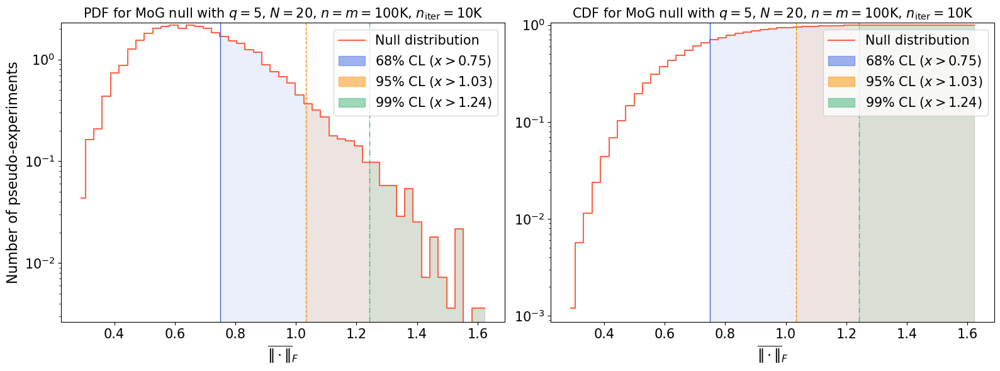

Time elapsed: 1.3174076681025326 seconds.
mu = 0.05205573580888985 +/- 1.699660993511015e-07
sigma = 0.004122694499366907 +/- 5.3259995984945545e-05
68%CL = 0.05293719844674096, 95%CL = 0.0600483317796896, 99%CL = 0.06628593187637868
mu = 0.05205573580888985 +/- 1.699660993511015e-07
sigma = 0.004122694499366907 +/- 5.3259995984945545e-05


/tmp/ipykernel_59766/952439541.py:87: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax[0].set_ylim(current_ylim0)
/tmp/ipykernel_59766/952439541.py:89: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend0.legendHandles[-3:]:
/tmp/ipykernel_59766/952439541.py:126: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax[1].set_ylim(current_ylim1)
/tmp/ipykernel_59766/952439541.py:132: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend1.legendHandles[-3:]:


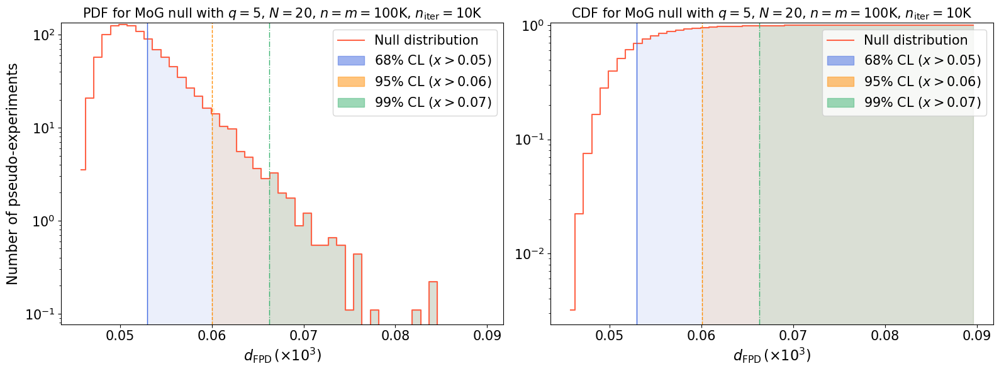

Time elapsed: 1.439622465055436 seconds.
mu = -0.024495745081719093 +/- 4.305448175527881e-07
sigma = 0.00656159140417009 +/- 4.769171953377556e-05
68%CL = -0.02159208404930446, 95%CL = -0.013456617087248548, 99%CL = -0.008393198214751152
mu = -0.024495745081719093 +/- 4.305448175527881e-07
sigma = 0.00656159140417009 +/- 4.769171953377556e-05


/tmp/ipykernel_59766/952439541.py:87: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax[0].set_ylim(current_ylim0)
/tmp/ipykernel_59766/952439541.py:89: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend0.legendHandles[-3:]:
/tmp/ipykernel_59766/952439541.py:126: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax[1].set_ylim(current_ylim1)
/tmp/ipykernel_59766/952439541.py:132: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend1.legendHandles[-3:]:


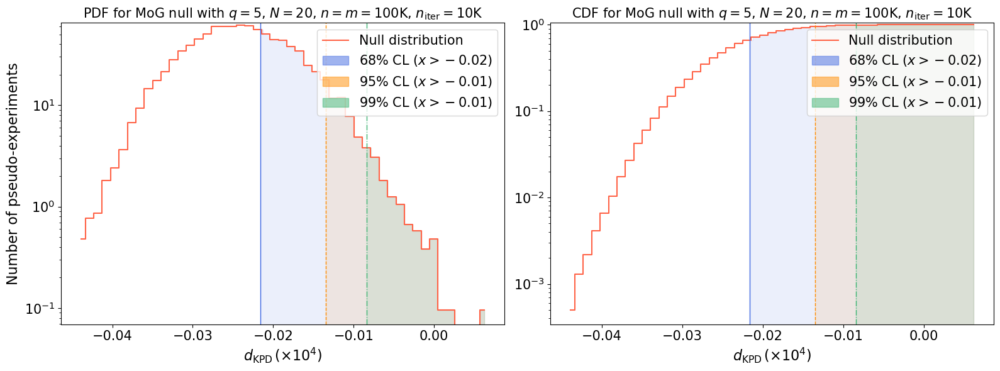

Time elapsed: 0.9487532798666507 seconds.
mu = 0.8671350622227308 +/- 0.00016891488507959362
sigma = 0.129967259369271 +/- 0.0011078670572348777
68%CL = 0.9098575007485578, 95%CL = 1.1147930513981992, 99%CL = 1.246831668641481
mu = 0.8671350622227308 +/- 0.00016891488507959362
sigma = 0.129967259369271 +/- 0.0011078670572348777


/tmp/ipykernel_59766/952439541.py:87: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax[0].set_ylim(current_ylim0)
/tmp/ipykernel_59766/952439541.py:89: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend0.legendHandles[-3:]:
/tmp/ipykernel_59766/952439541.py:126: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax[1].set_ylim(current_ylim1)
/tmp/ipykernel_59766/952439541.py:132: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend1.legendHandles[-3:]:


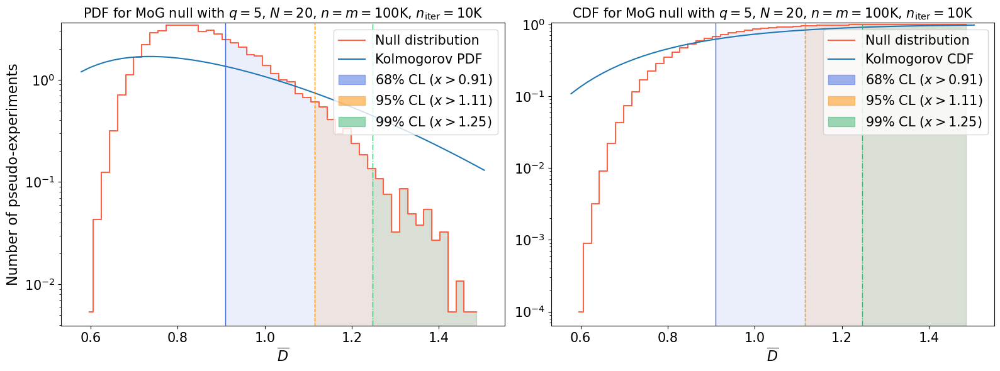

Time elapsed: 2.038891561096534 seconds.
mu = 0.8668801748175944 +/- 0.0001346382919099102
sigma = 0.1160337416055822 +/- 0.0009820466638004156
68%CL = 0.9054295005779338, 95%CL = 1.0848732656815778, 99%CL = 1.2053976747108415
mu = 0.8668801748175944 +/- 0.0001346382919099102
sigma = 0.1160337416055822 +/- 0.0009820466638004156


/tmp/ipykernel_59766/952439541.py:87: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax[0].set_ylim(current_ylim0)
/tmp/ipykernel_59766/952439541.py:89: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend0.legendHandles[-3:]:
/tmp/ipykernel_59766/952439541.py:126: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax[1].set_ylim(current_ylim1)
/tmp/ipykernel_59766/952439541.py:132: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend1.legendHandles[-3:]:


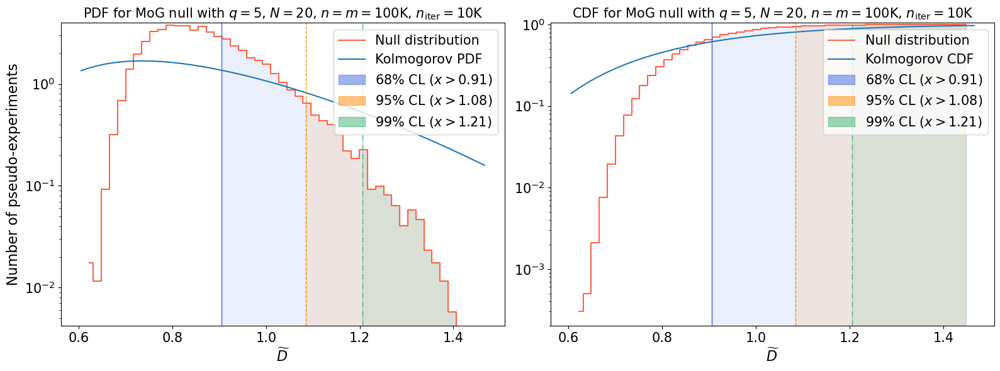

Time elapsed: 1.759979012887925 seconds.
mu = 0.2806762541431985 +/- 2.8849517929946965e-05
sigma = 0.05371174725322848 +/- 0.0005333610390741083
68%CL = 0.29478870243519845, 95%CL = 0.38412994044916837, 99%CL = 0.4514289544828107
mu = 0.2806762541431985 +/- 2.8849517929946965e-05
sigma = 0.05371174725322848 +/- 0.0005333610390741083


/tmp/ipykernel_59766/952439541.py:87: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax[0].set_ylim(current_ylim0)
/tmp/ipykernel_59766/952439541.py:89: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend0.legendHandles[-3:]:
/tmp/ipykernel_59766/952439541.py:126: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax[1].set_ylim(current_ylim1)
/tmp/ipykernel_59766/952439541.py:132: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend1.legendHandles[-3:]:


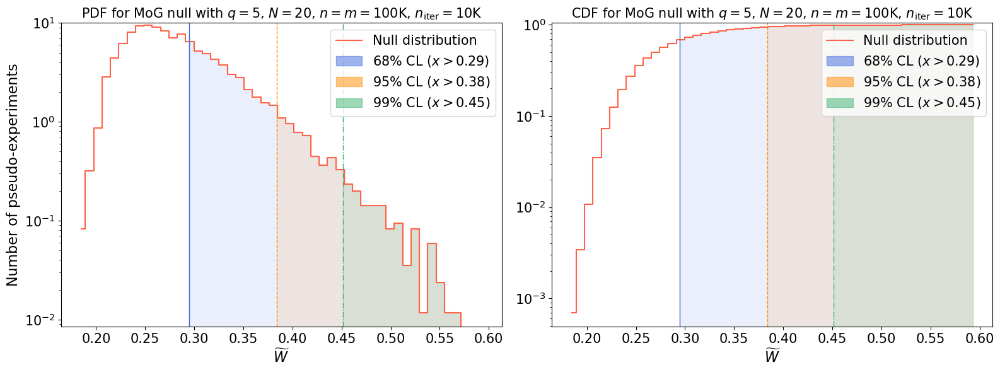

Time elapsed: 1.3666800558567047 seconds.


,name,object_name,class_name,kwargs,result_key,scale_func,scale_func_string,test_config,max_vectorize,latex,null_file,thresholds,null_figure
0,fn,FNMetric,GMetrics.FNMetric,{},metric_list,<function <lambda> at 0x7f1be8610820>,"lambda ns, ndims: np.sqrt(ns)/ndims","{'niter': 10000, 'batch_size_test': 100000, 'b...",100,$\overline{\|\cdot\|}_{F}$,results/20D_unimodal/20D_100K/null_hypothesis/...,"[[0.68, [6800, 3199], 0.7497740563332209], [0....",results/20D_unimodal/20D_100K/null_hypothesis/...
1,fpd,FPDMetric,GMetrics.FPDMetric,{},metric_list,<function <lambda> at 0x7f1be8613c70>,"lambda ns, ndims: 1000","{'niter': 10000, 'batch_size_test': 100000, 'b...",20,$d_{\mathrm{FPD}}$,results/20D_unimodal/20D_100K/null_hypothesis/...,"[[0.68, [6800, 3199], 0.05293719844674096], [0...",results/20D_unimodal/20D_100K/null_hypothesis/...
2,kpd,KPDMetric,GMetrics.KPDMetric,{},metric_list,<function <lambda> at 0x7f1be86124d0>,"lambda ns, ndims: 10000","{'niter': 10000, 'batch_size_test': 100000, 'b...",1,$d_{\mathrm{KPD}}$,results/20D_unimodal/20D_100K/null_hypothesis/...,"[[0.68, [6800, 3199], -0.02159208404930446], [...",results/20D_unimodal/20D_100K/null_hypothesis/...
3,ks,KSTest,GMetrics.KSTest,{},statistic_means,<function <lambda> at 0x7f1be8612950>,"lambda ns, _: np.sqrt(ns)","{'niter': 10000, 'batch_size_test': 100000, 'b...",2000,$\overline{D}$,results/20D_unimodal/20D_100K/null_hypothesis/...,"[[0.68, [6800, 3199], 0.9098575007485578], [0....",results/20D_unimodal/20D_100K/null_hypothesis/...
4,sks,SKSTest,GMetrics.SKSTest,"{'nslices': 100, 'seed_slicing': 0}",metric_means,<function <lambda> at 0x7f1be86128c0>,"lambda ns, _: np.sqrt(ns)","{'niter': 10000, 'batch_size_test': 100000, 'b...",100,$\widetilde{D}$,results/20D_unimodal/20D_100K/null_hypothesis/...,"[[0.68, [6800, 3199], 0.9054295005779338], [0....",results/20D_unimodal/20D_100K/null_hypothesis/...
5,swd,SWDMetric,GMetrics.SWDMetric,"{'nslices': 100, 'seed_slicing': 0}",metric_means,<function <lambda> at 0x7f1be8611360>,"lambda ns, ndims: np.sqrt(ns/ndims)","{'niter': 10000, 'batch_size_test': 100000, 'b...",100,$\widetilde{W}$,results/20D_unimodal/20D_100K/null_hypothesis/...,"[[0.68, [6800, 3199], 0.29478870243519845], [0...",results/20D_unimodal/20D_100K/null_hypothesis/...
6,lr,LRMetric,GMetrics.LRMetric,{'null_test': True},lik_ratio_norm_list,<function <lambda> at 0x7f1be86103a0>,"lambda ns, ndims: np.sqrt(ns)","{'niter': 10000, 'batch_size_test': 100000, 'b...",50,$t_{\mu}$,results/20D_unimodal/20D_100K/null_hypothesis/...,[],NaN


In [84]:
for metric in list(metrics_config[unique_key].values())[:-1]:
    name = metric["name"]
    name_cap = name.upper()
    latex = metric["latex"]
    if "FPD" in latex:
        latex = r"$d_{\mathrm{FPD}}\,(\times 10^{3})$"
    elif "KPD" in latex:
        latex = r"$d_{\mathrm{KPD}}\,(\times 10^{4})$"
    obj = eval(metric["object_name"])
    result_key = metric["result_key"]
    scale_func = metric["scale_func"]
    figure_file = metric["null_file"].replace("json","pdf")
    thresholds = metric["thresholds"]

    start = timer()
    
    nsamples = obj.Inputs.batch_size_test
    niter = obj.Inputs.niter
    ns = nsamples**2 /(2*nsamples)
    dist_null = np.array(obj.Results[-1].result_value[result_key])*scale_func(ns, ndims)

    scale = 'log'
    num_bins = 50  # number of bins|
    
    mu, deltamu, sigma, deltasigma = (np.mean(dist_null), se_mean(dist_null), np.std(dist_null), se_std(dist_null))
    sigma_68, sigma_95, sigma_99 = [np.sort(dist_null)[int(len(dist_null)*cl)] for cl in [0.68, 0.95, 0.99]]
    print(f"mu = {mu} +/- {deltamu}")
    print(f"sigma = {sigma} +/- {deltasigma}")
    print(f"68%CL = {sigma_68}, 95%CL = {sigma_95}, 99%CL = {sigma_99}")
    
    print("mu =", mu, "+/-", deltamu)
    print("sigma =", sigma, "+/-", deltasigma)
    
    min_x, max_x = min(dist_null), max(dist_null) # lower and upper limit of the binning
    x = np.linspace(min_x, max_x, num_bins + 1)
    counts, bin_edges = np.histogram(dist_null, bins=x, density=True)
    cum_counts = np.cumsum(counts)/np.sum(counts)
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
    
    # Only if metric is KS-derived plot the theoretical distribution
    if "ks" in name:
        # Calculate the theoretical PDF and CDF of the KS distribution for each x value
        theoretical_pdf_ks = kstwobign.pdf(x)
        theoretical_cdf_ks = kstwobign.cdf(x)

        # Empirical SKS Normal
        empirical_pdf_norm = norm.pdf(x, loc=kstwobign.mean(), scale=kstwobign.std())
        empirical_cdf_norm = norm.cdf(x, loc=kstwobign.mean(), scale=kstwobign.std())

    fig, ax = plt.subplots(1, 2, figsize=(16, 6))
    
    dash_styles = ['-', '--', '-.']
    colors = ["royalblue", "darkorange", "mediumseagreen"]
    
    # Create step plot
    step_edges = np.convolve(bin_centers, [0.5, 0.5], 'valid')
    step_counts = counts[:-1]  # assuming counts is one element longer than step_edges

    ax[0].step(step_edges, step_counts, where='mid', linestyle='-', color = "tomato", label = "Null distribution")
    current_ylim0 = ax[0].get_ylim()
    if "ks" in name:
        ax[0].plot(x, theoretical_pdf_ks, label="Kolmogorov PDF")
    ax[0].set_yscale(scale)
    ax[0].set_xlabel(r"%s"%latex, fontsize=16)
    ax[0].set_ylabel('Number of pseudo-experiments', fontsize=16)
    ax[0].set_title('PDF for MoG null with $q = '+str(ncomp)+'$, $N = '+str(ndims)+'$, $n=m='+str(int(nsamples/1000))+'$K, $n_{\mathrm{iter}} = '+str(int(niter/1000))+'$K', fontsize=15)
    ax[0].tick_params(axis='x', labelsize=15)  # Set x-axis tick label size
    ax[0].tick_params(axis='y', labelsize=15)  # Set y-axis tick label size

    
    #for i, threshold in enumerate(thresholds):
    #    confidence_level, _, threshold_value = threshold
    #    closest_edge = bin_edges[np.argmin(np.abs(bin_edges - threshold_value))]
    #    ax[0].fill_betweenx([0, 2*counts.max()], closest_edge, bin_edges[-1], color=colors[i], alpha=0.1, step='mid', label=f"{int(confidence_level * 100)} CL% ($x>{format(threshold_value,'.2f')}$)")
    #    ax[0].axvline(x=closest_edge, linestyle=dash_styles[i], color=colors[i], linewidth=1)#, label=f'{int(confidence_level * 100)}% threshold')
    
    for i, threshold in enumerate(thresholds):
        confidence_level, _, threshold_value = threshold
        start_index = np.searchsorted(step_edges, threshold_value, side="right") - 1
        start_index = max(start_index, 0)
        fill_x_range = np.concatenate([[threshold_value], step_edges[start_index+1:]])
        fill_y_values = step_counts[start_index:]
        if len(fill_x_range) > 1 and len(fill_y_values) > 0:
            ax[0].fill_between(fill_x_range, 0, fill_y_values, color=colors[i], alpha=0.1, step='mid', label=f"{int(confidence_level * 100)}% CL ($x>{format(threshold_value, '.2f')}   $)")
        ax[0].axvline(x=threshold_value, linestyle=dash_styles[i], color=colors[i], linewidth=1)

    ax[0].set_ylim(current_ylim0)  
    legend0 = ax[0].legend(loc='upper right', fontsize=15)
    for handle in legend0.legendHandles[-3:]:
        handle.set_alpha(0.5)  # Set to desired alpha value
    
    # Create step plot
    step_edges = np.convolve(bin_centers, [0.5, 0.5], 'valid')
    step_counts = cum_counts[:-1]  # assuming counts is one element longer than step_edges
    
    ax[1].step(step_edges, step_counts, where='mid', linestyle='-', color = "tomato", label = "Null distribution")
    #ax[1].plot(bin_centers, cum_counts, linestyle = '-', color = "tomato", label = "Null distribution", drawstyle='steps-mid')
    current_ylim1 = ax[1].get_ylim()
    if "ks" in name:
        ax[1].plot(x, theoretical_cdf_ks, label="Kolmogorov CDF")
    #for i, threshold in enumerate(thresholds):
    #    confidence_level, _, threshold_value = threshold
    #    ax[1].axhline(y=confidence_level, color=colors[i], linestyle=dash_styles[i], linewidth=0.5, alpha=1)
    ax[1].set_yscale(scale)
    ax[1].set_xlabel(r"%s"%latex, fontsize=16)
    ax[1].set_title('CDF for MoG null with $q = '+str(ncomp)+'$, $N = '+str(ndims)+'$, $n=m='+str(int(nsamples/1000))+'$K, $n_{\mathrm{iter}} = '+str(int(niter/1000))+'$K', fontsize=15)
    ax[1].tick_params(axis='x', labelsize=15)  # Set x-axis tick label size
    ax[1].tick_params(axis='y', labelsize=15)  # Set y-axis tick label size
    
    #for i, threshold in enumerate(thresholds):
    #    confidence_level, _, threshold_value = threshold
    #    closest_edge = bin_edges[np.argmin(np.abs(bin_edges - threshold_value))]
    #    ax[1].fill_betweenx([0, 2*counts.max()], closest_edge, bin_edges[-1], color=colors[i], alpha=0.1, step='mid', label=f"{int(confidence_level * 100)} CL% ($x>{format(threshold_value,'.2f')}$)")
    #    ax[1].axvline(x=closest_edge, linestyle=dash_styles[i], color=colors[i], linewidth=1)#, label=f'{int(confidence_level * 100)}% threshold')
    
    for i, threshold in enumerate(thresholds):
        confidence_level, _, threshold_value = threshold
        start_index = np.searchsorted(step_edges, threshold_value, side="right") - 1
        start_index = max(start_index, 0)
        fill_x_range = np.concatenate([[threshold_value], step_edges[start_index+1:]])
        fill_y_values = step_counts[start_index:]
        if len(fill_x_range) > 1 and len(fill_y_values) > 0:
            ax[1].fill_between(fill_x_range, 0, fill_y_values, color=colors[i], alpha=0.1, step='mid', label=f"{int(confidence_level * 100)}% CL ($x>{format(threshold_value, '.2f')}   $)")
        ax[1].axvline(x=threshold_value, linestyle=dash_styles[i], color=colors[i], linewidth=1)
    
    ax[1].set_ylim(current_ylim1)  
    #for i, threshold in enumerate(thresholds):
    #    confidence, _, value = threshold
    #    ax[1].axvline(x=value, color=colors[i], linestyle=dash_styles[i], alpha=1, label=f"{int(confidence_level * 100)} CL% ($x>{format(threshold_value,'.2f')}$)")
    
    legend1 = ax[1].legend(loc='upper right', fontsize=15)
    for handle in legend1.legendHandles[-3:]:
        handle.set_alpha(0.5)  # Set to desired alpha value
    
    plt.subplots_adjust(wspace=0.1)  # Adjust this value to your liking
    plt.tight_layout()
    plt.savefig(figure_file)
    plt.show()
    plt.close()
    
    metric.update({"null_figure": figure_file})

    end = timer()
    print("Time elapsed:", end-start, "seconds.")

GMetrics.utils.save_update_metrics_config(metrics_config = metrics_config, metrics_config_file = metrics_config_file) # type: ignore

## Alternative hypotheses and results

### Scan and exclusion limits (bisection method)

In [85]:
if test_config_null["use_tf"]:
    dtype = getattr(tf, test_config_null["dtype_input"])
else:
    dtype = np.dtype(test_config_null["dtype_input"])
test_kwargs = {"niter": 10,
               "batch_size_test": test_config_null["batch_size_test"],
               "batch_size_gen": test_config_null["batch_size_gen"],
               "small_sample_threshold": test_config_null["small_sample_threshold"],
               "dtype_input": dtype,
               "seed_input": test_config_null["seed"],
               "use_tf": test_config_null["use_tf"],
               "mirror_strategy": test_config_null["mirror_strategy"],
               "verbose": False}

In [86]:
file_path = model_dir + "exclusion_limits.json"
if os.path.exists(file_path):
    try:
        with open(file_path, "r") as file:
            existing_data = json.load(file)
    except json.JSONDecodeError:
        existing_data = {}
else:
    existing_data = {}

In [87]:
deformations = ["mean", "std", "off", "cov", "mean_std", "mean_off", "mean_cov"]
global_results = {}

for metric_config in list(metrics_config[unique_key].values())[:-1]:
    for deformation in deformations:
        result = {k: v for k, v in {k: v for k, v in existing_data.items() if v["null_config"]["name"] == metric_config["name"] and v["deformation"] == deformation}.items() if v["exclusion_list"] != []}
        if result == {}:
            print(f"Computing exclusion limits for {metric_config['name']} with {deformation} deformation.")
            result = compute_exclusion_bisection(metric_config = metric_config,
                                                 test_kwargs = test_kwargs,
                                                 model_dir = model_dir,
                                                 deformation = deformation,
                                                 seed_dist = 0,
                                                 x_tol = 0.01,
                                                 fn_tol = 0.01,
                                                 eps_min = 0.,
                                                 eps_max = 50.,
                                                 max_iterations = 100,
                                                 save = True,
                                                 verbose = True)
        else:
            print(f"Exclusion limits for {metric_config['name']} with {deformation} deformation already loaded.")
        global_results.update(result)
print(global_results.keys())

Exclusion limits for fn with mean deformation already loaded.
Exclusion limits for fn with std deformation already loaded.
Exclusion limits for fn with off deformation already loaded.
Exclusion limits for fn with cov deformation already loaded.
Exclusion limits for fn with mean_std deformation already loaded.
Exclusion limits for fn with mean_off deformation already loaded.
Exclusion limits for fn with mean_cov deformation already loaded.
Exclusion limits for fpd with mean deformation already loaded.
Exclusion limits for fpd with std deformation already loaded.
Exclusion limits for fpd with off deformation already loaded.
Exclusion limits for fpd with cov deformation already loaded.
Exclusion limits for fpd with mean_std deformation already loaded.
Exclusion limits for fpd with mean_off deformation already loaded.
Exclusion limits for fpd with mean_cov deformation already loaded.
Exclusion limits for kpd with mean deformation already loaded.
Exclusion limits for kpd with std deformatio

### Likelihood-ratio test

In [88]:
if test_config_null["use_tf"]:
    dtype = getattr(tf, test_config_null["dtype_input"])
else:
    dtype = np.dtype(test_config_null["dtype_input"])
test_kwargs = {"niter": 10_000,
               "batch_size_test": test_config_null["batch_size_test"],
               "batch_size_gen": test_config_null["batch_size_gen"],
               "small_sample_threshold": test_config_null["small_sample_threshold"],
               "dtype_input": dtype,
               "seed_input": test_config_null["seed"],
               "use_tf": test_config_null["use_tf"],
               "mirror_strategy": test_config_null["mirror_strategy"],
               "verbose": True}
metrics_config[unique_key]["lr"]['kwargs']["verbose"] = True

In [89]:
deformations = ["mean", "std", "off", "cov", "mean_std", "mean_off", "mean_cov"]

for deformation in deformations:
    result = {k: v for k, v in existing_data.items() if v["null_config"]["name"] == "lr" and v["deformation"] == deformation}
    if result == {}:
        print(f"Computing exclusion limits for lr with {deformation} deformation.")
        result = compute_exclusion_LR_bisection(metric_config = metrics_config[unique_key]["lr"],
                                                test_kwargs = test_kwargs,
                                                model_dir = model_dir,
                                                cl_list = [0.95, 0.99],
                                                deformation = deformation,
                                                seed_dist = 0,
                                                x_tol = 0.01,
                                                fn_tol = 0.01,
                                                eps_min = 0.,
                                                eps_max = 0.01,
                                                max_iterations = 100,
                                                save = True,
                                                verbose = True)
    else:
        print(f"Exclusion limits for LR with {deformation} deformation already loaded.")
    global_results.update(result)
print(global_results.keys())

Exclusion limits for LR with mean deformation already loaded.
Exclusion limits for LR with std deformation already loaded.
Exclusion limits for LR with off deformation already loaded.
Exclusion limits for LR with cov deformation already loaded.
Exclusion limits for LR with mean_std deformation already loaded.
Exclusion limits for LR with mean_off deformation already loaded.
Exclusion limits for LR with mean_cov deformation already loaded.
dict_keys(['2024-04-17T07:24:43.051423', '2024-04-17T07:26:26.930200', '2024-04-17T07:28:23.507793', '2024-04-17T07:30:27.206645', '2024-04-17T07:31:52.972621', '2024-04-17T07:33:52.427533', '2024-04-17T07:35:58.700775', '2024-04-17T07:37:47.344442', '2024-04-17T07:40:58.009294', '2024-04-17T07:44:28.924656', '2024-04-17T07:48:10.145713', '2024-04-17T07:51:25.267259', '2024-04-17T07:55:00.831464', '2024-04-17T07:58:47.601342', '2024-04-17T08:02:10.617212', '2024-04-17T08:12:14.433601', '2024-04-17T08:19:28.505098', '2024-04-17T08:26:39.904285', '2024-

### Show and save results

In [90]:
global_results_list = [x for x in global_results.values()]
results = []
for global_result in global_results_list:
    name = global_result["null_config"]["name"]
    print(f"Metric: {name}")
    deformation = global_result["deformation"]
    ndims = global_result["null_config"]["test_config"]["ndims"]
    niter = global_result["null_config"]["test_config"]["niter"]
    nsamples = global_result["null_config"]["test_config"]["batch_size_test"]
    try:
        exclusion_95 = eval(format(global_result["exclusion_list"][0][2], ".5f"))
    except:
        exclusion_95 = "N/A"
    try:
        exclusion_99 = eval(format(global_result["exclusion_list"][1][2], ".5f"))
    except:
        exclusion_99 = "N/A"
    time_elapsed = global_result["time_elapsed"]
    #print(exclusion_95)
    #print(round_to_n_significant_digits(exclusion_95, 3))
    results.append([name, deformation, ndims, niter, nsamples, exclusion_95, exclusion_99, int(time_elapsed)])
    #results.append([name, deformation, ndims, niter, nsamples, round_to_n_significant_digits(exclusion_95, 3), round_to_n_significant_digits(exclusion_99, 3), int(time_elapsed)])
results_df = pd.DataFrame(results, columns=["Statistic", "Deformation", "$N$", "$n=m$", "$n_{\\mathrm{iter}}$", "$\\epsilon_{95\\%\\mathrm{CL}}$", "$\\epsilon_{99\\%\\mathrm{CL}}$", "t (s)"])
times_df = pd.DataFrame(null_times+[["lr", "-"]], columns=["Statistic", "$t^{\\mathrm{null}}$ (s)"])

Metric: fn
Metric: fn
Metric: fn
Metric: fn
Metric: fn
Metric: fn
Metric: fn
Metric: fpd
Metric: fpd
Metric: fpd
Metric: fpd
Metric: fpd
Metric: fpd
Metric: fpd
Metric: kpd
Metric: kpd
Metric: kpd
Metric: kpd
Metric: kpd
Metric: kpd
Metric: kpd
Metric: ks
Metric: ks
Metric: ks
Metric: ks
Metric: ks
Metric: ks
Metric: ks
Metric: sks
Metric: sks
Metric: sks
Metric: sks
Metric: sks
Metric: sks
Metric: sks
Metric: swd
Metric: swd
Metric: swd
Metric: swd
Metric: swd
Metric: swd
Metric: swd
Metric: lr
Metric: lr
Metric: lr
Metric: lr
Metric: lr
Metric: lr
Metric: lr


In [91]:
results_df_mean = results_df[results_df["Deformation"] == "mean"]
results_df_std = results_df[results_df["Deformation"] == "std"]
results_df_off = results_df[results_df["Deformation"] == "off"]
results_df_cov = results_df[results_df["Deformation"] == "cov"]
results_df_mean_std = results_df[results_df["Deformation"] == "mean_std"]
results_df_mean_off = results_df[results_df["Deformation"] == "mean_off"]
results_df_mean_cov = results_df[results_df["Deformation"] == "mean_cov"]

In [92]:
sorted_df_mean = results_df_mean.sort_values(by="$\\epsilon_{95\\%\\mathrm{CL}}$", ascending=True)
sorted_df_mean.rename(columns={"$\\epsilon_{95\\%\\mathrm{CL}}$": "$\\epsilon^{\\mu}_{95\\%\\mathrm{CL}}$", "$\\epsilon_{99\\%\\mathrm{CL}}$": "$\\epsilon^{\\mu}_{99\\%\\mathrm{CL}}$", "t (s)": "$t^{\\mu}$ (s)"}, inplace=True)
display(sorted_df_mean)
sorted_df_mean.drop(columns=["Deformation","$N$","$n=m$","$n_{\\mathrm{iter}}$"], inplace=True)
display(sorted_df_mean)

,Statistic,Deformation,$N$,$n=m$,$n_{\mathrm{iter}}$,$\epsilon^{\mu}_{95\%\mathrm{CL}}$,$\epsilon^{\mu}_{99\%\mathrm{CL}}$,$t^{\mu}$ (s)
42,lr,mean,20,10000,100000,0.00070,0.00105,1986
35,swd,mean,20,10000,100000,0.01044,0.01411,160
7,fpd,mean,20,10000,100000,0.01111,0.01421,190
28,sks,mean,20,10000,100000,0.01111,0.01459,237
21,ks,mean,20,10000,100000,0.01178,0.01564,161
0,fn,mean,20,10000,100000,0.02794,0.03623,103
14,kpd,mean,20,10000,100000,0.34943,0.35700,603


,Statistic,$\epsilon^{\mu}_{95\%\mathrm{CL}}$,$\epsilon^{\mu}_{99\%\mathrm{CL}}$,$t^{\mu}$ (s)
42,lr,0.00070,0.00105,1986
35,swd,0.01044,0.01411,160
7,fpd,0.01111,0.01421,190
28,sks,0.01111,0.01459,237
21,ks,0.01178,0.01564,161
0,fn,0.02794,0.03623,103
14,kpd,0.34943,0.35700,603


In [93]:
sorted_df_std = results_df_std.sort_values(by="$\\epsilon_{95\\%\\mathrm{CL}}$", ascending=True)
sorted_df_std.rename(columns={"$\\epsilon_{95\\%\\mathrm{CL}}$": "$\\epsilon^{\\sigma}_{95\\%\\mathrm{CL}}$", "$\\epsilon_{99\\%\\mathrm{CL}}$": "$\\epsilon^{\\sigma}_{99\\%\\mathrm{CL}}$", "t (s)": "$t^{\\sigma}$ (s)"}, inplace=True)
display(sorted_df_std)
sorted_df_std.drop(columns=["Deformation","$N$","$n=m$","$n_{\\mathrm{iter}}$"], inplace=True)
display(sorted_df_std)

,Statistic,Deformation,$N$,$n=m$,$n_{\mathrm{iter}}$,$\epsilon^{\sigma}_{95\%\mathrm{CL}}$,$\epsilon^{\sigma}_{99\%\mathrm{CL}}$,$t^{\sigma}$ (s)
43,lr,std,20,10000,100000,0.00008,0.00011,2717
8,fpd,std,20,10000,100000,0.00368,0.00465,210
1,fn,std,20,10000,100000,0.00656,0.00863,116
36,swd,std,20,10000,100000,0.01264,0.01669,158
29,sks,std,20,10000,100000,0.01311,0.01697,239
22,ks,std,20,10000,100000,0.02375,0.02994,151
15,kpd,std,20,10000,100000,5.68848,5.79666,434


,Statistic,$\epsilon^{\sigma}_{95\%\mathrm{CL}}$,$\epsilon^{\sigma}_{99\%\mathrm{CL}}$,$t^{\sigma}$ (s)
43,lr,0.00008,0.00011,2717
8,fpd,0.00368,0.00465,210
1,fn,0.00656,0.00863,116
36,swd,0.01264,0.01669,158
29,sks,0.01311,0.01697,239
22,ks,0.02375,0.02994,151
15,kpd,5.68848,5.79666,434


In [94]:
sorted_df_off = results_df_off.sort_values(by="$\\epsilon_{95\\%\\mathrm{CL}}$", ascending=True)
sorted_df_off.rename(columns={"$\\epsilon_{95\\%\\mathrm{CL}}$": "$\\epsilon^{\\Sigma_{ij}-\\Sigma_{ii}}_{95\\%\\mathrm{CL}}$", "$\\epsilon_{99\\%\\mathrm{CL}}$": "$\\epsilon^{\\Sigma_{ij}-\\Sigma_{ii}}_{99\\%\\mathrm{CL}}$", "t (s)": "$t^{\\Sigma_{ij}-\\Sigma_{ii}}$ (s)"}, inplace=True)
display(sorted_df_off)
sorted_df_off.drop(columns=["Deformation","$N$","$n=m$","$n_{\\mathrm{iter}}$"], inplace=True)
display(sorted_df_off)

,Statistic,Deformation,$N$,$n=m$,$n_{\mathrm{iter}}$,$\epsilon^{\Sigma_{ij}-\Sigma_{ii}}_{95\%\mathrm{CL}}$,$\epsilon^{\Sigma_{ij}-\Sigma_{ii}}_{99\%\mathrm{CL}}$,$t^{\Sigma_{ij}-\Sigma_{ii}}$ (s)
44,lr,off,20,10000,100000,0.00004,0.00005,2893
9,fpd,off,20,10000,100000,0.00187,0.00236,221
2,fn,off,20,10000,100000,0.00325,0.00427,123
30,sks,off,20,10000,100000,0.00865,0.01137,251
37,swd,off,20,10000,100000,0.00880,0.01199,163
23,ks,off,20,10000,100000,0.02375,0.02994,152
16,kpd,off,20,10000,100000,5.49316,5.60182,431


,Statistic,$\epsilon^{\Sigma_{ij}-\Sigma_{ii}}_{95\%\mathrm{CL}}$,$\epsilon^{\Sigma_{ij}-\Sigma_{ii}}_{99\%\mathrm{CL}}$,$t^{\Sigma_{ij}-\Sigma_{ii}}$ (s)
44,lr,0.00004,0.00005,2893
9,fpd,0.00187,0.00236,221
2,fn,0.00325,0.00427,123
30,sks,0.00865,0.01137,251
37,swd,0.00880,0.01199,163
23,ks,0.02375,0.02994,152
16,kpd,5.49316,5.60182,431


In [95]:
sorted_df_cov = results_df_cov.sort_values(by="$\\epsilon_{95\\%\\mathrm{CL}}$", ascending=True)
sorted_df_cov.rename(columns={"$\\epsilon_{95\\%\\mathrm{CL}}$": "$\\epsilon^{\\Sigma_{ij}}_{95\\%\\mathrm{CL}}$", "$\\epsilon_{99\\%\\mathrm{CL}}$": "$\\epsilon^{\\Sigma_{ij}}_{99\\%\\mathrm{CL}}$", "t (s)": "$t^{\\Sigma_{ij}}$ (s)"}, inplace=True)
display(sorted_df_cov)
sorted_df_cov.drop(columns=["Deformation","$N$","$n=m$","$n_{\\mathrm{iter}}$"], inplace=True)
display(sorted_df_cov)

,Statistic,Deformation,$N$,$n=m$,$n_{\mathrm{iter}}$,$\epsilon^{\Sigma_{ij}}_{95\%\mathrm{CL}}$,$\epsilon^{\Sigma_{ij}}_{99\%\mathrm{CL}}$,$t^{\Sigma_{ij}}$ (s)
45,lr,cov,20,10000,100000,0.00227,0.00297,1890
10,fpd,cov,20,10000,100000,0.01512,0.01888,195
38,swd,cov,20,10000,100000,0.01721,0.02189,155
31,sks,cov,20,10000,100000,0.02222,0.02784,234
24,ks,cov,20,10000,100000,0.02337,0.02956,152
3,fn,cov,20,10000,100000,0.25253,0.32692,85
17,kpd,cov,20,10000,100000,4.33350,4.48958,456


,Statistic,$\epsilon^{\Sigma_{ij}}_{95\%\mathrm{CL}}$,$\epsilon^{\Sigma_{ij}}_{99\%\mathrm{CL}}$,$t^{\Sigma_{ij}}$ (s)
45,lr,0.00227,0.00297,1890
10,fpd,0.01512,0.01888,195
38,swd,0.01721,0.02189,155
31,sks,0.02222,0.02784,234
24,ks,0.02337,0.02956,152
3,fn,0.25253,0.32692,85
17,kpd,4.33350,4.48958,456


In [96]:
sorted_df_mean_std = results_df_mean_std.sort_values(by="$\\epsilon_{95\\%\\mathrm{CL}}$", ascending=True)
sorted_df_mean_std.rename(columns={"$\\epsilon_{95\\%\\mathrm{CL}}$": "$\\epsilon^{\\mu-\\sigma}_{95\\%\\mathrm{CL}}$", "$\\epsilon_{99\\%\\mathrm{CL}}$": "$\\epsilon^{\\mu-\\sigma}_{99\\%\\mathrm{CL}}$", "t (s)": "$t^{\\mu-\\sigma}$ (s)"}, inplace=True)
display(sorted_df_mean_std)
sorted_df_mean_std.drop(columns=["Deformation","$N$","$n=m$","$n_{\\mathrm{iter}}$"], inplace=True)
display(sorted_df_mean_std)

,Statistic,Deformation,$N$,$n=m$,$n_{\mathrm{iter}}$,$\epsilon^{\mu-\sigma}_{95\%\mathrm{CL}}$,$\epsilon^{\mu-\sigma}_{99\%\mathrm{CL}}$,$t^{\mu-\sigma}$ (s)
46,lr,mean_std,20,10000,100000,0.00008,0.00011,2687
11,fpd,mean_std,20,10000,100000,0.00340,0.00432,215
4,fn,mean_std,20,10000,100000,0.00660,0.00868,119
39,swd,mean_std,20,10000,100000,0.00789,0.01042,164
32,sks,mean_std,20,10000,100000,0.00799,0.01023,255
25,ks,mean_std,20,10000,100000,0.01044,0.01345,163
18,kpd,mean_std,20,10000,100000,0.34637,0.35395,604


,Statistic,$\epsilon^{\mu-\sigma}_{95\%\mathrm{CL}}$,$\epsilon^{\mu-\sigma}_{99\%\mathrm{CL}}$,$t^{\mu-\sigma}$ (s)
46,lr,0.00008,0.00011,2687
11,fpd,0.00340,0.00432,215
4,fn,0.00660,0.00868,119
39,swd,0.00789,0.01042,164
32,sks,0.00799,0.01023,255
25,ks,0.01044,0.01345,163
18,kpd,0.34637,0.35395,604


In [97]:
sorted_df_mean_off = results_df_mean_off.sort_values(by="$\\epsilon_{95\\%\\mathrm{CL}}$", ascending=True)
sorted_df_mean_off.rename(columns={"$\\epsilon_{95\\%\\mathrm{CL}}$": "$\\epsilon^{\\mu-\\Sigma_{ij}-\\Sigma_{ii}}_{95\\%\\mathrm{CL}}$", "$\\epsilon_{99\\%\\mathrm{CL}}$": "$\\epsilon^{\\mu-\\Sigma_{ij}-\\Sigma_{ii}}_{99\\%\\mathrm{CL}}$", "t (s)": "$t^{\\mu-\\Sigma_{ij}-\\Sigma_{ii}}$ (s)"}, inplace=True)
display(sorted_df_mean_off)
sorted_df_mean_off.drop(columns=["Deformation","$N$","$n=m$","$n_{\\mathrm{iter}}$"], inplace=True)
display(sorted_df_mean_off)

,Statistic,Deformation,$N$,$n=m$,$n_{\mathrm{iter}}$,$\epsilon^{\mu-\Sigma_{ij}-\Sigma_{ii}}_{95\%\mathrm{CL}}$,$\epsilon^{\mu-\Sigma_{ij}-\Sigma_{ii}}_{99\%\mathrm{CL}}$,$t^{\mu-\Sigma_{ij}-\Sigma_{ii}}$ (s)
47,lr,mean_off,20,10000,100000,0.00004,0.00005,3037
12,fpd,mean_off,20,10000,100000,0.00181,0.00230,226
5,fn,mean_off,20,10000,100000,0.00328,0.00432,126
33,sks,mean_off,20,10000,100000,0.00622,0.00806,263
40,swd,mean_off,20,10000,100000,0.00641,0.00858,171
26,ks,mean_off,20,10000,100000,0.01044,0.01354,165
19,kpd,mean_off,20,10000,100000,0.35858,0.36616,600


,Statistic,$\epsilon^{\mu-\Sigma_{ij}-\Sigma_{ii}}_{95\%\mathrm{CL}}$,$\epsilon^{\mu-\Sigma_{ij}-\Sigma_{ii}}_{99\%\mathrm{CL}}$,$t^{\mu-\Sigma_{ij}-\Sigma_{ii}}$ (s)
47,lr,0.00004,0.00005,3037
12,fpd,0.00181,0.00230,226
5,fn,0.00328,0.00432,126
33,sks,0.00622,0.00806,263
40,swd,0.00641,0.00858,171
26,ks,0.01044,0.01354,165
19,kpd,0.35858,0.36616,600


In [98]:
sorted_df_mean_cov = results_df_mean_cov.sort_values(by="$\\epsilon_{95\\%\\mathrm{CL}}$", ascending=True)
sorted_df_mean_cov.rename(columns={"$\\epsilon_{95\\%\\mathrm{CL}}$": "$\\epsilon^{\\mu-\Sigma_{ij}}_{95\\%\\mathrm{CL}}$", "$\\epsilon_{99\\%\\mathrm{CL}}$": "$\\epsilon^{\\mu-\Sigma_{ij}}_{99\\%\\mathrm{CL}}$", "t (s)": "$t^{\\mu-\Sigma_{ij}}$ (s)"}, inplace=True)
display(sorted_df_mean_cov)
sorted_df_mean_cov.drop(columns=["Deformation","$N$","$n=m$","$n_{\\mathrm{iter}}$"], inplace=True)
display(sorted_df_mean_cov)

,Statistic,Deformation,$N$,$n=m$,$n_{\mathrm{iter}}$,$\epsilon^{\mu-\Sigma_{ij}}_{95\%\mathrm{CL}}$,$\epsilon^{\mu-\Sigma_{ij}}_{99\%\mathrm{CL}}$,$t^{\mu-\Sigma_{ij}}$ (s)
48,lr,mean_cov,20,10000,100000,0.00078,0.00112,1964
13,fpd,mean_cov,20,10000,100000,0.00885,0.01128,203
41,swd,mean_cov,20,10000,100000,0.00923,0.01223,167
34,sks,mean_cov,20,10000,100000,0.00997,0.01278,251
27,ks,mean_cov,20,10000,100000,0.01044,0.01335,165
6,fn,mean_cov,20,10000,100000,0.02756,0.03566,108
20,kpd,mean_cov,20,10000,100000,0.33417,0.33871,609


,Statistic,$\epsilon^{\mu-\Sigma_{ij}}_{95\%\mathrm{CL}}$,$\epsilon^{\mu-\Sigma_{ij}}_{99\%\mathrm{CL}}$,$t^{\mu-\Sigma_{ij}}$ (s)
48,lr,0.00078,0.00112,1964
13,fpd,0.00885,0.01128,203
41,swd,0.00923,0.01223,167
34,sks,0.00997,0.01278,251
27,ks,0.01044,0.01335,165
6,fn,0.02756,0.03566,108
20,kpd,0.33417,0.33871,609


In [99]:
result_table = sorted_df_mean.merge(sorted_df_std, on='Statistic', how='outer').merge(sorted_df_off, on='Statistic', how='outer').merge(sorted_df_cov, on='Statistic', how='outer')
result_table = result_table.replace("lr","$t_{\\mathrm{LLR}}$").replace("ks","$\\overline{D}$").replace("sks","$\\widetilde{D}$").replace("swd","$\\widetilde{W}$").replace("fpd","$d_{\\mathrm{FPD}}$").replace("fn","$\\overline{\\|\cdot\\|}_{F}$").replace("kpd","$d_{\\mathrm{KPD}}$")
#display(result_table)
print(result_table.to_latex(index=False, column_format='l|llr|llr|llr|llr', longtable=False, float_format="%.2g").replace("\\toprule","\\toprule\n\\multicolumn{1}{c}{} & \\multicolumn{3}{c}{$\\mu$-deformation} & \\multicolumn{3}{c}{$\\sigma$-deformation} & \\multicolumn{3}{c}{$\\Sigma_{ij}-\\Sigma_{ii}$-deformation} & \\multicolumn{3}{c}{$\\Sigma_{ij}$-deformation} \\\\").replace("$\\epsilon^{\\mu}_{95\\%\\mathrm{CL}}$", "$\\epsilon_{95\\%\\mathrm{CL}}$").replace("$\\epsilon^{\\mu}_{99\\%\\mathrm{CL}}$", "$\\epsilon_{99\\%\\mathrm{CL}}$").replace("$t^{\\mu}$ (s)", "t (s)").replace("$\\epsilon^{\\sigma}_{95\\%\\mathrm{CL}}$", "$\\epsilon_{95\\%\\mathrm{CL}}$").replace("$\\epsilon^{\\sigma}_{99\\%\\mathrm{CL}}$", "$\\epsilon_{99\\%\\mathrm{CL}}$").replace("$t^{\\sigma}$ (s)", "t (s)").replace("$\\epsilon^{\\Sigma_{ij}-\\Sigma_{ii}}_{95\\%\\mathrm{CL}}$", "$\\epsilon_{95\\%\\mathrm{CL}}$").replace("$\\epsilon^{\\Sigma_{ij}-\\Sigma_{ii}}_{99\\%\\mathrm{CL}}$", "$\\epsilon_{99\\%\\mathrm{CL}}$").replace("$t^{\\Sigma_{ij}-\\Sigma_{ii}}$ (s)", "t (s)").replace("$\\epsilon^{\\Sigma_{ij}}_{95\\%\\mathrm{CL}}$", "$\\epsilon_{95\\%\\mathrm{CL}}$").replace("$\\epsilon^{\\Sigma_{ij}}_{99\\%\\mathrm{CL}}$", "$\\epsilon_{99\\%\\mathrm{CL}}$").replace("$t^{\\Sigma_{ij}}$ (s)", "t (s)").replace("\\bottomrule\n\\end{tabular}\n","").replace("\\toprule","\\toprule\n\\multicolumn{13}{c}{$\\mathbf{n=m=10^{5}}$} \\\\").rstrip())
result_table = sorted_df_mean_std.merge(sorted_df_mean_off, on='Statistic', how='outer').merge(sorted_df_mean_cov, on='Statistic', how='outer').merge(times_df, on='Statistic', how='outer')
result_table = result_table.replace("lr","$t_{\\mathrm{LLR}}$").replace("ks","$\\overline{D}$").replace("sks","$\\widetilde{D}$").replace("swd","$\\widetilde{W}$").replace("fpd","$d_{\\mathrm{FPD}}$").replace("fn","$\\overline{\\|\cdot\\|}_{F}$").replace("kpd","$d_{\\mathrm{KPD}}$")
#display(result_table)
print(result_table.to_latex(index=False, column_format='l|llr|llr|llr|r', longtable=False, float_format="%.2g").replace("$\\epsilon^{\\mu-\\sigma}_{95\\%\\mathrm{CL}}$","$\\epsilon_{95\\%\\mathrm{CL}}$").replace("$\\epsilon^{\\mu-\\sigma}_{99\\%\\mathrm{CL}}$","$\\epsilon_{99\\%\\mathrm{CL}}$").replace("$t^{\\mu-\\sigma}$ (s)","t (s)").replace("$\\epsilon^{\\mu-\\Sigma_{ij}-\\Sigma_{ii}}_{95\\%\\mathrm{CL}}$","$\\epsilon_{95\\%\\mathrm{CL}}$").replace("$\\epsilon^{\\mu-\\Sigma_{ij}-\\Sigma_{ii}}_{99\\%\\mathrm{CL}}$","$\\epsilon_{99\\%\\mathrm{CL}}$").replace("$t^{\\mu-\\Sigma_{ij}-\\Sigma_{ii}}$ (s)","t (s)").replace("$\\epsilon^{\\mu-\Sigma_{ij}}_{95\\%\\mathrm{CL}}$","$\\epsilon_{95\\%\\mathrm{CL}}$").replace("$\\epsilon^{\\mu-\Sigma_{ij}}_{99\\%\\mathrm{CL}}$","$\\epsilon_{99\\%\\mathrm{CL}}$").replace("$t^{\\mu-\Sigma_{ij}}$ (s)","t (s)").replace("\\begin{tabular}{l|llr|llr|llr|r}","").replace("\\toprule","\\toprule\n\\multicolumn{1}{c}{} & \\multicolumn{3}{c}{$\\mu-\\sigma$-deformation} & \\multicolumn{3}{c}{$\\mu-\\Sigma_{ij}-\\Sigma_{ii}$-deformation} & \\multicolumn{3}{c}{$\\mu-\\Sigma_{ij}$-deformation} & \\multicolumn{3}{c}{} \\\\").lstrip())

\begin{tabular}{l|llr|llr|llr|llr}
\toprule
\multicolumn{13}{c}{$\mathbf{n=m=10^{5}}$} \\
\multicolumn{1}{c}{} & \multicolumn{3}{c}{$\mu$-deformation} & \multicolumn{3}{c}{$\sigma$-deformation} & \multicolumn{3}{c}{$\Sigma_{ij}-\Sigma_{ii}$-deformation} & \multicolumn{3}{c}{$\Sigma_{ij}$-deformation} \\
Statistic & $\epsilon_{95\%\mathrm{CL}}$ & $\epsilon_{99\%\mathrm{CL}}$ & t (s) & $\epsilon_{95\%\mathrm{CL}}$ & $\epsilon_{99\%\mathrm{CL}}$ & t (s) & $\epsilon_{95\%\mathrm{CL}}$ & $\epsilon_{99\%\mathrm{CL}}$ & t (s) & $\epsilon_{95\%\mathrm{CL}}$ & $\epsilon_{99\%\mathrm{CL}}$ & t (s) \\
\midrule
$t_{\mathrm{LLR}}$ & 0.0007 & 0.001 & 1986 & 8e-05 & 0.00011 & 2717 & 4e-05 & 5e-05 & 2893 & 0.0023 & 0.003 & 1890 \\
$\widetilde{W}$ & 0.01 & 0.014 & 160 & 0.013 & 0.017 & 158 & 0.0088 & 0.012 & 163 & 0.017 & 0.022 & 155 \\
$d_{\mathrm{FPD}}$ & 0.011 & 0.014 & 190 & 0.0037 & 0.0046 & 210 & 0.0019 & 0.0024 & 221 & 0.015 & 0.019 & 195 \\
$\widetilde{D}$ & 0.011 & 0.015 & 237 & 0.013 & 0.017 